# 1. Data Background and Problem Formulation

In this project, a dataset is given with 900+ data each corresponding to individual indicators of users' experience surveys revolving around proposed system designs -- and how would potential users react or perceive this notion. 

The goal is to provide a deep learning model with an acceptable rate of AUC (0.7 to 0.9) on test dataset in order to be able to predict certain words clearly.

To gain a better sense of the data, we first import the necessities to run the overall code.

---


In [1]:
# Configure output settings to prettify print display

from IPython.display import HTML, display

def set_css():
  display(HTML('''
  <style>
    pre {
        white-space: pre-wrap;
    }
  </style>
  '''))
get_ipython().events.register('pre_run_cell', set_css)

In [2]:
# Ignore warnings to prettify print

import warnings
warnings.filterwarnings("ignore")

In [3]:
!pip install scikit-multilearn
import pandas as pd
import tensorflow as tf
import numpy as np
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
import imblearn

You should consider upgrading via the 'c:\users\chari\appdata\local\programs\python\python39\python.exe -m pip install --upgrade pip' command.


In [4]:
import tensorflow as tf
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  0


##1.1. Importing the data
We can then import the data via `pandas` package to see the overall nature of the data, the outputs, and the datatypes.

In [5]:
df = pd.read_excel('Sample1.xlsx', sheet_name='Data2-Magendran')
df.drop(columns=['ID', 'ProjectID', 'Class'], axis=1, inplace=True)
df.sample(n=10, random_state=1)

,Requirements,obstructive<==>supportive,complicated<==>easy,inefficient<==>efficient,confusing<==>clear,boring<==>exciting,not interesting<==>interesting,conventional<==>inventive,usual<==>leading edge
304,As a Staff member I can Perform a Completeness...,7,6,7,5,4,4,3,5
432,As a Data Publishing User I can delete a datas...,5,7,7,5,3,4,2,3
921,As a Publisher I can restore the deleted data ...,7,6,4,6,5,6,5,4
262,As a Researcher I can get a Data Package into ...,6,7,4,5,5,6,2,4
941,As a Developer I can list all Data Packages re...,7,4,7,7,3,5,5,3
709,As a site visitor I can subscribe to an RSS fe...,5,7,7,5,4,4,2,4
638,As a Provider I can Add preferred Lab staff fo...,5,7,5,7,4,4,2,4
27,As a anonymous user I can see the final list o...,6,4,7,5,5,5,3,2
486,As a researcher I can indicate where my data w...,5,4,4,5,5,5,4,6
329,As a Zoning Staff member I can Issue the Zonin...,6,7,7,5,4,6,3,6


In [6]:
data=df.copy()
df.columns

Index(['Requirements', 'obstructive<==>supportive', 'complicated<==>easy',
       'inefficient<==>efficient', ' confusing<==>clear', 'boring<==>exciting',
       'not interesting<==>interesting', 'conventional<==>inventive',
       'usual<==>leading edge'],
      dtype='object')

In [7]:
data['mix']=data['obstructive<==>supportive']+data['complicated<==>easy']+data['inefficient<==>efficient']+data[' confusing<==>clear']+data['boring<==>exciting']+data['not interesting<==>interesting']+data['conventional<==>inventive']+data['usual<==>leading edge']

In [8]:
data.head()

,Requirements,obstructive<==>supportive,complicated<==>easy,inefficient<==>efficient,confusing<==>clear,boring<==>exciting,not interesting<==>interesting,conventional<==>inventive,usual<==>leading edge,mix
0,As a administrator I can refund sponsorship mo...,6,5,6,5,5,4,4,3,38
1,As a administrator I can create and maintain v...,5,7,6,6,5,5,3,3,40
2,As a administrator I can assign sponsors to ev...,7,7,5,4,4,5,4,3,39
3,As a administrator I can tag my blog posts for...,6,4,4,5,4,3,2,2,30
4,As a administrator I can create blog posts so ...,5,5,4,4,3,4,3,3,31


In [9]:
for x in df.columns[1:]:
    print(df[x].unique())

[6 5 7]
[5 7 4 6]
[6 5 4 7]
[5 6 4 7]
[5 4 3]
[4 5 3 6]
[4 3 2 5]
[3 2 4 5 6]


## 1.2. Column Definitions
### 1.2.1. Features

Features are only represented in the first column, which is the `Requirements` column. This column represents the question and/or the funcionalities of the system itself.

### 1.2.2. Labels

Labels, on the other hand, comprised of 8 columns in total. They are:
* **obstructive<==>supportive**, measuring supportiveness.
* **complicated<==>easy**, measuring ease-of-use.
* **inefficient<==>efficient**, measuring efficiency.
* **confusing<==>clear**, measuring brevity and clarity.
* **boring<==>exciting**, measuring excitement.
* **not interesting<==>interesting**, measuring appeal.
* **conventional<==>inventive**, measuring innovation.
* **usual<==>leading edge**, measuring technology usage.

The scales on the labels vary from 1 to 7, in which values closer to 1 corresponds to a more negative connotation, while values closer to 7 is likely to be more positive.

For example, for column `boring<==>exciting`, if a user gives it a 3, whilst this may seem neutral at first glance, we can infer that the user does not regard this system design as easy-to-use -- otherwise they would give it a score of 5 or 6.

For this task, we'll run multiclass multilabel regression since we obtained a good AUC with multiclass regression on one column before with simple regression. **The trick here is to not use a single column.**

With this, we might want to approach the problem within the scope of [Multi-output Regression](https://machinelearningmastery.com/deep-learning-models-for-multi-output-regression/)

First, we separate the labels from the data.

In [10]:
features = df.iloc[:, 0].values # First column in the entire set
labels = df.iloc[:, np.r_[1:9]].values
print("Features is now of type:", type(features), "with shape", features.shape)
print("Labels is now of type:", type(labels), "with shape", labels.shape)

Features is now of type: <class 'numpy.ndarray'> with shape (1028,)
Labels is now of type: <class 'numpy.ndarray'> with shape (1028, 8)


We know from previous work that the dataset is very much imbalanced, so we would want to try oversampling across all columns and make them our new label. But first, we would want to convert features as word vectors first.

## 1.3. Quick EDA

We can visualize the most used words via `wordcloud` used in our dataset.

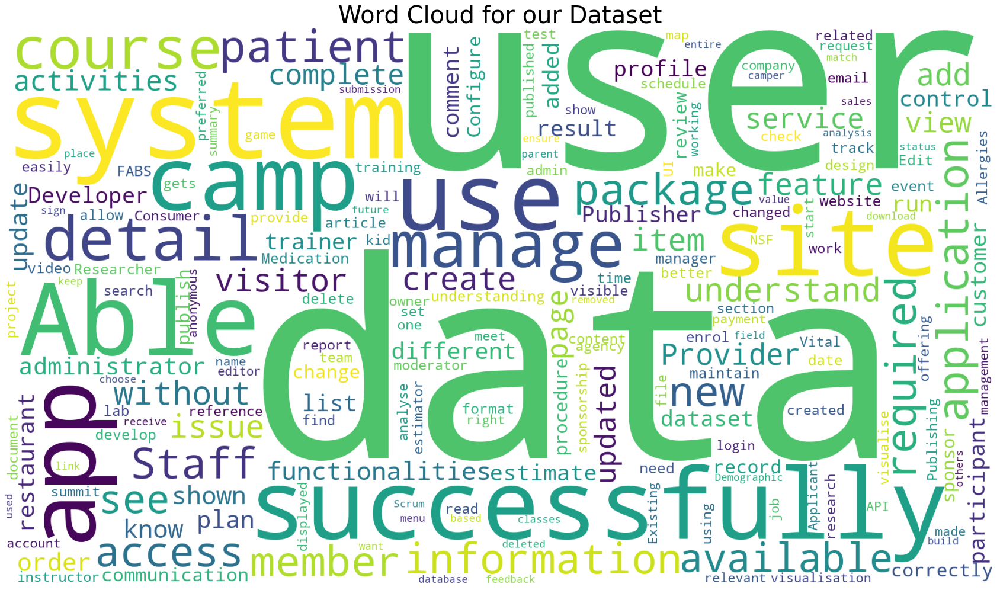

In [11]:
from matplotlib import pyplot as plt
from wordcloud import WordCloud,STOPWORDS
plt.figure(figsize=(30,20))
text =df['Requirements'].values
cloud = WordCloud(
                          stopwords=STOPWORDS,
                          background_color='white',
                          collocations=False,
                          width=1920,
                          height=1080
                         ).generate(" ".join(text))
plt.axis('off')
plt.title("Word Cloud for our Dataset",fontsize=40)
plt.imshow(cloud)

In [12]:
from collections import Counter
for i in range(8):
  print("Column:", df.columns[1:][i])
  print(Counter(labels[:,i]))

Column: obstructive<==>supportive
Counter({5: 359, 6: 357, 7: 312})
Column: complicated<==>easy
Counter({7: 288, 4: 261, 6: 257, 5: 222})
Column: inefficient<==>efficient
Counter({5: 277, 7: 264, 4: 253, 6: 234})
Column:  confusing<==>clear
Counter({7: 343, 6: 342, 5: 341, 4: 2})
Column: boring<==>exciting
Counter({5: 364, 4: 346, 3: 318})
Column: not interesting<==>interesting
Counter({4: 379, 6: 332, 5: 315, 3: 2})
Column: conventional<==>inventive
Counter({2: 268, 3: 267, 5: 253, 4: 240})
Column: usual<==>leading edge
Counter({3: 259, 5: 236, 6: 225, 4: 208, 2: 100})


# 2. Pre-processing
---

## 2.1. Tokenization

Tokenization means splitting each word and vectorizing a text corpus, by turning each text into either a sequence of integers (each integer being the index of a token in a dictionary). This process cleans up our text, lowercase, and remove punctuations. This step is basically the same from our previous work involving LSTMs.

This way, we can see which words appear the most in our training set.

In [13]:
tokenizer = Tokenizer(num_words = 2000, oov_token="<OOV>")
tokenizer.fit_on_texts(features)
word_index = tokenizer.word_index
dict(list(word_index.items())[:10])

{'<OOV>': 1,
 'the': 2,
 'i': 3,
 'can': 4,
 'a': 5,
 'that': 6,
 'as': 7,
 'to': 8,
 'and': 9,
 'so': 10}

After tokenization, the next step is to turn those tokens into lists of sequence.

In [14]:

sequences = tokenizer.texts_to_sequences(features)
print(sequences[0]) # This corresponds to the first sentence in the training data.

[7, 5, 69, 3, 4, 1599, 177, 827, 6, 652, 1182, 382, 1600, 10, 6, 267, 44, 103, 1601, 440, 89, 31, 9, 75, 2, 39, 23]


## 2.2. Padding

When we train neural networks for NLP, we need sequences to be in the same size, that's why we use padding. Padding means that we convert all instances of the training data towards the same size. To do this, we need to specify a fixed length to transform all the instances on.

For the project, we can set the sequence by looking quickly at the average proportion of the training words.

In [15]:
import math
word_counts = []
for i in (features):
  word_counts.append(len(i.split(" ")))
print("Average word counts:" , sum(word_counts)/len(word_counts))

# Round max length of padding to the nearest tenth
max_length = math.ceil((sum(word_counts)/len(word_counts))/10) * 10
print("Padded onto length: ", max_length)

# Delete unused variable
del word_counts 

Average word counts: 38.266536964980546
Padded onto length:  40




We can then proceed to do the actual padding. This is done for all instances of the training example.

In [16]:
padded = pad_sequences(sequences, maxlen=max_length, padding='post', truncating='post')

for i in range(5):
  print("Sequence of length", len(sequences[i]), "was padded onto", len(padded[i]))

Sequence of length 27 was padded onto 40
Sequence of length 31 was padded onto 40
Sequence of length 30 was padded onto 40
Sequence of length 32 was padded onto 40
Sequence of length 28 was padded onto 40


In [17]:
padded

array([[  7,   5,  69, ...,   0,   0,   0],
       [  7,   5,  69, ...,   0,   0,   0],
       [  7,   5,  69, ...,   0,   0,   0],
       ...,
       [  7,   5,  17, ...,  23,   0,   0],
       [  7,   5,  82, ...,   0,   0,   0],
       [  7,   5, 697, ...,   0,   0,   0]])

## 2.3. SMOTE Oversampling

Generally, oversampling makes fake data so that the minority labels are not squashed by the majority.

Constraint of using SMOTE within this dataset is that it's very fragile to classes with only one example. Since SMOTE works via k-nearest neighbors, at least two members of a class would be mandatory for it to work.

Synthetic samples generated with respect to the most amount of classes in all columns so that input shape (features and labels) are consistent against each other.

## REVISION: ROS Oversampling

ROS generates random data as opposed to the better, more superior SMOTE which generates "more credible" data. We can't use SMOTE on all sheets because of the `n_neighbors` and distance constraint.

We find the least common multiple of all class members amount, and oversample from there to get the matrix dimensions uniform.

In [18]:
import copy
from collections import defaultdict, Counter
from imblearn.over_sampling import SMOTE, RandomOverSampler
max_amount = np.lcm.reduce([1,2,3,4,5,6,7]) * 40
labels_processed = np.zeros((max_amount, 8))

for i in range(8):
  unique_classes = np.unique(df[df.columns[1:][i]])
  amount = [int(
      (max_amount/len(unique_classes)))
      ] * len(unique_classes)
  x = {k:v for (k,v) in zip(unique_classes, amount)}
  smt = RandomOverSampler(sampling_strategy=x)
  X, y = smt.fit_resample(padded, labels[:,i])
  labels_processed[:,i] = y
  print("Column", i, "done.")
  # We don't save nor use the X variable between each iteration, 
  # instead only using the last one.


print("Shape of input features is:", X.shape)
print("Shape of labels is:",labels_processed.shape)

Column 0 done.
Column 1 done.
Column 2 done.
Column 3 done.
Column 4 done.
Column 5 done.
Column 6 done.
Column 7 done.
Shape of input features is: (16800, 40)
Shape of labels is: (16800, 8)


In [19]:
# Sanity check time!
for i in range(8):
  print("For column", df.columns[1:][i])
  print(Counter(labels_processed[:,i]),"\n------")


print("First ten entries of the processed labels:\n", labels_processed[:10,:])
print("First ten entries of the processed features:\n", X[:10,:])

# Last and final assertion to catch matrix errors
try:
  assert(X.shape[0] == labels_processed.shape[0])
  print("Assertion completed!")
except AssertionError:
  print("Error!\nShape of X is", X.shape, "while labels is", labels_processed.shape)
  raise AssertionError

For column obstructive<==>supportive
Counter({6.0: 5600, 5.0: 5600, 7.0: 5600}) 
------
For column complicated<==>easy
Counter({5.0: 4200, 7.0: 4200, 4.0: 4200, 6.0: 4200}) 
------
For column inefficient<==>efficient
Counter({6.0: 4200, 5.0: 4200, 4.0: 4200, 7.0: 4200}) 
------
For column  confusing<==>clear
Counter({5.0: 4200, 6.0: 4200, 4.0: 4200, 7.0: 4200}) 
------
For column boring<==>exciting
Counter({5.0: 5600, 4.0: 5600, 3.0: 5600}) 
------
For column not interesting<==>interesting
Counter({4.0: 4200, 5.0: 4200, 3.0: 4200, 6.0: 4200}) 
------
For column conventional<==>inventive
Counter({4.0: 4200, 3.0: 4200, 2.0: 4200, 5.0: 4200}) 
------
For column usual<==>leading edge
Counter({3.0: 3360, 2.0: 3360, 4.0: 3360, 5.0: 3360, 6.0: 3360}) 
------
First ten entries of the processed labels:
 [[6. 5. 6. 5. 5. 4. 4. 3.]
 [5. 7. 6. 6. 5. 5. 3. 3.]
 [7. 7. 5. 4. 4. 5. 4. 3.]
 [6. 4. 4. 5. 4. 3. 2. 2.]
 [5. 5. 4. 4. 3. 4. 3. 3.]
 [6. 5. 6. 5. 5. 4. 4. 3.]
 [5. 7. 6. 6. 5. 5. 3. 3.]
 [6. 

## 2.4. Train-test Splitting

Finally we get to this part. We can use sklearn's `train_test_split` to do the usual splitting for test set (validation set is specified within building the model in the next section).

Also, specifying `random_state` ensures reproducibility.

In [20]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, labels_processed, test_size=0.2, random_state=42)

# Sanity check again and again
print("Training examples:", X_train.shape)
print("Training labels:", y_train.shape)
print("Test examples:", X_test.shape)
print("Test labels:", y_test.shape)

Training examples: (13440, 40)
Training labels: (13440, 8)
Test examples: (3360, 40)
Test labels: (3360, 8)


In [21]:
from itertools import zip_longest # zip_longest python 3

def dadd(d1,d2):
     temp=[i+j for i,j in zip_longest(d1,d2,fillvalue=0)]
     return temp
   

In [22]:
data = {'metric':['Accuracy', 'Precision', 'Recall', 'F1 Score','RMSE','AUC score']}
metric_df=pd.DataFrame(data)

In [23]:
metric_df.set_index(['metric'])


""
metric
Accuracy
Precision
Recall
F1 Score
RMSE
AUC score


In [24]:
metric_df

,metric
0,Accuracy
1,Precision
2,Recall
3,F1 Score
4,RMSE
5,AUC score


# 3. Modelling

## 3.1. Building the Model

Since we're training on augmented data, we're going to approach this as conventional regression compared to the LSTM approach we're doing it before.

LSTM model in this manner would result in a pretty bad metric score (around 0.5 to 0.7 F1-score) whereas our fully-connected dense layers resulted in a pretty satisfying F1, which is around 0.8 to 1 for each column.

In [25]:
# Wrapper functions for result interpretation
from matplotlib import pyplot as plt
def plot_graphs(history, string):
  plt.plot(history.history[string])
  plt.plot(history.history['val_'+string])
  plt.xlabel("Epochs")
  plt.ylabel(string)
  plt.legend([string, 'val_'+string])
  plt.show()

def transform_results(estimates):
  res = []
  for x in estimates:
    if x > 7:
      x = 7
      res.append(x)
    else:
      res.append(x)
  return res

In [26]:
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import classification_report
initializer = tf.keras.initializers.RandomNormal(seed=1) # Reproducibility

model = Sequential(name="classifier_NN")
model.add(tf.keras.Input(shape=(X_train.shape[1],))) # Automatically detect features as input nodes
model.add(layers.Dense(256, activation='relu', kernel_initializer=initializer))
#model.add(layers.Dropout(0.1))
model.add(layers.Dense(256, activation='relu', kernel_initializer=initializer))
#model.add(layers.Dropout(0.1))
model.add(layers.Dense(256, activation='relu', kernel_initializer=initializer))
model.add(layers.Dropout(0.1))
model.add(layers.Dense(256, activation='relu', kernel_initializer=initializer))
model.add(layers.Dropout(0.1))
model.add(layers.Dense(128, activation='relu', kernel_initializer=initializer))
model.add(layers.Dropout(0.1))
model.add(layers.Dense(128, activation='relu', kernel_initializer=initializer))
model.add(layers.Dropout(0.1))
model.add(layers.Dense(128, activation='relu', kernel_initializer=initializer))
model.add(layers.Dropout(0.15))
model.add(layers.Dense(8)) # output layer
opt = tf.keras.optimizers.Adam(learning_rate = 0.0005)
model.compile(loss=tf.keras.losses.MeanSquaredError(), metrics=['mae'], optimizer = opt)
model.summary()

Model: "classifier_NN"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 256)               10496     
_________________________________________________________________
dense_1 (Dense)              (None, 256)               65792     
_________________________________________________________________
dense_2 (Dense)              (None, 256)               65792     
_________________________________________________________________
dropout (Dropout)            (None, 256)               0         
_________________________________________________________________
dense_3 (Dense)              (None, 256)               65792     
_________________________________________________________________
dropout_1 (Dropout)          (None, 256)               0         
_________________________________________________________________
dense_4 (Dense)              (None, 128)             

Epoch 1/150
588/588 - 1s - loss: 3.3519 - mae: 1.4260 - val_loss: 1.8760 - val_mae: 1.0999
Epoch 2/150
588/588 - 1s - loss: 1.2627 - mae: 0.8761 - val_loss: 0.9391 - val_mae: 0.7676
Epoch 3/150
588/588 - 1s - loss: 0.8279 - mae: 0.7126 - val_loss: 0.5417 - val_mae: 0.5697
Epoch 4/150
588/588 - 1s - loss: 0.6604 - mae: 0.6323 - val_loss: 0.4964 - val_mae: 0.5380
Epoch 5/150
588/588 - 1s - loss: 0.5887 - mae: 0.5883 - val_loss: 0.5235 - val_mae: 0.5513
Epoch 6/150
588/588 - 1s - loss: 0.5304 - mae: 0.5558 - val_loss: 0.3709 - val_mae: 0.4605
Epoch 7/150
588/588 - 1s - loss: 0.4933 - mae: 0.5335 - val_loss: 0.3545 - val_mae: 0.4433
Epoch 8/150
588/588 - 1s - loss: 0.4703 - mae: 0.5182 - val_loss: 0.3645 - val_mae: 0.4476
Epoch 9/150
588/588 - 1s - loss: 0.4586 - mae: 0.5068 - val_loss: 0.3687 - val_mae: 0.4524
Epoch 10/150
588/588 - 1s - loss: 0.4443 - mae: 0.4996 - val_loss: 0.3193 - val_mae: 0.4014
Epoch 11/150
588/588 - 1s - loss: 0.4220 - mae: 0.4821 - val_loss: 0.3271 - val_mae: 0.41

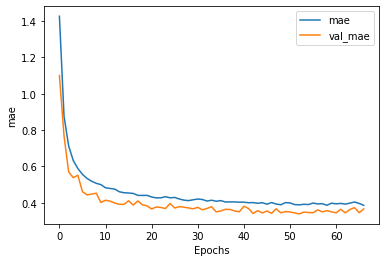

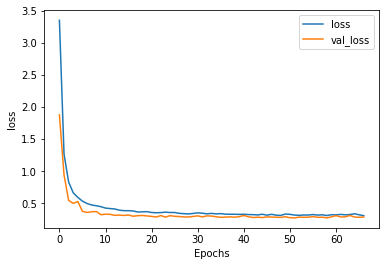

In [27]:
es = tf.keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=15)
history = model.fit(X_train, y_train, epochs=150, batch_size = 16, validation_split=0.3, 
                    callbacks = [es], # Call checkpoint variable if neccessary
                    verbose=2)

plot_graphs(history, "mae")
plot_graphs(history, "loss")

## 3.2. Result Interpretation and Evaluation

Here we evaluate on `y_test`, which we made sure earlier comes from a similar distribution within the training set itself. 

Resulted on a pretty confident `mae` and `mse`, which I would say a good result considering the number of classes we have.

In [28]:
scores = model.evaluate(
    X_test, y_test, batch_size=1, verbose=1, sample_weight=None, steps=None,
    callbacks=None, max_queue_size=10, workers=4, use_multiprocessing=False,
    return_dict=False
)
print("------------------ EVALUATION FINISHED! ------------------".center(115))
for i in range(len(scores)):
    print("%s: %.2f%%" % (model.metrics_names[i], scores[i]*100))

3360/3360 [==============================] - 2s 662us/step - loss: 0.2774 - mae: 0.3599
                             ------------------ EVALUATION FINISHED! ------------------                            
loss: 27.74%
mae: 35.99%


# 3.3. Prepare the Plotting Set

Due to the multi-dimensional nature of our results and test set, we need to reshape the predictions by using `numpy`'s `flatten()` attribute, which flattens the array column-wise if we specify the argument `order='F'` to flatten in Fortran-style order.

Keep in mind this will indeed aggregate the metrics like on the `classification_report()` below.

In [29]:
y_pred = model.predict(X_test)
y_pred_flattened = y_pred.flatten(order='F')
y_test_flattened = y_test.flatten(order='F')
y_classified = [round(float(x)) for x in y_pred_flattened]

print("First ten examples of the test set:")
print("Truth labels:", y_test_flattened[:10])
print("Predicted labels:",y_classified[:10])
print("Overall performance on all columns:\n", classification_report(y_test_flattened, y_classified))

First ten examples of the test set:
Truth labels: [5. 5. 5. 5. 6. 6. 6. 6. 6. 5.]
Predicted labels: [5, 5, 5, 5, 6, 6, 6, 6, 6, 6]
Overall performance on all columns:
               precision    recall  f1-score   support

         2.0       0.97      0.86      0.91      1507
         3.0       0.84      0.75      0.79      3519
         4.0       0.75      0.75      0.75      6107
         5.0       0.70      0.71      0.71      7077
         6.0       0.62      0.78      0.69      5162
         7.0       0.90      0.66      0.76      3508

    accuracy                           0.74     26880
   macro avg       0.80      0.75      0.77     26880
weighted avg       0.75      0.74      0.74     26880



In [30]:
# Wrapper function(s) from earlier notebook
from tensorflow.keras.utils import to_categorical
from sklearn.metrics import roc_curve, auc,roc_auc_score
import seaborn as sns
import matplotlib.pyplot as plt

avgroc=dict()

def plot_multiclass_roc_avg(fpr,tpr,n_classes,figsize=(17, 6)):
  roc_auc = dict()
  target_names = [2,3,4,5,6,7]
  for i in range(n_classes):
      roc_auc[i] = auc(fpr[i], tpr[i])
  fig, ax = plt.subplots(figsize=figsize)
  ax.plot([0, 1], [0, 1], 'k--')
  ax.set_xlim([0.0, 1.0])
  ax.set_ylim([0.0, 1.05])
  ax.set_xlabel('False Positive Rate')
  ax.set_ylabel('True Positive Rate')
  ax.set_title('Receiver operating characteristic')
    
  for i in range(len(target_names)):
    ax.plot(fpr[i], tpr[i], label='ROC curve (area = %0.2f) for %s' % (roc_auc[i], target_names[i]))
#     ax.plot(fpr[i], tpr[i], label='ROC curve (area = %0.2f) for' % (roc_auc[i]))
  
  ax.legend(loc="best")
  ax.grid(alpha=.4)
  sns.despine()
  plt.show()


def plot_multiclass_roc(clf, X_test, y_test, n_classes, figsize=(17, 6)):
  """
  Modified function behavior, now predicts column-wise
  """
  y_score = clf.predict_proba(X_test)
  target_names = np.unique(y_test)
  # structures
  fpr = dict()
  tpr = dict()
  roc_auc = dict()

  # calculate dummies once
  y_test_dummies = pd.get_dummies(y_test, drop_first=False).values
  print(y_test_dummies.shape, y_score.shape)
  for i in range(n_classes):
      fpr[i], tpr[i], _ = roc_curve(y_test_dummies[:, i], y_score[:, i])
      roc_auc[i] = auc(fpr[i], tpr[i])

      
# roc for each class
  fig, ax = plt.subplots(figsize=figsize)
  ax.plot([0, 1], [0, 1], 'k--')
  ax.set_xlim([0.0, 1.0])
  ax.set_ylim([0.0, 1.05])
  ax.set_xlabel('False Positive Rate')
  ax.set_ylabel('True Positive Rate')
  ax.set_title('Receiver operating characteristic')
    
  for i in range(len(target_names)):
    ax.plot(fpr[i], tpr[i], label='ROC curve (area = %0.2f) for %s' % (roc_auc[i], target_names[i]))
  
  ax.legend(loc="best")
  ax.grid(alpha=.4)
  sns.despine()
  plt.show()

  return fpr,tpr

def plot_multiclass_roc_LSTM(X_test, y_test, n_classes, figsize=(17, 6), model=model):
  """
  Custom-made function to plot ROC curve.
  Sorry I can't run because I don't have the excel file used for this particular notebook.
  """
  y_score = to_categorical(y_test)
  target_names = ["obstructive vs supportive",
                  "complicated vs easy",
                  "inefficient vs efficient",
                  " confusing vs clear",
                  "boring vs exciting",
                  "not interesting vs interesting",
                  "conventional vs inventive",
                  "usual vs leading edge"]
  # structures
  fpr = dict()
  tpr = dict()
  roc_auc = dict()
 
  # One-liner transformation of our existing result 
  y_test_dummies = np.pad(pd.get_dummies(y_classified, drop_first=False).values, 
                          ((0,0), 
                           (min(labels.flatten()),0)))
  print(y_test_dummies.shape, y_score.shape) # Quick debug purposes after one-hot encoding
                                             # to ensure matrix dimension is right
  for i in range(1, n_classes):
      fpr[i], tpr[i], _ = roc_curve(y_test_dummies[:, i], y_score[:, i])
      roc_auc[i] = auc(fpr[i], tpr[i])
  
# roc for each class
  fig, ax = plt.subplots(figsize=figsize)
  ax.plot([0, 1], [0, 1], 'k--')
  ax.set_xlim([0.0, 1.0])
  ax.set_ylim([0.0, 1.05])
  ax.set_xlabel('False Positive Rate')
  ax.set_ylabel('True Positive Rate')
  ax.set_title('Column-wise Receiver Operating Characteristic Plot')
    
  for i in range(1, len(target_names)):
    ax.plot(fpr[i], tpr[i], label='ROC curve (area = %0.2f) for %s' % (roc_auc[i], target_names[i]))
  
  ax.legend(loc="best")
  ax.grid(alpha=.4)
  sns.despine()
  plt.show()


# plot_multiclass_roc_LSTM(X_test, y_classified, 8, figsize=(17, 6))

ROC AUC score: 0.8345634389264462


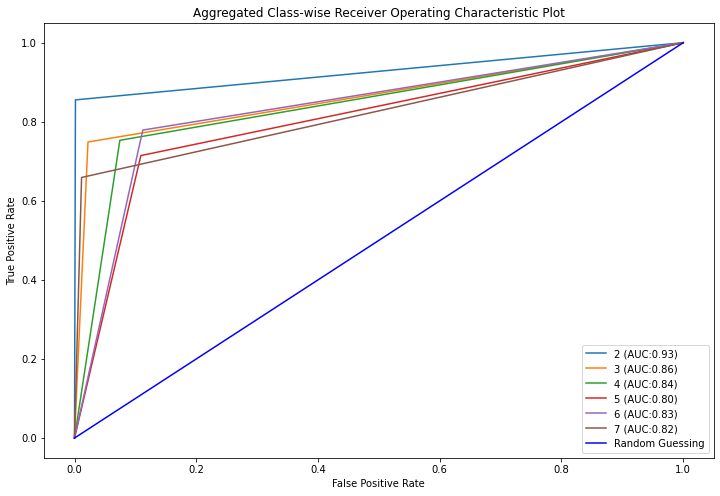

In [31]:
from sklearn.preprocessing import LabelBinarizer
from sklearn.metrics import roc_curve, auc, roc_auc_score


def score_auc(y_test, y_pred, average="weighted"):
    lb = LabelBinarizer()
    lb.fit(y_test)
    y_test = lb.transform(y_test)
    y_pred = lb.transform(y_pred)
    return roc_auc_score(y_test, y_pred, average=average)

fig, c_ax = plt.subplots(1,1, figsize = (12, 8))
def multiclass_roc_auc_score(y_test, y_pred, average="weighted"):
    lb = LabelBinarizer()
    lb.fit(y_test)
    y_test = lb.transform(y_test)
    y_pred = lb.transform(y_pred)

    for (idx, c_label) in enumerate(set(labels.flatten())):
        fpr, tpr, thresholds = roc_curve(y_test[:,idx].astype(int), y_pred[:,idx])
        c_ax.plot(fpr, tpr, label = '%s (AUC:%0.2f)'  % (c_label, auc(fpr, tpr)))
    c_ax.plot(fpr, fpr, 'b-', label = 'Random Guessing')
    return roc_auc_score(y_test, y_pred, average=average)

print('ROC AUC score:', multiclass_roc_auc_score(y_test_flattened, y_classified))
c_ax.legend()
c_ax.set_xlabel('False Positive Rate')
c_ax.set_ylabel('True Positive Rate')
c_ax.set_title('Aggregated Class-wise Receiver Operating Characteristic Plot')
plt.savefig("auc.png")
plt.show()

In [32]:
from sklearn.metrics import confusion_matrix,f1_score, precision_score, recall_score, classification_report
from sklearn.metrics import plot_confusion_matrix, accuracy_score
from sklearn.metrics import mean_squared_error
acc=[]
pre=[]
recal=[]
f1=[]
rms=[]
aucscore=[]

We can also print classification report from each column.

In [33]:
from sklearn.metrics import classification_report, f1_score
y_pred = model.predict(X_test)
for i in range(8):
    print("Column", df.columns[1:][i])
    estimates = [round(float(x)) for x in y_pred[:,i]]
    estimates = transform_results(estimates)
    print(np.unique(estimates))
    acc.append(accuracy_score(y_test[:,i], estimates))
    pre.append(precision_score(y_test[:,i], estimates,average='weighted'))
    recal.append(recall_score(y_test[:,i], estimates,average='weighted'))
    f1.append(f1_score(y_test[:,i], estimates,average='weighted'))
    rms.append(np.sqrt(mean_squared_error(y_test[:,i], estimates)))
    aucscore.append(score_auc(y_test[:,i], estimates))
    print(classification_report(y_test[:,i], estimates), "\n------")

Column obstructive<==>supportive
[5 6 7]
              precision    recall  f1-score   support

         5.0       0.81      0.84      0.83      1112
         6.0       0.70      0.71      0.71      1171
         7.0       0.83      0.78      0.80      1077

    accuracy                           0.78      3360
   macro avg       0.78      0.78      0.78      3360
weighted avg       0.78      0.78      0.78      3360
 
------
Column complicated<==>easy
[4 5 6 7]
              precision    recall  f1-score   support

         4.0       0.95      0.78      0.86       834
         5.0       0.68      0.53      0.60       875
         6.0       0.51      0.88      0.65       842
         7.0       0.94      0.61      0.74       809

    accuracy                           0.70      3360
   macro avg       0.77      0.70      0.71      3360
weighted avg       0.77      0.70      0.71      3360
 
------
Column inefficient<==>efficient
[4 5 6 7]
              precision    recall  f1-score   su

In [34]:
print("average Accuracy :{}".format(np.mean(acc)))
print("average Precision :{}".format(np.mean(pre)))
print("average Recall :{}".format(np.mean(recal)))
print("average F1 -score :{}".format(np.mean(f1)))
print("average RMSE -score :{}".format(np.mean(rms)))
print("average AUC -score :{}".format(np.mean(aucscore)))
metric_df['Neural network classifier'] = [np.mean(acc),np.mean(pre),np.mean(recal),np.mean(f1),np.mean(rms),np.mean(aucscore)]

average Accuracy :0.7407738095238096
average Precision :0.7809407061923138
average Recall :0.7407738095238096
average F1 -score :0.7452909376633461
average RMSE -score :0.5715150782560454
average AUC -score :0.8226761589960602


## 3.4. Exporting the Model

We can export the model to `HDF5` format designed to store large amounts of information. More info:
* [Wikipedia](https://en.wikipedia.org/wiki/Hierarchical_Data_Format)
* [TensorFlow Documentation](https://www.tensorflow.org/tutorials/keras/save_and_load#hdf5_format)

In [35]:
model.save('UX_Regression.h5')

In [36]:

ffpo=dict()
ttpo=dict()
temp=[]


## 3.5. XGB Method
For comparison, we try implementing XGB.

For column: obstructive<==>supportive
[17:21:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
              precision    recall  f1-score   support

         5.0       0.82      0.88      0.85      1112
         6.0       0.82      0.67      0.74      1171
         7.0       0.81      0.91      0.86      1077

    accuracy                           0.81      3360
   macro avg       0.82      0.82      0.81      3360
weighted avg       0.82      0.81      0.81      3360

Confusion Matrix: 
 [[976  98  38]
 [193 783 195]
 [ 27  71 979]]
Accuracy Score : 0.8148809523809524
Precision Score : 0.8156331471647071
Recall Score : 0.8148809523809524
F1 Score : 0.8111637581744109
(3360, 3) (3360, 3)


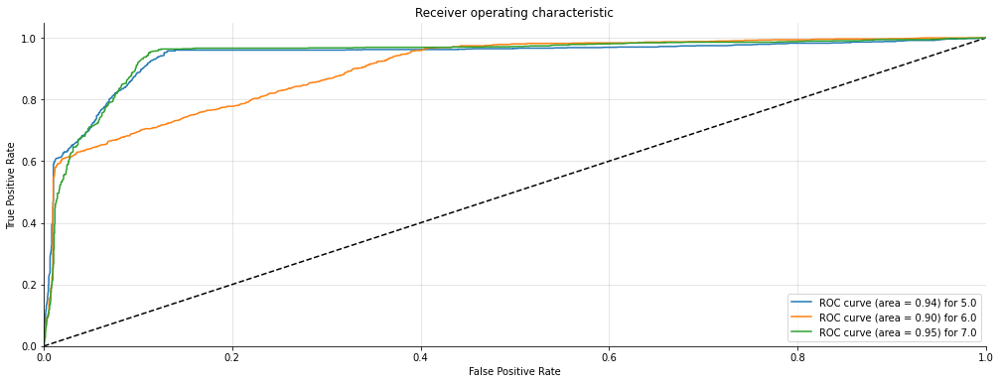

For column: complicated<==>easy
[17:21:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
              precision    recall  f1-score   support

         4.0       0.95      0.80      0.87       834
         5.0       0.66      0.72      0.69       875
         6.0       0.63      0.75      0.69       842
         7.0       0.90      0.77      0.83       809

    accuracy                           0.76      3360
   macro avg       0.79      0.76      0.77      3360
weighted avg       0.78      0.76      0.77      3360

Confusion Matrix: 
 [[666 142  18   8]
 [ 23 633 197  22]
 [  3 162 634  43]
 [  8  17 158 626]]
Accuracy Score : 0.7616071428571428
Precision Score : 0.7823519433179832
Recall Score : 0.7616071428571428
F1 Score : 0.76753

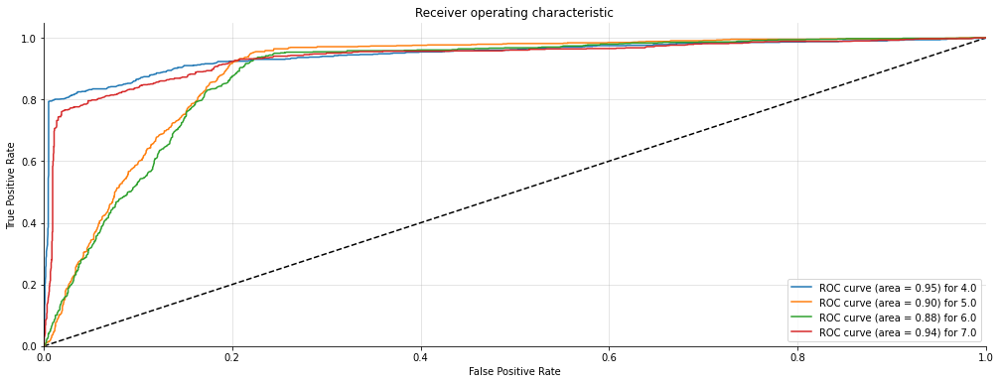

For column: inefficient<==>efficient
[17:21:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
              precision    recall  f1-score   support

         4.0       0.94      0.79      0.86       829
         5.0       0.67      0.71      0.69       882
         6.0       0.63      0.77      0.69       847
         7.0       0.90      0.78      0.83       802

    accuracy                           0.76      3360
   macro avg       0.78      0.76      0.77      3360
weighted avg       0.78      0.76      0.77      3360

Confusion Matrix: 
 [[658 147  14  10]
 [ 26 629 212  15]
 [  6 148 648  45]
 [  9  13 158 622]]
Accuracy Score : 0.7610119047619047
Precision Score : 0.7812987613984963
Recall Score : 0.7610119047619047
F1 Score : 0.

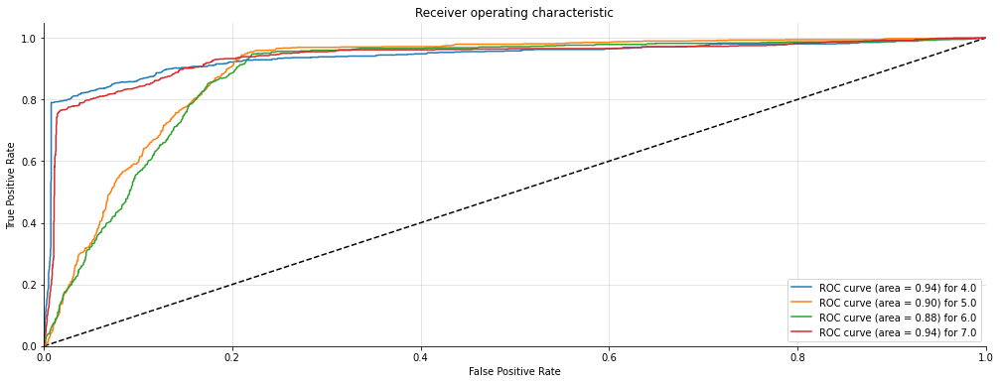

For column:  confusing<==>clear
[17:21:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
              precision    recall  f1-score   support

         4.0       0.90      0.80      0.84       839
         5.0       0.61      0.71      0.65       863
         6.0       0.64      0.70      0.67       838
         7.0       0.92      0.77      0.84       820

    accuracy                           0.74      3360
   macro avg       0.77      0.74      0.75      3360
weighted avg       0.76      0.74      0.75      3360

Confusion Matrix: 
 [[670 168   1   0]
 [ 57 610 177  19]
 [ 12 198 590  38]
 [  9  25 156 630]]
Accuracy Score : 0.7440476190476191
Precision Score : 0.7632340585357217
Recall Score : 0.7440476190476191
F1 Score : 0.75001

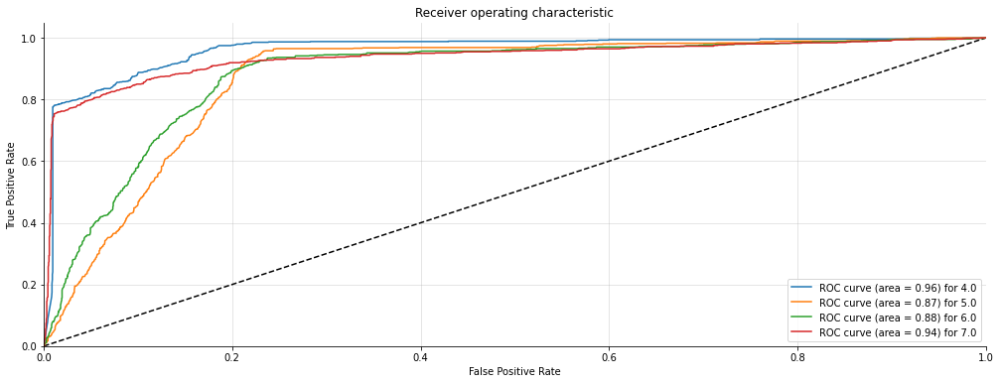

For column: boring<==>exciting
[17:21:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
              precision    recall  f1-score   support

         3.0       0.82      0.89      0.85      1121
         4.0       0.82      0.66      0.73      1174
         5.0       0.80      0.90      0.84      1065

    accuracy                           0.81      3360
   macro avg       0.81      0.81      0.81      3360
weighted avg       0.81      0.81      0.81      3360

Confusion Matrix: 
 [[998  89  34]
 [193 771 210]
 [ 29  81 955]]
Accuracy Score : 0.8107142857142857
Precision Score : 0.8116638772985485
Recall Score : 0.8107142857142857
F1 Score : 0.8066097310956631
(3360, 3) (3360, 3)


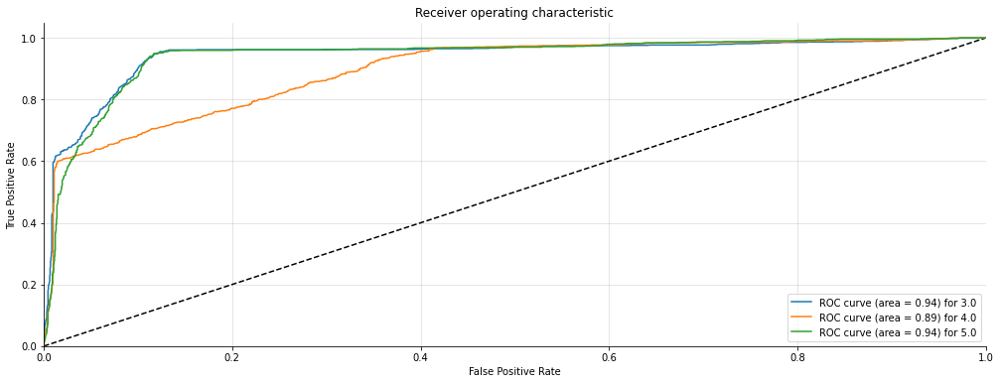

For column: not interesting<==>interesting
[17:21:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
              precision    recall  f1-score   support

         3.0       0.89      0.80      0.85       840
         4.0       0.61      0.70      0.65       863
         5.0       0.64      0.72      0.67       838
         6.0       0.92      0.76      0.83       819

    accuracy                           0.74      3360
   macro avg       0.76      0.74      0.75      3360
weighted avg       0.76      0.74      0.75      3360

Confusion Matrix: 
 [[674 166   0   0]
 [ 62 600 179  22]
 [  9 195 600  34]
 [  9  25 161 624]]
Accuracy Score : 0.743452380952381
Precision Score : 0.7626410772560053
Recall Score : 0.743452380952381
F1 Score 

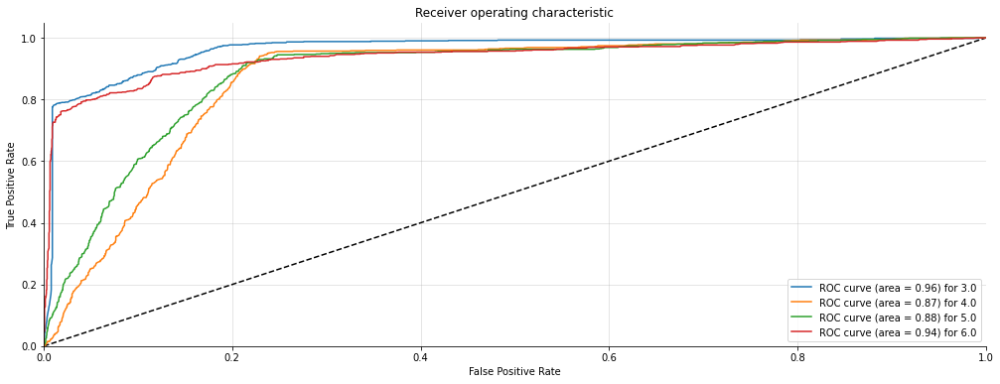

For column: conventional<==>inventive
[17:21:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
              precision    recall  f1-score   support

         2.0       0.96      0.80      0.87       832
         3.0       0.67      0.72      0.69       881
         4.0       0.63      0.75      0.69       842
         5.0       0.88      0.79      0.83       805

    accuracy                           0.76      3360
   macro avg       0.79      0.76      0.77      3360
weighted avg       0.78      0.76      0.77      3360

Confusion Matrix: 
 [[663 142  21   6]
 [ 18 635 204  24]
 [  2 153 634  53]
 [  6  18 146 635]]
Accuracy Score : 0.7639880952380952
Precision Score : 0.7838809874527378
Recall Score : 0.7639880952380952
F1 Score : 0

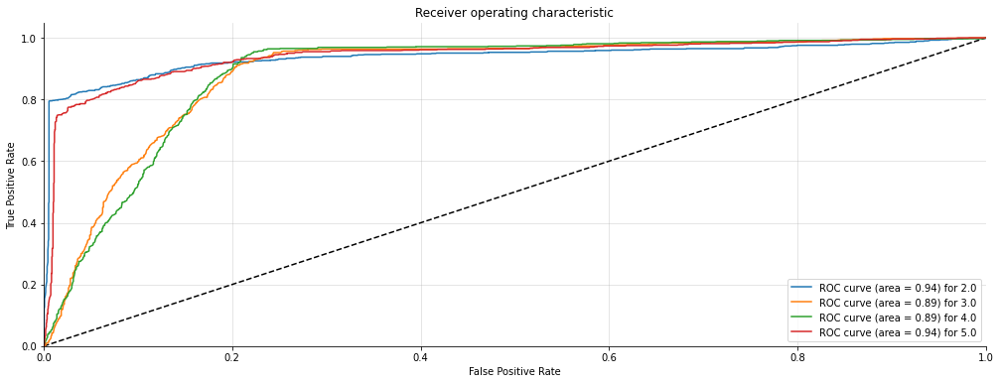

For column: usual<==>leading edge
[17:21:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
              precision    recall  f1-score   support

         2.0       1.00      1.00      1.00       675
         3.0       1.00      1.00      1.00       677
         4.0       0.99      1.00      1.00       726
         5.0       1.00      1.00      1.00       637
         6.0       1.00      0.99      1.00       645

    accuracy                           1.00      3360
   macro avg       1.00      1.00      1.00      3360
weighted avg       1.00      1.00      1.00      3360

Confusion Matrix: 
 [[675   0   0   0   0]
 [  0 677   0   0   0]
 [  0   0 726   0   0]
 [  0   0   0 636   1]
 [  0   0   5   0 640]]
Accuracy Score : 0.99821428571

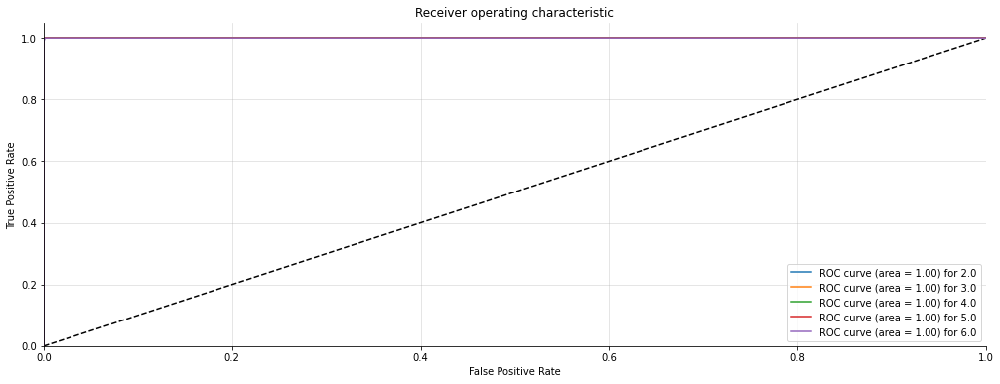

In [37]:
from xgboost import XGBClassifier
from sklearn.svm import SVC, LinearSVC
from sklearn.metrics import confusion_matrix,f1_score, precision_score, recall_score, classification_report
from sklearn.metrics import plot_confusion_matrix, accuracy_score
from sklearn.metrics import mean_squared_error
from operator import add




acc=[]
pre=[]
recal=[]
f1=[]
rms=[]
aucscore=[]
fpo=dict()
tpo=dict()
ffpo=[]
ttpo=[]
def XGBmodel(X_train, X_test, y_train, y_test, n_classes,ffpo,ttpo, figsize=(8, 6)):
    xgb_classifier = XGBClassifier()
    xgb_classifier.fit(X_train, y_train)

    # predictions over test set
    predictions = [round(float(x)) for x in xgb_classifier.predict(X_test)]
    print((classification_report(y_test, predictions)))


    # calculating Accuracy Score, Precision Score, Recall Score and F1 Score
    print('Confusion Matrix: \n' ,confusion_matrix(y_test, predictions))
    acc.append(accuracy_score(y_test, predictions))
    print(f'Accuracy Score : {accuracy_score(y_test, predictions)}')
    pre.append(precision_score(y_test,predictions,average='weighted'))
    print('Precision Score : ' + str(precision_score(y_test,predictions,average='weighted')))
    recal.append(recall_score(y_test,predictions,average='weighted'))
    print('Recall Score : ' + str(recall_score(y_test,predictions,average='weighted')))
    f1.append(f1_score(y_test,predictions,average='weighted'))
    print('F1 Score : ' + str(f1_score(y_test,predictions,average='weighted')))
    rms.append(np.sqrt(mean_squared_error(y_test,predictions)))
    aucscore.append(score_auc(y_test,predictions))
    fpo,tpo=plot_multiclass_roc(xgb_classifier, X_test, y_test, n_classes)
    ffpo.append(fpo)
    ttpo.append(tpo)
    
for i in range(8):
  print('For column:', df.columns[1:][i])
  n_classes = len(np.unique(df[df.columns[1:][i]]))
  XGBmodel(X_train, X_test, y_train[:,i], y_test[:,i], n_classes,ffpo,ttpo, figsize=(8, 6))


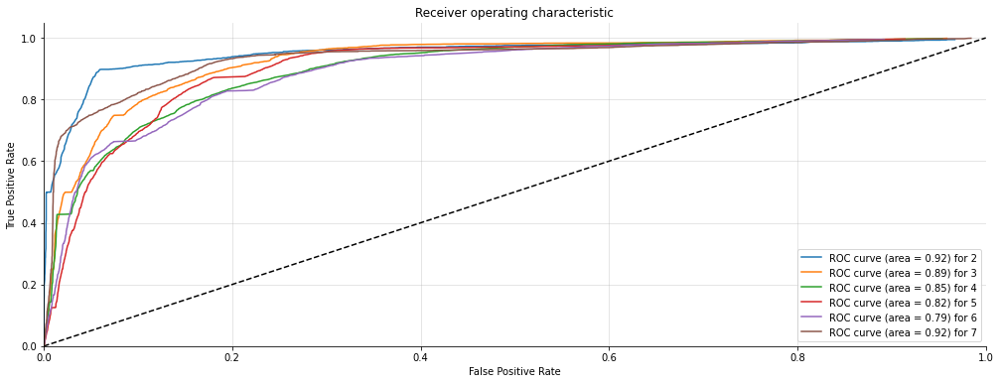

In [40]:
fsum5=list(np.array(dadd(dadd(dadd(ffpo[0][0],ffpo[1][1]),dadd(ffpo[2][1],ffpo[3][1])),dadd(dadd(ffpo[4][2],ffpo[5][2]),dadd(ffpo[6][3],ffpo[7][3]))))/8)
fsum6=list(np.array(dadd(dadd(dadd(ffpo[0][1],ffpo[1][2]),dadd(ffpo[2][2],ffpo[3][2])),dadd(dadd([0],ffpo[5][3]),dadd([0],ffpo[7][4]))))/6)
fsum7=list(np.array(dadd(dadd(dadd(ffpo[0][2],ffpo[1][3]),dadd(ffpo[2][3],ffpo[3][3])),dadd(dadd([0],[0]),dadd([0],[0]))))/4)
fsum4=list(np.array(dadd(dadd(dadd([0],ffpo[1][0]),dadd(ffpo[2][0],ffpo[3][0])),dadd(dadd(ffpo[4][1],ffpo[5][1]),dadd(ffpo[6][2],ffpo[7][2]))))/7)
fsum3=list(np.array(dadd(dadd(dadd([0],[0]),dadd([0],[0])),dadd(dadd(ffpo[4][0],ffpo[5][0]),dadd(ffpo[6][1],ffpo[7][1]))))/4)
fsum2=list(np.array(dadd(dadd(dadd([0],[0]),dadd([0],[0])),dadd(dadd([0],[0]),dadd(ffpo[6][0],ffpo[7][0]))))/2)




fpr=dict()

fsum2.sort()
fpr[0]=fsum2

fsum3.sort()
fpr[1]=fsum3

fsum4.sort()
fpr[2]=fsum4

fsum5.sort()
fpr[3]=fsum5

fsum6.sort()
fpr[4]=fsum6

fsum7.sort()
fpr[5]=fsum7











tsum5=list(np.array(dadd(dadd(dadd(ttpo[0][0],ttpo[1][1]),dadd(ttpo[2][1],ttpo[3][1])),dadd(dadd(ttpo[4][2],ttpo[5][2]),dadd(ttpo[6][3],ttpo[7][3]))))/8)
tsum6=list(np.array(dadd(dadd(dadd(ttpo[0][1],ttpo[1][2]),dadd(ttpo[2][2],ttpo[3][2])),dadd(dadd([0],ttpo[5][3]),dadd([0],ttpo[7][4]))))/6)
tsum7=list(np.array(dadd(dadd(dadd(ttpo[0][2],ttpo[1][3]),dadd(ttpo[2][3],ttpo[3][3])),dadd(dadd([0],[0]),dadd([0],[0]))))/4)
tsum4=list(np.array(dadd(dadd(dadd([0],ttpo[1][0]),dadd(ttpo[2][0],ttpo[3][0])),dadd(dadd(ttpo[4][1],ttpo[5][1]),dadd(ttpo[6][2],ttpo[7][2]))))/7)
tsum3=list(np.array(dadd(dadd(dadd([0],[0]),dadd([0],[0])),dadd(dadd(ttpo[4][0],ttpo[5][0]),dadd(ttpo[6][1],ttpo[7][1]))))/4)
tsum2=list(np.array(dadd(dadd(dadd([0],[0]),dadd([0],[0])),dadd(dadd([0],[0]),dadd(ttpo[6][0],ttpo[7][0]))))/2)


tpr=dict()

tsum2.sort()
tpr[0]=tsum2

tsum3.sort()
tpr[1]=tsum3

tsum4.sort()
tpr[2]=tsum4

tsum5.sort()
tpr[3]=tsum5

tsum6.sort()
tpr[4]=tsum6

tsum7.sort()
tpr[5]=tsum7


plot_multiclass_roc_avg(fpr,tpr,6)

In [41]:
print("average Accuracy :{}".format(np.mean(acc)))
print("average Precision :{}".format(np.mean(pre)))
print("average Recall :{}".format(np.mean(recal)))
print("average F1 -score :{}".format(np.mean(f1)))
print("average RMSE -score :{}".format(np.mean(rms)))
print("average AUC -score :{}".format(np.mean(aucscore)))
metric_df['XGB'] = [np.mean(acc),np.mean(pre),np.mean(recal),np.mean(f1),np.mean(rms),np.mean(aucscore)]

average Accuracy :0.7997395833333334
average Precision :0.8123658074264175
average Recall :0.7997395833333334
average F1 -score :0.8024162236825774
average RMSE -score :0.4909674252162518
average AUC -score :0.8622102069982376


## 3.6. SVM Method

For column: obstructive<==>supportive
              precision    recall  f1-score   support

         5.0       0.82      0.79      0.80      1112
         6.0       0.74      0.64      0.69      1171
         7.0       0.72      0.85      0.78      1077

    accuracy                           0.76      3360
   macro avg       0.76      0.76      0.76      3360
weighted avg       0.76      0.76      0.75      3360

Confusion Matrix: 
 [[883 141  88]
 [155 746 270]
 [ 45 120 912]]
Accuracy Score : 0.75625
Precision Score : 0.7581972546413719
Recall Score : 0.75625
F1 Score : 0.7541198004028121
(3360, 3) (3360, 3)


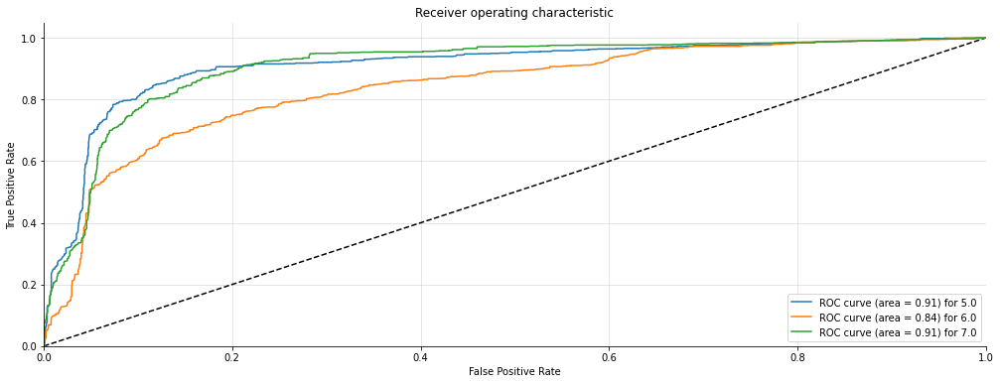

(3360, 3) (3360, 3)


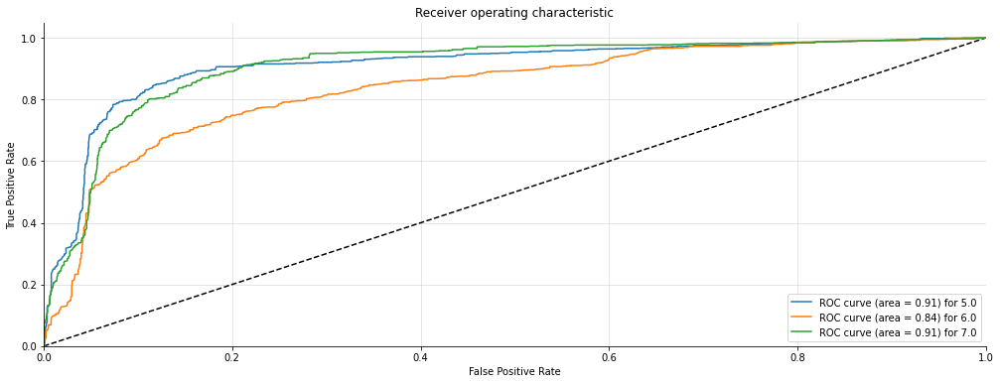

For column: complicated<==>easy
              precision    recall  f1-score   support

         4.0       0.92      0.78      0.85       834
         5.0       0.64      0.61      0.62       875
         6.0       0.54      0.70      0.61       842
         7.0       0.77      0.69      0.73       809

    accuracy                           0.69      3360
   macro avg       0.72      0.69      0.70      3360
weighted avg       0.71      0.69      0.70      3360

Confusion Matrix: 
 [[652 114  48  20]
 [ 31 531 262  51]
 [ 11 149 588  94]
 [ 14  42 194 559]]
Accuracy Score : 0.6934523809523809
Precision Score : 0.7148269338776347
Recall Score : 0.6934523809523809
F1 Score : 0.6995137563488772
(3360, 4) (3360, 4)


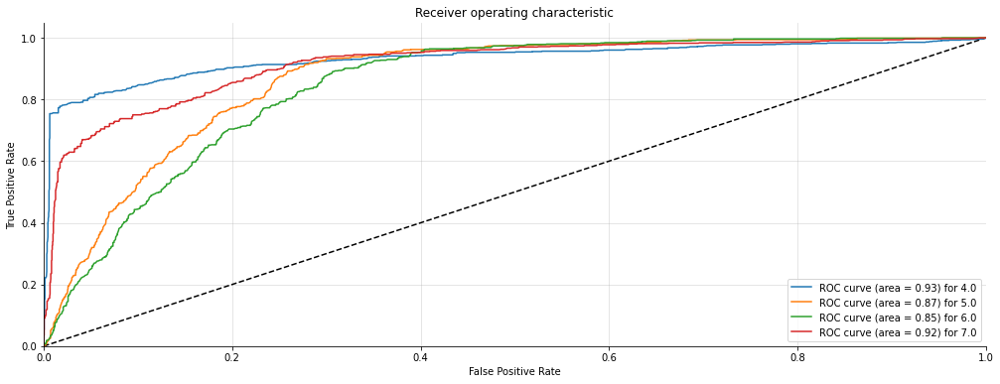

(3360, 4) (3360, 4)


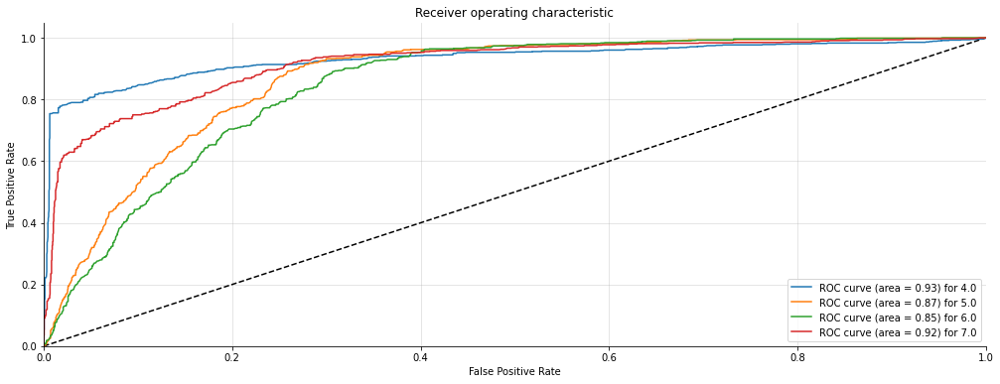

For column: inefficient<==>efficient
              precision    recall  f1-score   support

         4.0       0.92      0.78      0.84       829
         5.0       0.63      0.61      0.62       882
         6.0       0.54      0.68      0.60       847
         7.0       0.76      0.69      0.73       802

    accuracy                           0.69      3360
   macro avg       0.71      0.69      0.70      3360
weighted avg       0.71      0.69      0.70      3360

Confusion Matrix: 
 [[646 122  43  18]
 [ 31 538 257  56]
 [ 13 154 580 100]
 [ 15  34 198 555]]
Accuracy Score : 0.6901785714285714
Precision Score : 0.7099654366529674
Recall Score : 0.6901785714285714
F1 Score : 0.6960284350066627
(3360, 4) (3360, 4)


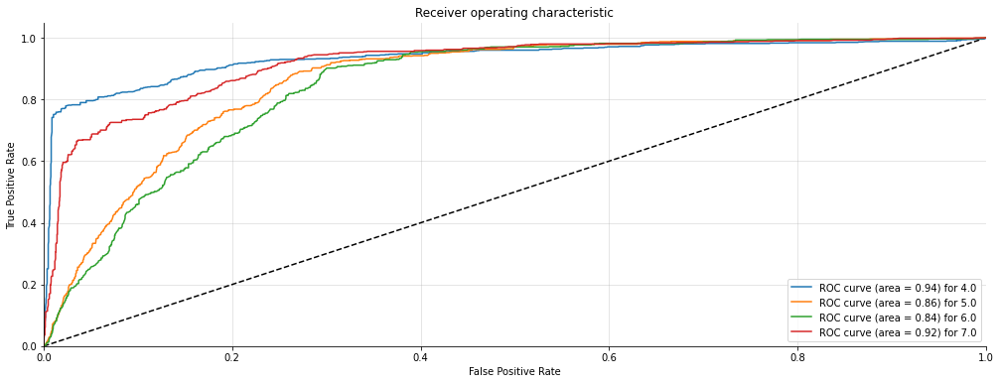

(3360, 4) (3360, 4)


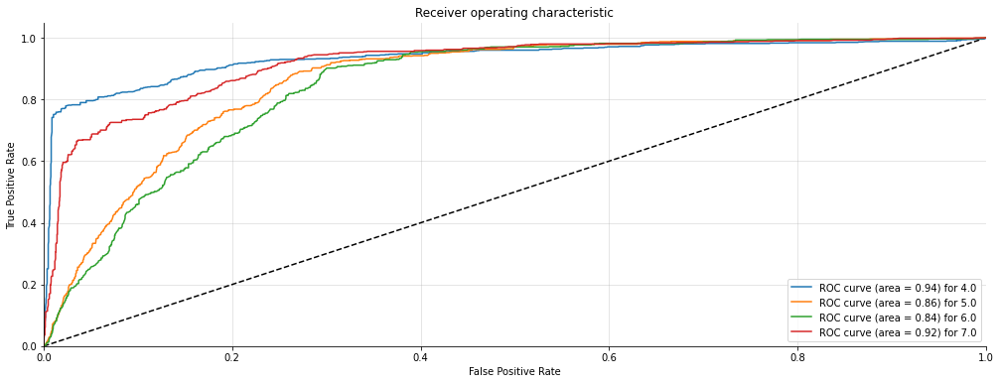

For column:  confusing<==>clear
              precision    recall  f1-score   support

         4.0       0.87      0.77      0.82       839
         5.0       0.58      0.63      0.61       863
         6.0       0.54      0.62      0.58       838
         7.0       0.80      0.68      0.74       820

    accuracy                           0.68      3360
   macro avg       0.70      0.68      0.68      3360
weighted avg       0.69      0.68      0.68      3360

Confusion Matrix: 
 [[648 142  34  15]
 [ 58 547 215  43]
 [ 26 205 522  85]
 [ 17  49 193 561]]
Accuracy Score : 0.6779761904761905
Precision Score : 0.6945440513449623
Recall Score : 0.6779761904761905
F1 Score : 0.6835406070971626
(3360, 4) (3360, 4)


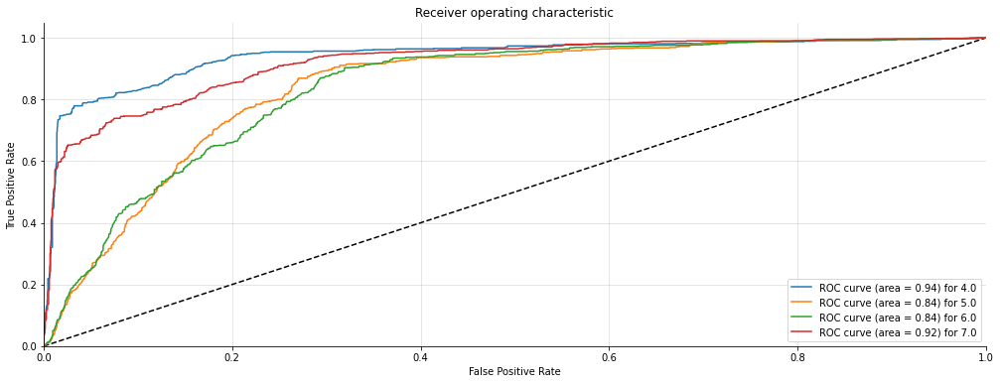

(3360, 4) (3360, 4)


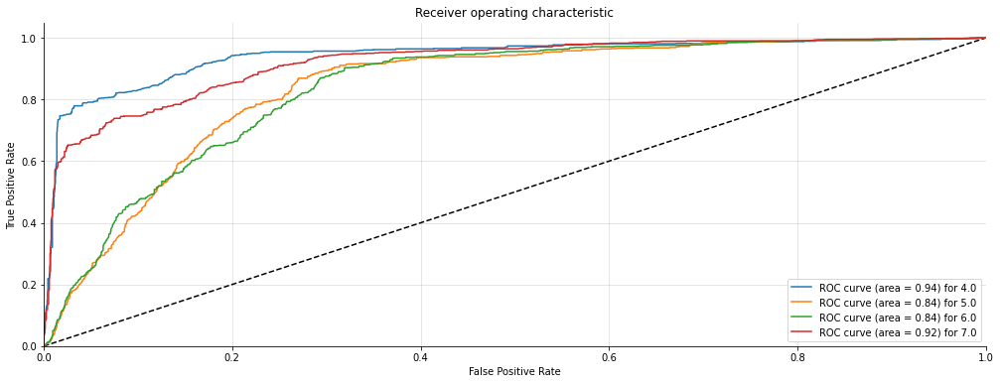

For column: boring<==>exciting
              precision    recall  f1-score   support

         3.0       0.81      0.81      0.81      1121
         4.0       0.74      0.62      0.67      1174
         5.0       0.70      0.83      0.76      1065

    accuracy                           0.75      3360
   macro avg       0.75      0.75      0.75      3360
weighted avg       0.75      0.75      0.75      3360

Confusion Matrix: 
 [[911 129  81]
 [153 727 294]
 [ 55 130 880]]
Accuracy Score : 0.7494047619047619
Precision Score : 0.7514933871208713
Recall Score : 0.7494047619047619
F1 Score : 0.747029867043401
(3360, 3) (3360, 3)


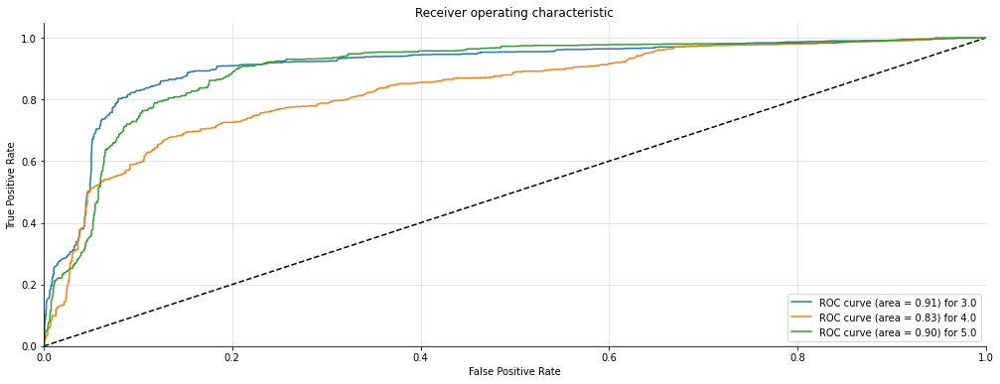

(3360, 3) (3360, 3)


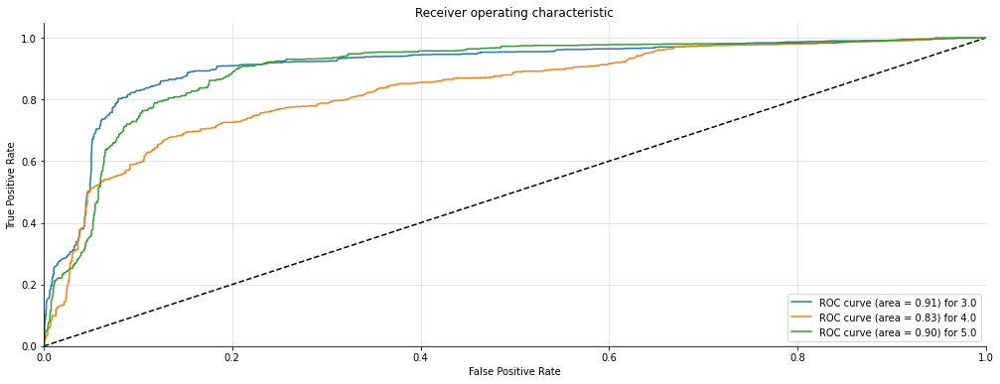

For column: not interesting<==>interesting
              precision    recall  f1-score   support

         3.0       0.87      0.78      0.82       840
         4.0       0.59      0.63      0.61       863
         5.0       0.55      0.65      0.59       838
         6.0       0.81      0.68      0.74       819

    accuracy                           0.68      3360
   macro avg       0.70      0.68      0.69      3360
weighted avg       0.70      0.68      0.69      3360

Confusion Matrix: 
 [[657 142  31  10]
 [ 58 544 215  46]
 [ 24 200 544  70]
 [ 17  43 204 555]]
Accuracy Score : 0.6845238095238095
Precision Score : 0.7028103256534944
Recall Score : 0.6845238095238095
F1 Score : 0.6902619312434237
(3360, 4) (3360, 4)


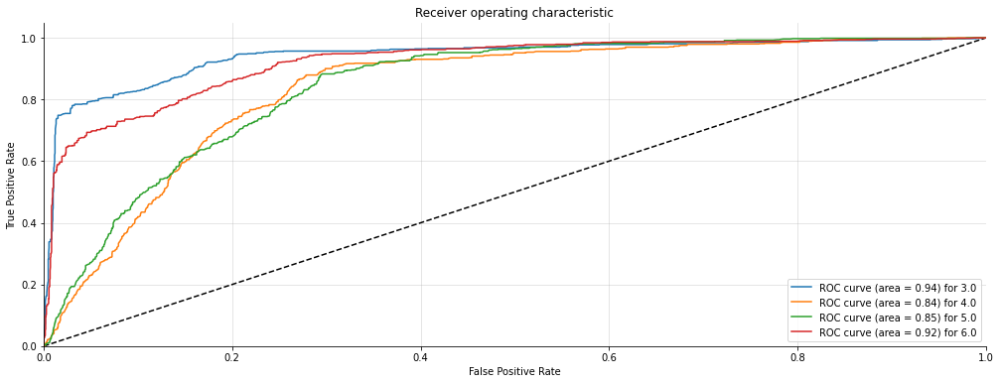

(3360, 4) (3360, 4)


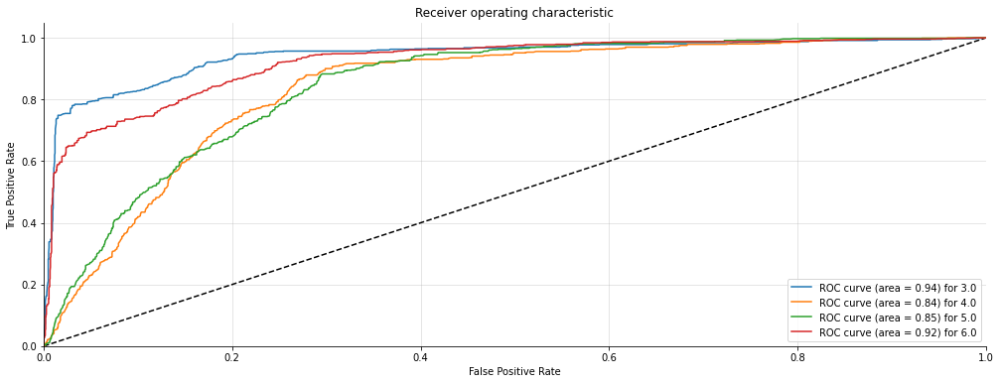

For column: conventional<==>inventive
              precision    recall  f1-score   support

         2.0       0.90      0.79      0.84       832
         3.0       0.63      0.61      0.62       881
         4.0       0.53      0.69      0.60       842
         5.0       0.78      0.67      0.72       805

    accuracy                           0.69      3360
   macro avg       0.71      0.69      0.70      3360
weighted avg       0.71      0.69      0.69      3360

Confusion Matrix: 
 [[656 116  41  19]
 [ 42 537 252  50]
 [ 15 163 578  86]
 [ 12  41 210 542]]
Accuracy Score : 0.6883928571428571
Precision Score : 0.7086449128509064
Recall Score : 0.6883928571428571
F1 Score : 0.694235806831651
(3360, 4) (3360, 4)


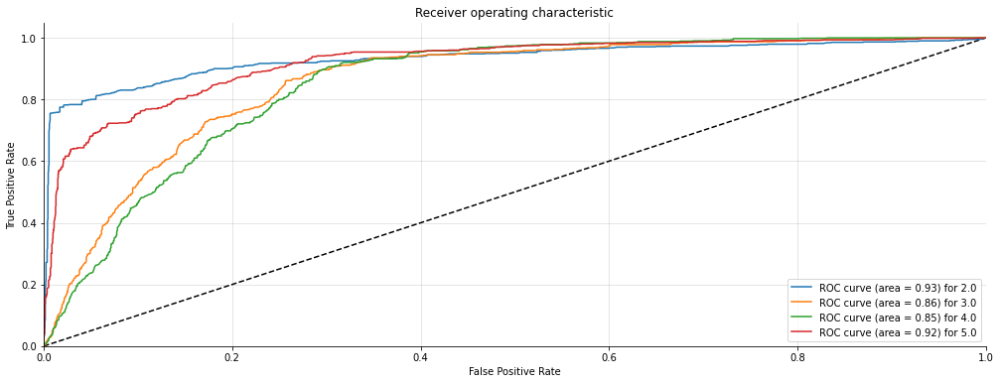

(3360, 4) (3360, 4)


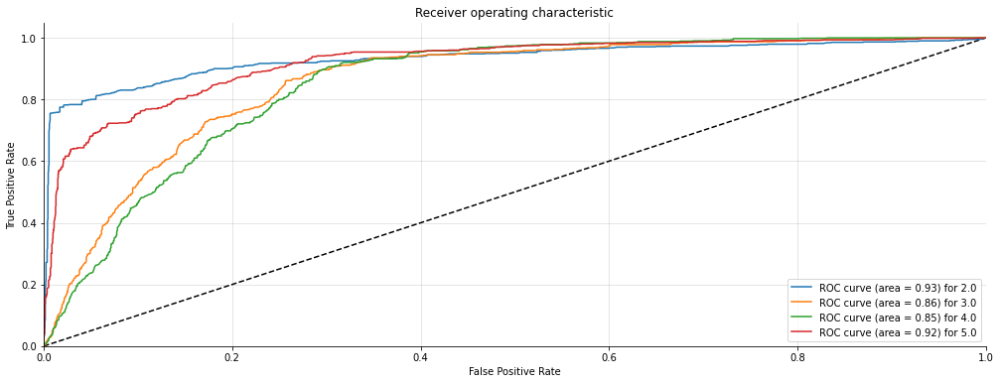

For column: usual<==>leading edge
              precision    recall  f1-score   support

         2.0       0.97      0.98      0.98       675
         3.0       0.91      0.85      0.88       677
         4.0       0.93      0.85      0.89       726
         5.0       0.76      0.91      0.83       637
         6.0       0.85      0.83      0.84       645

    accuracy                           0.88      3360
   macro avg       0.89      0.88      0.88      3360
weighted avg       0.89      0.88      0.88      3360

Confusion Matrix: 
 [[660   0   0  15   0]
 [  7 575   7  56  32]
 [  0  36 616  37  37]
 [  7   5  20 578  27]
 [  4  15  19  71 536]]
Accuracy Score : 0.8824404761904762
Precision Score : 0.8877829133377151
Recall Score : 0.8824404761904762
F1 Score : 0.8832923206306803
(3360, 5) (3360, 5)


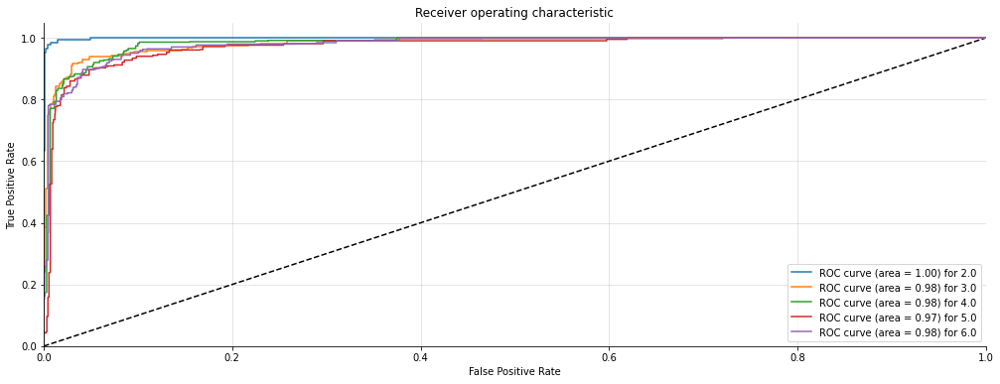

(3360, 5) (3360, 5)


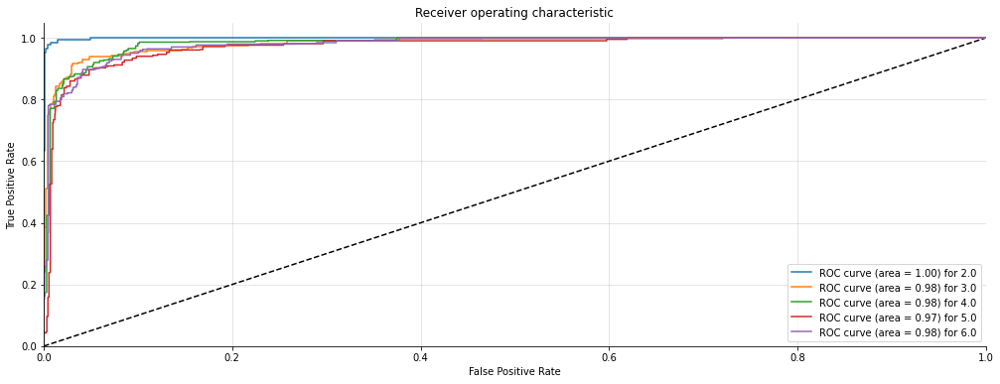

In [46]:
acc=[]
pre=[]
recal=[]
f1=[]
rms=[]
aucscore=[]
fpo=dict()
tpo=dict()
ffpo=[]
ttpo=[]
def SVMmodel(X_train, X_test, y_train, y_test, n_classes, figsize=(8, 6)):
    svc = SVC( probability=True)
    svc.fit(X_train, y_train)

    # predictions over test set
    predictions=[round(float(x)) for x in svc.predict(X_test)]
    print((classification_report(y_test, predictions)))

    # calculating Accuracy Score, Precision Score, Recall Score and F1 Score
    print('Confusion Matrix: \n' ,confusion_matrix(y_test, predictions))
    acc.append(accuracy_score(y_test, predictions))
    print(f'Accuracy Score : {accuracy_score(y_test, predictions)}')
    pre.append(precision_score(y_test,predictions,average='weighted'))
    print('Precision Score : ' + str(precision_score(y_test,predictions,average='weighted')))
    recal.append(recall_score(y_test,predictions,average='weighted'))
    print('Recall Score : ' + str(recall_score(y_test,predictions,average='weighted')))
    f1.append(f1_score(y_test,predictions,average='weighted'))
    print('F1 Score : ' + str(f1_score(y_test,predictions,average='weighted')))
    rms.append(np.sqrt(mean_squared_error(y_test,predictions)))
    aucscore.append(score_auc(y_test,predictions))
    plot_multiclass_roc(svc, X_test, y_test, n_classes)
    fpo,tpo=plot_multiclass_roc(svc, X_test, y_test, n_classes)
    ffpo.append(fpo)
    ttpo.append(tpo)

for i in range(8):
  print('For column:', df.columns[1:][i])
  n_classes = len(np.unique(df[df.columns[1:][i]]))
  SVMmodel(X_train, X_test, y_train[:,i], y_test[:,i], n_classes, figsize=(8, 6))

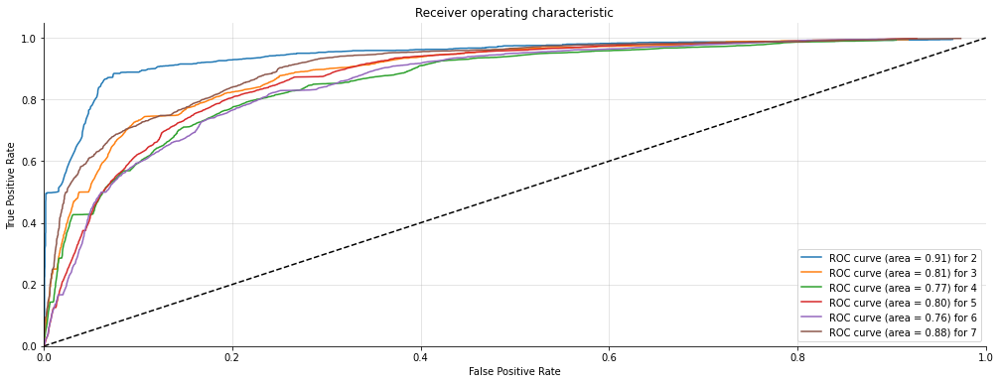

In [47]:
fsum5=list(np.array(dadd(dadd(dadd(ffpo[0][0],ffpo[1][1]),dadd(ffpo[2][1],ffpo[3][1])),dadd(dadd(ffpo[4][2],ffpo[5][2]),dadd(ffpo[6][3],ffpo[7][3]))))/8)
fsum6=list(np.array(dadd(dadd(dadd(ffpo[0][1],ffpo[1][2]),dadd(ffpo[2][2],ffpo[3][2])),dadd(dadd([0],ffpo[5][3]),dadd([0],ffpo[7][4]))))/6)
fsum7=list(np.array(dadd(dadd(dadd(ffpo[0][2],ffpo[1][3]),dadd(ffpo[2][3],ffpo[3][3])),dadd(dadd([0],[0]),dadd([0],[0]))))/4)
fsum4=list(np.array(dadd(dadd(dadd([0],ffpo[1][0]),dadd(ffpo[2][0],ffpo[3][0])),dadd(dadd(ffpo[4][1],ffpo[5][1]),dadd(ffpo[6][2],ffpo[7][2]))))/7)
fsum3=list(np.array(dadd(dadd(dadd([0],[0]),dadd([0],[0])),dadd(dadd(ffpo[4][0],ffpo[5][0]),dadd(ffpo[6][1],ffpo[7][1]))))/4)
fsum2=list(np.array(dadd(dadd(dadd([0],[0]),dadd([0],[0])),dadd(dadd([0],[0]),dadd(ffpo[6][0],ffpo[7][0]))))/2)




fpr=dict()

fsum2.sort()
fpr[0]=fsum2

fsum3.sort()
fpr[1]=fsum3

fsum4.sort()
fpr[2]=fsum4

fsum5.sort()
fpr[3]=fsum5

fsum6.sort()
fpr[4]=fsum6

fsum7.sort()
fpr[5]=fsum7











tsum5=list(np.array(dadd(dadd(dadd(ttpo[0][0],ttpo[1][1]),dadd(ttpo[2][1],ttpo[3][1])),dadd(dadd(ttpo[4][2],ttpo[5][2]),dadd(ttpo[6][3],ttpo[7][3]))))/8)
tsum6=list(np.array(dadd(dadd(dadd(ttpo[0][1],ttpo[1][2]),dadd(ttpo[2][2],ttpo[3][2])),dadd(dadd([0],ttpo[5][3]),dadd([0],ttpo[7][4]))))/6)
tsum7=list(np.array(dadd(dadd(dadd(ttpo[0][2],ttpo[1][3]),dadd(ttpo[2][3],ttpo[3][3])),dadd(dadd([0],[0]),dadd([0],[0]))))/4)
tsum4=list(np.array(dadd(dadd(dadd([0],ttpo[1][0]),dadd(ttpo[2][0],ttpo[3][0])),dadd(dadd(ttpo[4][1],ttpo[5][1]),dadd(ttpo[6][2],ttpo[7][2]))))/7)
tsum3=list(np.array(dadd(dadd(dadd([0],[0]),dadd([0],[0])),dadd(dadd(ttpo[4][0],ttpo[5][0]),dadd(ttpo[6][1],ttpo[7][1]))))/4)
tsum2=list(np.array(dadd(dadd(dadd([0],[0]),dadd([0],[0])),dadd(dadd([0],[0]),dadd(ttpo[6][0],ttpo[7][0]))))/2)


tpr=dict()

tsum2.sort()
tpr[0]=tsum2

tsum3.sort()
tpr[1]=tsum3

tsum4.sort()
tpr[2]=tsum4

tsum5.sort()
tpr[3]=tsum5

tsum6.sort()
tpr[4]=tsum6

tsum7.sort()
tpr[5]=tsum7


plot_multiclass_roc_avg(fpr,tpr,6)

In [48]:
print("average Accuracy :{}".format(np.mean(acc)))
print("average Precision :{}".format(np.mean(pre)))
print("average Recall :{}".format(np.mean(recal)))
print("average F1 -score :{}".format(np.mean(f1)))
print("average RMSE -score :{}".format(np.mean(rms)))
print("average auc score {}".format(np.mean(aucscore)))
metric_df['SVM'] = [np.mean(acc),np.mean(pre),np.mean(recal),np.mean(f1),np.mean(rms),np.mean(aucscore)]

average Accuracy :0.727827380952381
average Precision :0.7410331519349904
average Recall :0.727827380952381
average F1 -score :0.7310028155755839
average RMSE -score :0.6817264114900041
average auc score 0.8138263803285769


## 3.7. Custom-Built Ordinal Classifier

Credit: [Muhammad for Towards Data Science](https://towardsdatascience.com/simple-trick-to-train-an-ordinal-regression-with-any-classifier-6911183d2a3c)

Ordinal classifier basically does a similar thing to one-hot encoding -- but despite having one value each column, ordinal encoding maps unique binary values for each of our unique classes.

We implement a custom object called `OrdinalClassifier` built on top of any `sklearn` model that supports the `predict_proba()` function; ranging from Naive Bayes to decision trees.

Last implementation, we deduced the labels by one, from `[1,2,3,4,5,6,7]` to `[0,1,2,3,4,5,6]` due to the nature of zero-indexing of standard sklearn library. But this doesn't work if the labels aren't ranging fully from 1 to 7 -- could be 2 to 6 or 2 to 7 instead.

So the solution is to change the overall behavior of the `OrdinalClassifier` object to take maximum class (e.g. 7) and minimum class (e.g. 2 or 3) into consideration. From there, we simulate the `np.argmax()` function to be added the minimum class before being returned. We also add the minimum class as an index towards `self.clfs` dictionary when adding new value, so we don't need to deduce the labels by hand. In other words, labels stay as-is instead of being deduced by 1 :)

This also changes how the approach for ordinal encoding works -- instead of `k - 1` like the author's original implementation, we feed `k` numbers of encoding because our labels are already one-indexed.

Keep in mind that the `predict_proba()` function does not yet implement this change, because it's only a wrapper function before eventually calling `predict()` in which we care the most about the result. 

For column: obstructive<==>supportive
[17:57:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[17:57:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[17:57:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
              precision    recal

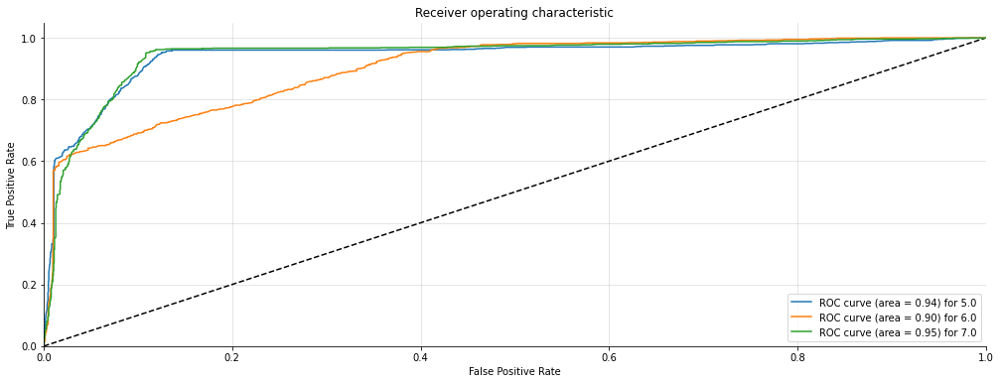

(3360, 3) (3360, 3)


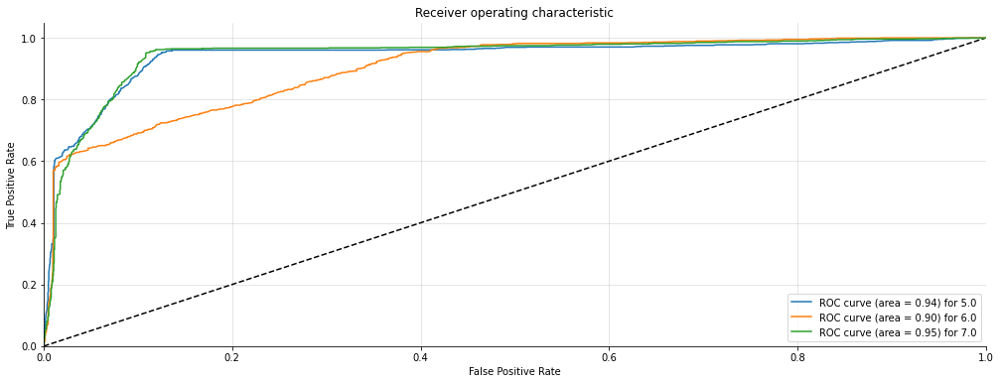

For column: complicated<==>easy
[17:57:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[17:57:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[17:57:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[17:57:45] WARNING: C:/Users/Administr

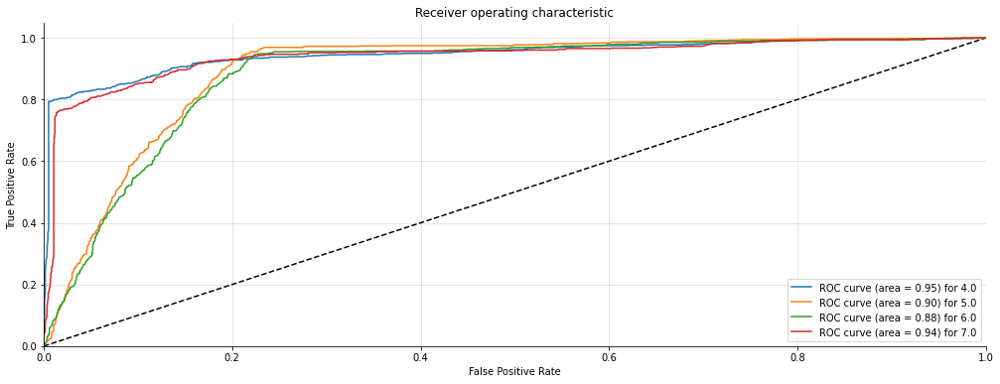

(3360, 4) (3360, 4)


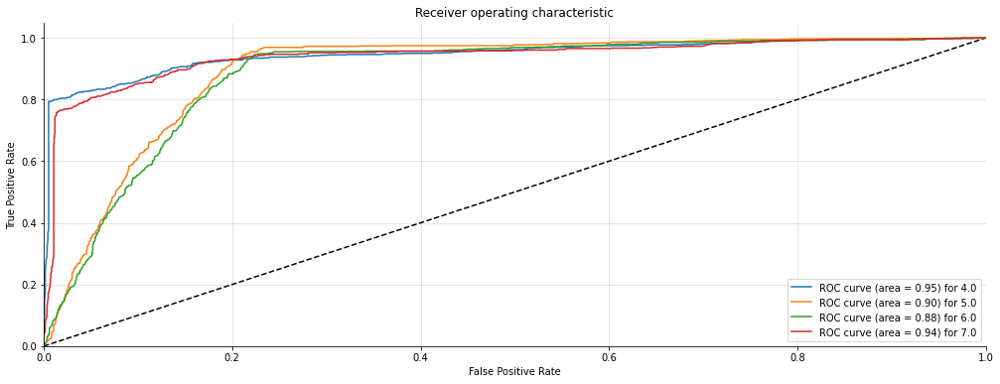

For column: inefficient<==>efficient
[17:57:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[17:57:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[17:57:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[17:57:46] WARNING: C:/Users/Admi

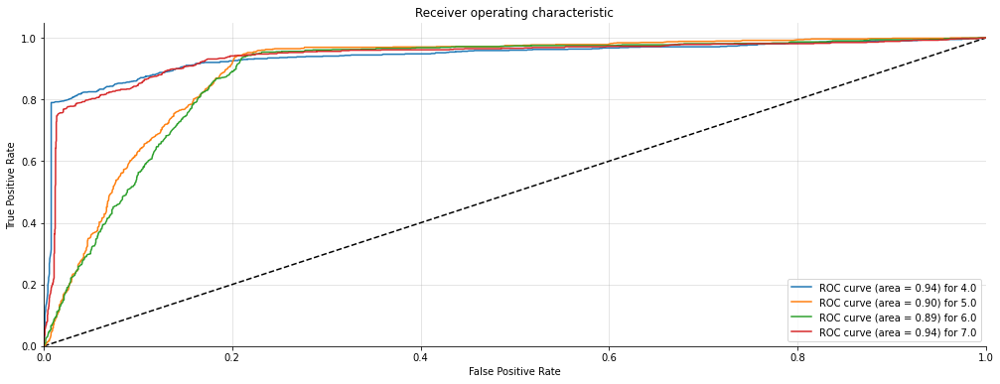

(3360, 4) (3360, 4)


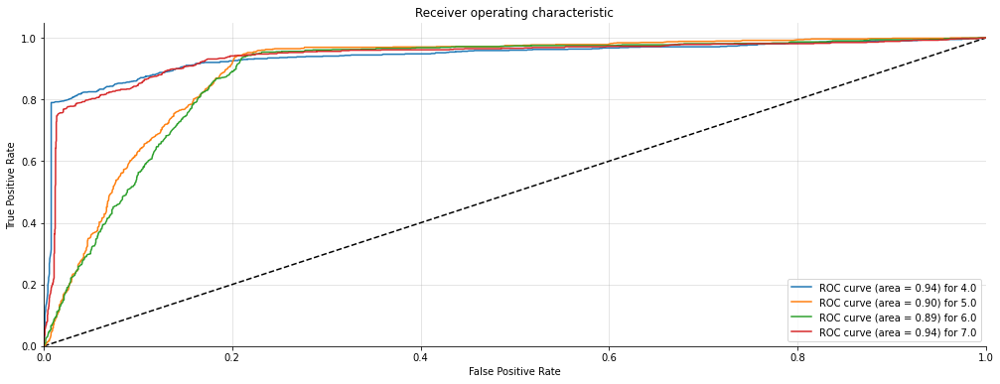

For column:  confusing<==>clear
[17:57:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[17:57:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[17:57:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[17:57:48] WARNING: C:/Users/Administr

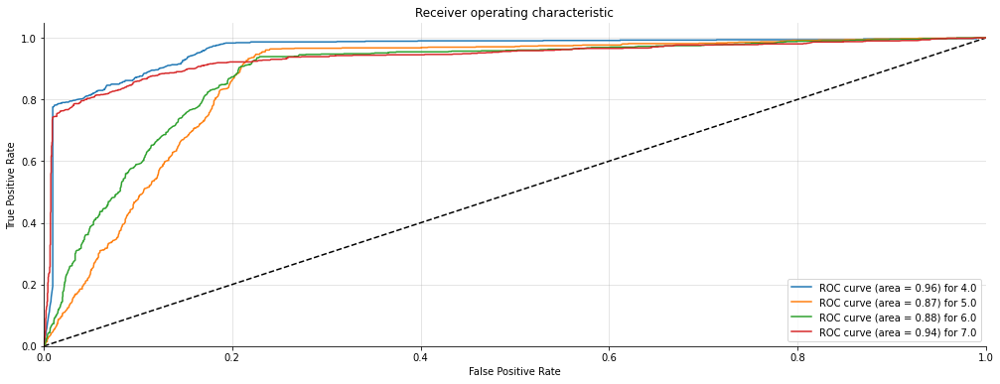

(3360, 4) (3360, 4)


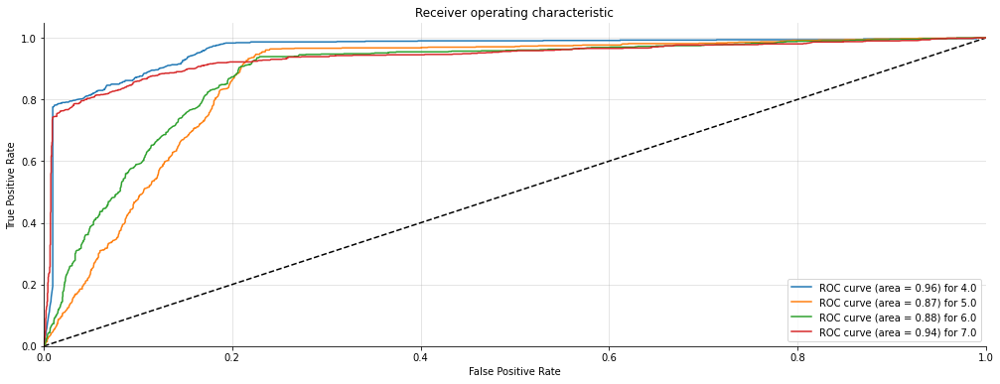

For column: boring<==>exciting
[17:57:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[17:57:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[17:57:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
              precision    recall  f1-s

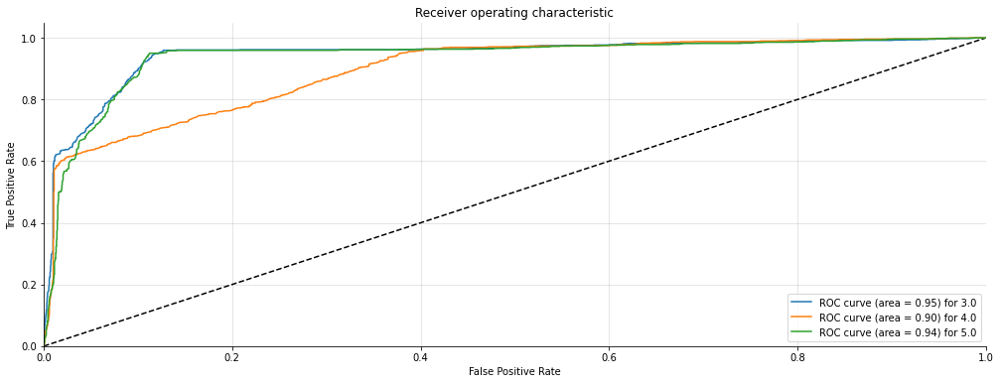

(3360, 3) (3360, 3)


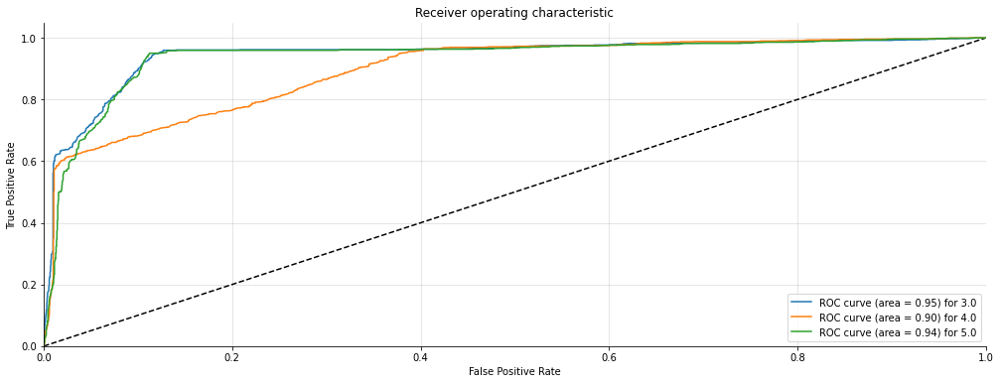

For column: not interesting<==>interesting
[17:57:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[17:57:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[17:57:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[17:57:51] WARNING: C:/User

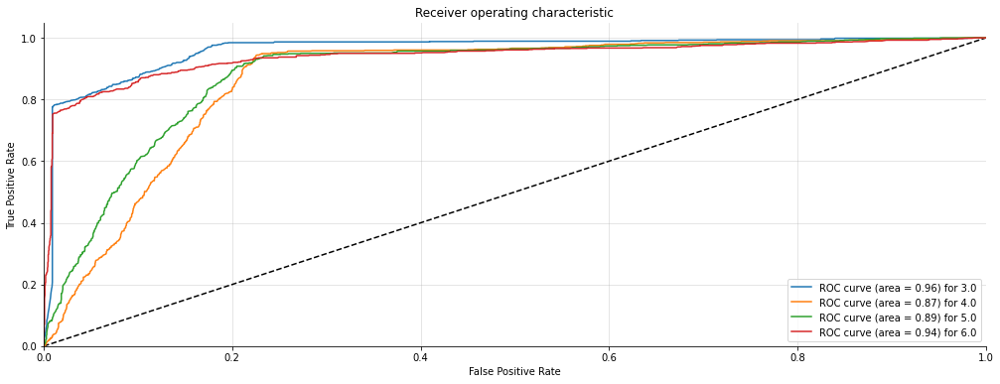

(3360, 4) (3360, 4)


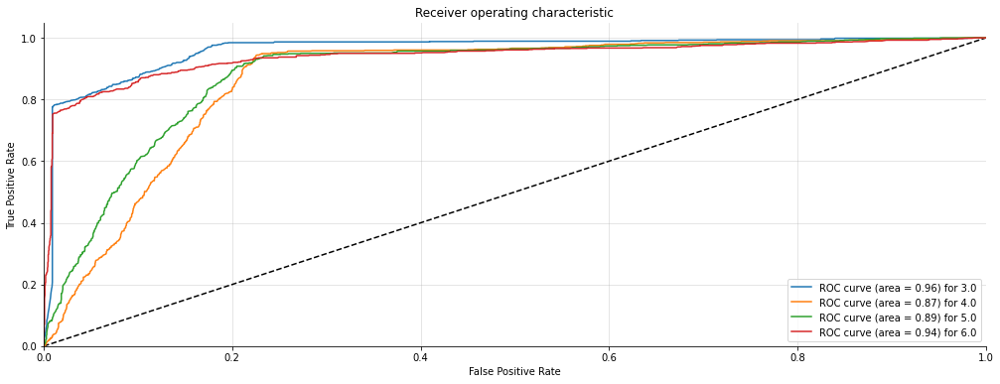

For column: conventional<==>inventive
[17:57:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[17:57:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[17:57:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[17:57:53] WARNING: C:/Users/Adm

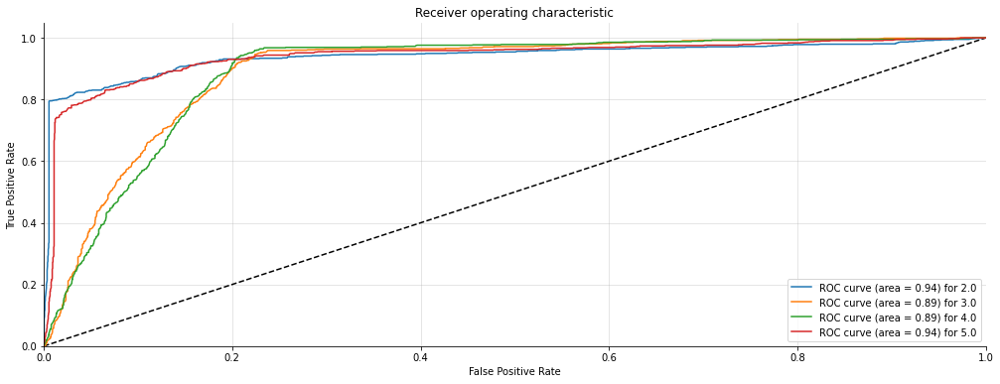

(3360, 4) (3360, 4)


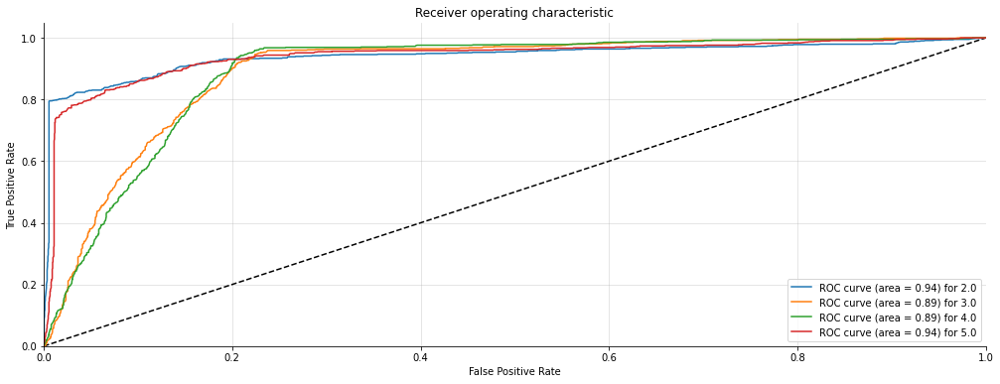

For column: usual<==>leading edge
[17:57:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[17:57:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[17:57:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[17:57:55] WARNING: C:/Users/Adminis

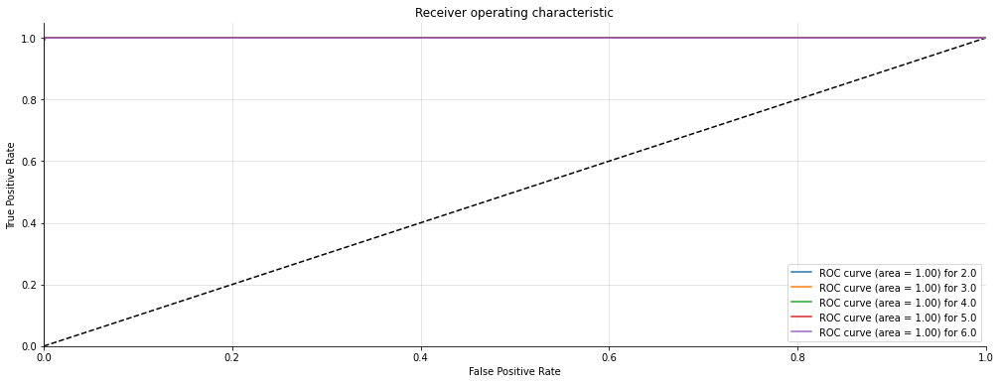

(3360, 5) (3360, 5)


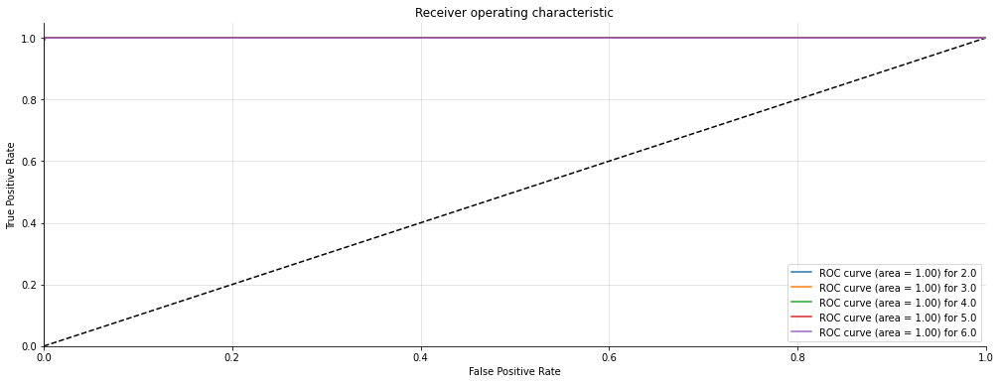

In [49]:
from sklearn.base import clone

acc=[]
pre=[]
recal=[]
f1=[]
rms=[]
aucscore=[]
fpo=dict()
tpo=dict()
ffpo=[]
ttpo=[]
class OrdinalClassifier():
    
    def __init__(self, clf):
        self.clf = clf
        self.clfs = {}
    
    def fit(self, X, y):
        self.unique_class = np.sort(np.unique(y))
        self.max_class = max(self.unique_class)
        self.min_class = min(self.unique_class)
        if self.unique_class.shape[0] > 2:
            # print(self.unique_class.shape[0]) # Uncomment to debug
            for i in range(self.unique_class.shape[0]):
                # for each k ordinal value we fit a binary classification problem
                binary_y = (y > self.unique_class[i]).astype(np.uint8)
                clf = clone(self.clf)
                
                
                clf.fit(X, binary_y)
                self.clfs[i + self.min_class] = clf
    
    def predict_proba(self, X):
        clfs_predict = {k:self.clfs[k].predict_proba(X) for k in self.clfs}
        # print(self.clfs) # Uncomment to debug
        predicted = []
        for i,y in enumerate(self.unique_class):
            if i == 0:
                # V1 = 1 - Pr(y > V1)
                predicted.append(1 - clfs_predict[y][:,1])
            elif y in clfs_predict:
                # Vi = Pr(y > Vi-1) - Pr(y > Vi)
                 predicted.append(clfs_predict[y-1][:,1] - clfs_predict[y][:,1])
            else:
                # Vk = Pr(y > Vk-1)
                predicted.append(clfs_predict[y-1][:,1])
        return np.vstack(predicted).T
    
    def predict(self, X):
        return np.argmax(self.predict_proba(X), axis=1) + self.min_class

def OrdinalModel(X_train, X_test, y_train, y_test, n_classes, figsize=(8, 6)):
    clf = OrdinalClassifier(XGBClassifier()) # Using XGB as the placeholder model 
    clf.fit(X_train, y_train)

    # predictions over test set
    predictions = clf.predict(X_test)
    print((classification_report(y_test, predictions)))

    # calculating Accuracy Score, Precision Score, Recall Score and F1 Score
    print('Confusion Matrix: \n' ,confusion_matrix(y_test, predictions))
    acc.append(accuracy_score(y_test, predictions))
    print(f'Accuracy Score : {accuracy_score(y_test, predictions)}')
    pre.append(precision_score(y_test,predictions,average='weighted'))
    print('Precision Score : ' + str(precision_score(y_test,predictions,average='weighted')))
    recal.append(recall_score(y_test,predictions,average='weighted'))
    print('Recall Score : ' + str(recall_score(y_test,predictions,average='weighted')))
    f1.append(f1_score(y_test,predictions,average='weighted'))
    rms.append(np.sqrt(mean_squared_error(y_test,predictions)))
    print('F1 Score : ' + str(f1_score(y_test,predictions,average='weighted')))
    aucscore.append(score_auc(y_test,predictions))
    fpo,tpo=plot_multiclass_roc(clf, X_test, y_test, n_classes)
    ffpo.append(fpo)
    ttpo.append(tpo)

    plot_multiclass_roc(clf, X_test, y_test, n_classes)

for i in range(8):
  print('For column:', df.columns[1:][i])
  n_classes = len(np.unique(df[df.columns[1:][i]]))
  OrdinalModel(X_train, X_test, y_train[:,i], y_test[:,i], n_classes, figsize=(8, 6))
  #break # Uncomment to debug

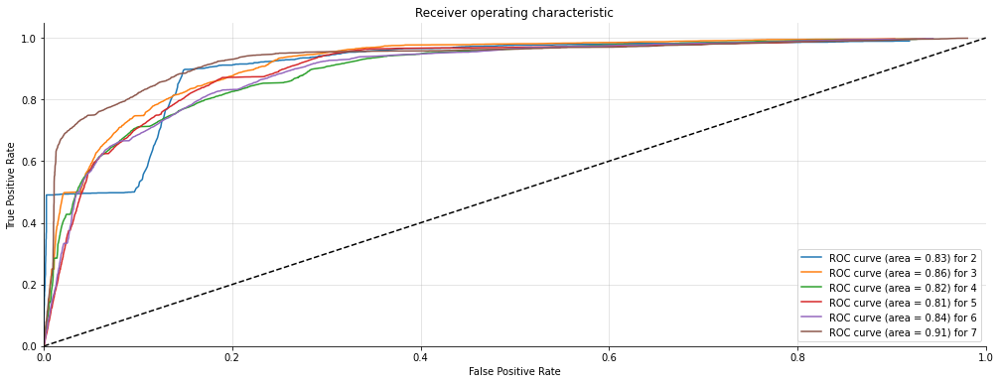

In [50]:
fsum5=list(np.array(dadd(dadd(dadd(ffpo[0][0],ffpo[1][1]),dadd(ffpo[2][1],ffpo[3][1])),dadd(dadd(ffpo[4][2],ffpo[5][2]),dadd(ffpo[6][3],ffpo[7][3]))))/8)
fsum6=list(np.array(dadd(dadd(dadd(ffpo[0][1],ffpo[1][2]),dadd(ffpo[2][2],ffpo[3][2])),dadd(dadd([0],ffpo[5][3]),dadd([0],ffpo[7][4]))))/6)
fsum7=list(np.array(dadd(dadd(dadd(ffpo[0][2],ffpo[1][3]),dadd(ffpo[2][3],ffpo[3][3])),dadd(dadd([0],[0]),dadd([0],[0]))))/4)
fsum4=list(np.array(dadd(dadd(dadd([0],ffpo[1][0]),dadd(ffpo[2][0],ffpo[3][0])),dadd(dadd(ffpo[4][1],ffpo[5][1]),dadd(ffpo[6][2],ffpo[7][2]))))/7)
fsum3=list(np.array(dadd(dadd(dadd([0],[0]),dadd([0],[0])),dadd(dadd(ffpo[4][0],ffpo[5][0]),dadd(ffpo[6][1],ffpo[7][1]))))/4)
fsum2=list(np.array(dadd(dadd(dadd([0],[0]),dadd([0],[0])),dadd(dadd([0],[0]),dadd(ffpo[6][0],ffpo[7][0]))))/2)




fpr=dict()

fsum2.sort()
fpr[0]=fsum2

fsum3.sort()
fpr[1]=fsum3

fsum4.sort()
fpr[2]=fsum4

fsum5.sort()
fpr[3]=fsum5

fsum6.sort()
fpr[4]=fsum6

fsum7.sort()
fpr[5]=fsum7











tsum5=list(np.array(dadd(dadd(dadd(ttpo[0][0],ttpo[1][1]),dadd(ttpo[2][1],ttpo[3][1])),dadd(dadd(ttpo[4][2],ttpo[5][2]),dadd(ttpo[6][3],ttpo[7][3]))))/8)
tsum6=list(np.array(dadd(dadd(dadd(ttpo[0][1],ttpo[1][2]),dadd(ttpo[2][2],ttpo[3][2])),dadd(dadd([0],ttpo[5][3]),dadd([0],ttpo[7][4]))))/6)
tsum7=list(np.array(dadd(dadd(dadd(ttpo[0][2],ttpo[1][3]),dadd(ttpo[2][3],ttpo[3][3])),dadd(dadd([0],[0]),dadd([0],[0]))))/4)
tsum4=list(np.array(dadd(dadd(dadd([0],ttpo[1][0]),dadd(ttpo[2][0],ttpo[3][0])),dadd(dadd(ttpo[4][1],ttpo[5][1]),dadd(ttpo[6][2],ttpo[7][2]))))/7)
tsum3=list(np.array(dadd(dadd(dadd([0],[0]),dadd([0],[0])),dadd(dadd(ttpo[4][0],ttpo[5][0]),dadd(ttpo[6][1],ttpo[7][1]))))/4)
tsum2=list(np.array(dadd(dadd(dadd([0],[0]),dadd([0],[0])),dadd(dadd([0],[0]),dadd(ttpo[6][0],ttpo[7][0]))))/2)


tpr=dict()

tsum2.sort()
tpr[0]=tsum2

tsum3.sort()
tpr[1]=tsum3

tsum4.sort()
tpr[2]=tsum4

tsum5.sort()
tpr[3]=tsum5

tsum6.sort()
tpr[4]=tsum6

tsum7.sort()
tpr[5]=tsum7


plot_multiclass_roc_avg(fpr,tpr,6)

In [51]:
print("average Accuracy :{}".format(np.mean(acc)))
print("average Precision :{}".format(np.mean(pre)))
print("average Recall :{}".format(np.mean(recal)))
print("average F1 -score :{}".format(np.mean(f1)))
print("average RMSE -score :{}".format(np.mean(rms)))
print("average AUC score:{}".format(np.mean(aucscore)))
metric_df['OrdinalModel'] = [np.mean(acc),np.mean(pre),np.mean(recal),np.mean(f1),np.mean(rms),np.mean(aucscore)]

average Accuracy :0.7997023809523809
average Precision :0.8124865568651667
average Recall :0.7997023809523809
average F1 -score :0.8024502939725536
average RMSE -score :0.48704461950990674
average AUC score:0.8622045532691518


# 4. Other Deep Learning Model(s)

## 4.1. Bidirectional LSTM

In [52]:
## Callbacks
es = tf.keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=7)

checkpoint = tf.keras.callbacks.ModelCheckpoint(
  "model_checkpoints", monitor="val_loss", verbose=1, save_best_only=True, mode="min")

## Optimizer
opt = tf.keras.optimizers.Adam(learning_rate=0.001)

LSTM_model = tf.keras.Sequential([
    tf.keras.layers.Embedding(2000, 64),
    tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(64)),
    # tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(32)),
    # use ReLU in place of tanh function since they are very good alternatives of each other.
    tf.keras.layers.Dense(64, activation='relu', 
                          
                          # Prevent overfitting
                          kernel_regularizer=tf.keras.regularizers.L2(l2=0.01), 

                          # Ensuring consistent outputs and not run into potential local optima
                          # Avoid initializing standard normal (mean = 0, std = 1) to reach faster convergence and less initial loss.
                          kernel_initializer=tf.keras.initializers.RandomNormal(seed=42)
                          
                          ),
    tf.keras.layers.Dropout(0.3),
    tf.keras.layers.Dense(8, activation='linear')
])
LSTM_model.summary()

LSTM_model.compile(loss=tf.keras.losses.MeanSquaredError(), optimizer= opt, metrics=['mae'])

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding (Embedding)        (None, None, 64)          128000    
_________________________________________________________________
bidirectional (Bidirectional (None, 128)               66048     
_________________________________________________________________
dense_8 (Dense)              (None, 64)                8256      
_________________________________________________________________
dropout_5 (Dropout)          (None, 64)                0         
_________________________________________________________________
dense_9 (Dense)              (None, 8)                 520       
Total params: 202,824
Trainable params: 202,824
Non-trainable params: 0
_________________________________________________________________


In [53]:
history = LSTM_model.fit(X_train, y_train, epochs=100, batch_size = 512, validation_split=0.2, 
                    callbacks = [es], # Call checkpoint variable if neccessary
                    verbose=1)

Epoch 1/100
21/21 [==============================] - 5s 161ms/step - loss: 20.3151 - mae: 4.1648 - val_loss: 3.6261 - val_mae: 1.5217
Epoch 2/100
21/21 [==============================] - 3s 138ms/step - loss: 3.3185 - mae: 1.4300 - val_loss: 1.6827 - val_mae: 1.0479
Epoch 3/100
21/21 [==============================] - 3s 137ms/step - loss: 2.4952 - mae: 1.2447 - val_loss: 1.4135 - val_mae: 0.9687
Epoch 4/100
21/21 [==============================] - 3s 134ms/step - loss: 2.3123 - mae: 1.2038 - val_loss: 1.3420 - val_mae: 0.9527
Epoch 5/100
21/21 [==============================] - 3s 135ms/step - loss: 2.1883 - mae: 1.1727 - val_loss: 1.3139 - val_mae: 0.9443
Epoch 6/100
21/21 [==============================] - 3s 132ms/step - loss: 2.1468 - mae: 1.1651 - val_loss: 1.3068 - val_mae: 0.9422
Epoch 7/100
21/21 [==============================] - 3s 133ms/step - loss: 2.0701 - mae: 1.1459 - val_loss: 1.2912 - val_mae: 0.9339
Epoch 8/100
21/21 [==============================] - 3s 130ms/step -

### 4.1.1. Interpretation

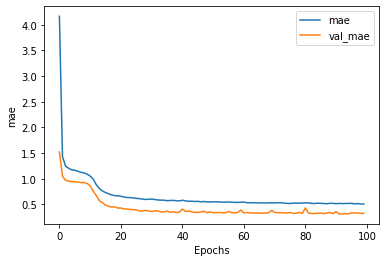

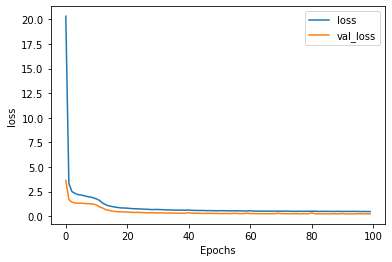

In [54]:
plot_graphs(history, "mae")
plot_graphs(history, "loss")

In [55]:
scores = LSTM_model.evaluate(
    X_test, y_test, batch_size=1, verbose=1, sample_weight=None, steps=None,
    callbacks=None, max_queue_size=10, workers=4, use_multiprocessing=False,
    return_dict=False
)
print("------------------ EVALUATION FINISHED! ------------------".center(115))
for i in range(len(scores)):
    print("%s: %.2f%%" % (model.metrics_names[i], scores[i]*100))

3360/3360 [==============================] - 7s 2ms/step - loss: 0.2324 - mae: 0.3249
                             ------------------ EVALUATION FINISHED! ------------------                            
loss: 23.24%
mae: 32.49%


In [56]:
from sklearn.metrics import confusion_matrix,f1_score, precision_score, recall_score, classification_report
from sklearn.metrics import plot_confusion_matrix, accuracy_score
from sklearn.metrics import mean_squared_error
acc=[]
pre=[]
recal=[]
f1=[]
rms=[]
aucscore=[]

In [57]:
from sklearn.metrics import classification_report, f1_score
y_pred = LSTM_model.predict(X_test)
for i in range(8):
    print("Column", df.columns[1:][i])
    estimates = [round(float(x)) for x in y_pred[:,i]]
    estimates = transform_results(estimates)
    print(np.unique(estimates))
    acc.append(accuracy_score(y_test[:,i], estimates))
    pre.append(precision_score(y_test[:,i], estimates,average='weighted'))
    recal.append(recall_score(y_test[:,i], estimates,average='weighted'))
    f1.append(f1_score(y_test[:,i], estimates,average='weighted'))
    rms.append(np.sqrt(mean_squared_error(y_test[:,i], estimates)))
    aucscore.append(score_auc(y_test[:,i], estimates))
    print(classification_report(y_test[:,i], estimates), "\n------")

Column obstructive<==>supportive
[5 6 7]
              precision    recall  f1-score   support

         5.0       0.80      0.90      0.85      1112
         6.0       0.72      0.71      0.72      1171
         7.0       0.85      0.76      0.80      1077

    accuracy                           0.79      3360
   macro avg       0.79      0.79      0.79      3360
weighted avg       0.79      0.79      0.79      3360
 
------
Column complicated<==>easy
[4 5 6 7]
              precision    recall  f1-score   support

         4.0       0.95      0.80      0.87       834
         5.0       0.65      0.78      0.71       875
         6.0       0.62      0.72      0.67       842
         7.0       0.94      0.73      0.82       809

    accuracy                           0.76      3360
   macro avg       0.79      0.76      0.77      3360
weighted avg       0.79      0.76      0.76      3360
 
------
Column inefficient<==>efficient
[4 5 6 7]
              precision    recall  f1-score   su

In [58]:
print("average Accuracy :{}".format(np.mean(acc)))
print("average Precision :{}".format(np.mean(pre)))
print("average Recall :{}".format(np.mean(recal)))
print("average F1 -score :{}".format(np.mean(f1)))
print("average RMSE -score :{}".format(np.mean(rms)))
print("average AUC -score :{}".format(np.mean(aucscore)))
metric_df['Bidirectional LSTM'] = [np.mean(acc),np.mean(pre),np.mean(recal),np.mean(f1),np.mean(rms),np.mean(aucscore)]

average Accuracy :0.7853050595238096
average Precision :0.8059692970591577
average Recall :0.7853050595238096
average F1 -score :0.789903665310375
average RMSE -score :0.5118584815510767
average AUC -score :0.8515500394718392


In [59]:
metric_df

,metric,Neural network classifier,XGB,SVM,OrdinalModel,Bidirectional LSTM
0,Accuracy,0.740774,0.799740,0.727827,0.799702,0.785305
1,Precision,0.780941,0.812366,0.741033,0.812487,0.805969
2,Recall,0.740774,0.799740,0.727827,0.799702,0.785305
3,F1 Score,0.745291,0.802416,0.731003,0.802450,0.789904
4,RMSE,0.571515,0.490967,0.681726,0.487045,0.511858
5,AUC score,0.822676,0.862210,0.813826,0.862205,0.851550


# Result

In [60]:
LSTM_y_pred = LSTM_model.predict(X_test)
LSTM_y_pred_flattened = LSTM_y_pred.flatten(order='F')
LSTM_y_classified = [round(float(x)) for x in LSTM_y_pred_flattened]

print("First ten examples of the test set:")
print("Truth labels:", y_test_flattened[:10])
print("Predicted labels:",LSTM_y_classified[:10])
print("Overall performance on all columns:\n", classification_report(y_test_flattened, LSTM_y_classified))

First ten examples of the test set:
Truth labels: [5. 5. 5. 5. 6. 6. 6. 6. 6. 5.]
Predicted labels: [5, 5, 5, 5, 6, 6, 6, 6, 6, 6]
Overall performance on all columns:
               precision    recall  f1-score   support

         2.0       0.97      0.89      0.93      1507
         3.0       0.84      0.81      0.83      3519
         4.0       0.77      0.81      0.79      6107
         5.0       0.73      0.79      0.76      7077
         6.0       0.72      0.74      0.73      5162
         7.0       0.91      0.74      0.81      3508

    accuracy                           0.79     26880
   macro avg       0.83      0.80      0.81     26880
weighted avg       0.79      0.79      0.79     26880



## 4.2. BERT [deprecated]

In [61]:
"""!pip install -q -U tensorflow-text
!pip install -q tf-models-official
import tensorflow_hub as hub
import tensorflow_text as text
from official.nlp import optimization  # to create AdamW optimizer

to_handle = 'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-2_H-128_A-2/1'
to_preprocess = 'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3'
bert_model = hub.KerasLayer(to_preprocess)

text_test = ['this is such an amazing movie!']
text_preprocessed = bert_model(text_test)

def build_classifier_model():
  text_input = tf.keras.layers.Input(shape=(), dtype=tf.string, name='text')
  preprocessing_layer = hub.KerasLayer(to_preprocess, name='preprocessing')
  encoder_inputs = preprocessing_layer(text_input)
  encoder = hub.KerasLayer(to_handle, trainable=True, name='BERT_encoder')
  outputs = encoder(encoder_inputs)
  net = outputs['pooled_output']
  net = tf.keras.layers.Dropout(0.1)(net)
  net = tf.keras.layers.Dense(1, activation=None, name='classifier')(net)
  return tf.keras.Model(text_input, net)

classifier_model = build_classifier_model()
classifier_model.compile(optimizer=optimizer,
                         loss=loss,
                         metrics=metrics)
print(f'Training model with {to_handle}')
history = classifier_model.fit(X_train, y_train)"""

"!pip install -q -U tensorflow-text\n!pip install -q tf-models-official\nimport tensorflow_hub as hub\nimport tensorflow_text as text\nfrom official.nlp import optimization  # to create AdamW optimizer\n\nto_handle = 'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-2_H-128_A-2/1'\nto_preprocess = 'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3'\nbert_model = hub.KerasLayer(to_preprocess)\n\ntext_test = ['this is such an amazing movie!']\ntext_preprocessed = bert_model(text_test)\n\ndef build_classifier_model():\n  text_input = tf.keras.layers.Input(shape=(), dtype=tf.string, name='text')\n  preprocessing_layer = hub.KerasLayer(to_preprocess, name='preprocessing')\n  encoder_inputs = preprocessing_layer(text_input)\n  encoder = hub.KerasLayer(to_handle, trainable=True, name='BERT_encoder')\n  outputs = encoder(encoder_inputs)\n  net = outputs['pooled_output']\n  net = tf.keras.layers.Dropout(0.1)(net)\n  net = tf.keras.layers.Dense(1, activation=None, name='classifi

# 4.3 RBFN

In [62]:

from keras import backend as K
from tensorflow.keras.layers import Layer, InputSpec
from keras.initializers import RandomUniform, Initializer, Constant
import numpy as np

In [63]:
class InitCentersRandom(Initializer):
    """ Initializer for initialization of centers of RBF network
        as random samples from the given data set.
    # Arguments
        X: matrix, dataset to choose the centers from (random rows
          are taken as centers)
    """

    def __init__(self, X):
        self.X = X

    def __call__(self, shape, dtype=None):
        assert shape[1] == self.X.shape[1]
        print("done")
        idx = np.random.randint(self.X.shape[0], size=shape[0])
        return self.X[idx, :]


class RBFLayer(Layer):
    """ Layer of Gaussian RBF units.
    # Example
    ```python
        model = Sequential()
        model.add(RBFLayer(10,
                           initializer=InitCentersRandom(X),
                           betas=1.0,
                           input_shape=(1,)))
        model.add(Dense(1))
    ```
    # Arguments
        output_dim: number of hidden units (i.e. number of outputs of the
                    layer)
        initializer: instance of initiliazer to initialize centers
        betas: float, initial value for betas
    """

    def __init__(self, output_dim, initializer=None, betas=1.0, **kwargs):
        self.output_dim = output_dim
        self.init_betas = betas
        if not initializer:
            self.initializer = RandomUniform(0.0, 1.0)
        else:
            self.initializer = initializer
        super(RBFLayer, self).__init__(**kwargs)

    def build(self, input_shape):

        self.centers = self.add_weight(name='centers',
                                       shape=(self.output_dim, input_shape[1]),
                                       initializer=self.initializer,
                                       trainable=True)
        self.betas = self.add_weight(name='betas',
                                     shape=(self.output_dim,),
                                     initializer=Constant(
                                         value=self.init_betas),
                                     # initializer='ones',
                                     trainable=True)

        super(RBFLayer, self).build(input_shape)

    def call(self, x):

        C = K.expand_dims(self.centers)
        H = K.transpose(C-K.transpose(x))
        return K.exp(-self.betas * K.sum(H**2, axis=1))

        # C = self.centers[np.newaxis, :, :]
        # X = x[:, np.newaxis, :]

        # diffnorm = K.sum((C-X)**2, axis=-1)
        # ret = K.exp( - self.betas * diffnorm)
        # return ret

    def compute_output_shape(self, input_shape):
        return (input_shape[0], self.output_dim)

    def get_config(self):
        # have to define get_config to be able to use model_from_json
        config = {
            'output_dim': self.output_dim
        }
        base_config = super(RBFLayer, self).get_config()
        return dict(list(base_config.items()) + list(config.items()))

from keras.initializers import Initializer
from sklearn.cluster import KMeans


class InitCentersKMeans(Initializer):
    """ Initializer for initialization of centers of RBF network
        by clustering the given data set.
    # Arguments
        X: matrix, dataset
    """

    def __init__(self, X, max_iter=100):
        self.X = X
        self.max_iter = max_iter

    def __call__(self, shape, dtype=None):
        assert shape[1] == self.X.shape[1]

        n_centers = shape[0]
        km = KMeans(n_clusters=n_centers, max_iter=self.max_iter, verbose=0)
        km.fit(self.X)
        return km.cluster_centers_


In [64]:
import numpy as np, pandas as pd
from keras.models import Sequential 
from keras.layers.core import Dense
from keras.layers import Activation
from tensorflow.keras.optimizers import RMSprop
import matplotlib.pyplot as plt

In [65]:
model = Sequential()
rbflayer = RBFLayer(100,
                        initializer=InitCentersKMeans(X_train),
                        betas=3.0,
                        input_shape=(X_train.shape[1],))
model.add(rbflayer)
model.add(Dense(8))
model.add(Activation('linear'))
model.compile(loss='mean_squared_error',
                  optimizer='adam', metrics=['accuracy'])
model.build(X_train.shape)
print(model.summary())
history1 = model.fit(X_train, y_train, epochs=100)

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
module_wrapper (ModuleWrappe (13440, 100)              4100      
_________________________________________________________________
dense (Dense)                (13440, 8)                808       
_________________________________________________________________
activation (Activation)      (13440, 8)                0         
Total params: 4,908
Trainable params: 4,908
Non-trainable params: 0
_________________________________________________________________
None
Epoch 1/100
420/420 [==============================] - 12s 1ms/step - loss: 24.1170 - accuracy: 0.1497
Epoch 2/100
420/420 [==============================] - 0s 993us/step - loss: 20.5516 - accuracy: 0.9411
Epoch 3/100
420/420 [==============================] - 0s 990us/step - loss: 17.2131 - accuracy: 0.9459
Epoch 4/100
420/420 [==============================] - 0s 983us/step

In [66]:
scores = model.evaluate(
    X_test, y_test, batch_size=1, verbose=1, sample_weight=None, steps=None,
    callbacks=None, max_queue_size=10, workers=4, use_multiprocessing=False,
    return_dict=False
)
print("------------------ EVALUATION FINISHED! ------------------".center(115))
for i in range(len(scores)):
    print("%s: %.2f%%" % (model.metrics_names[i], scores[i]*100))

3360/3360 [==============================] - 2s 493us/step - loss: 1.1454 - accuracy: 0.9646
                             ------------------ EVALUATION FINISHED! ------------------                            
loss: 114.54%
accuracy: 96.46%


In [67]:
from sklearn.metrics import confusion_matrix,f1_score, precision_score, recall_score, classification_report
from sklearn.metrics import plot_confusion_matrix, accuracy_score
from sklearn.metrics import mean_squared_error
acc=[]
pre=[]
recal=[]
f1=[]
rms=[]
aucscore=[]

In [68]:
from sklearn.metrics import classification_report, f1_score
y_pred = model.predict(X_test)
for i in range(8):
    print("Column", df.columns[1:][i])
    estimates = [round(float(x)) for x in y_pred[:,i]]
    estimates = transform_results(estimates)
    print(np.unique(estimates))
    acc.append(accuracy_score(y_test[:,i], estimates))
    pre.append(precision_score(y_test[:,i], estimates,average='weighted'))
    recal.append(recall_score(y_test[:,i], estimates,average='weighted'))
    f1.append(f1_score(y_test[:,i], estimates,average='weighted'))
    rms.append(np.sqrt(mean_squared_error(y_test[:,i], estimates)))
    aucscore.append(score_auc(y_test[:,i], estimates))
    print(classification_report(y_test[:,i], estimates), "\n------")

Column obstructive<==>supportive
[5 6 7]
              precision    recall  f1-score   support

         5.0       0.95      0.03      0.06      1112
         6.0       0.35      1.00      0.52      1171
         7.0       1.00      0.02      0.04      1077

    accuracy                           0.37      3360
   macro avg       0.77      0.35      0.21      3360
weighted avg       0.76      0.37      0.22      3360
 
------
Column complicated<==>easy
[4 5 6 7]
              precision    recall  f1-score   support

         4.0       1.00      0.04      0.08       834
         5.0       0.33      0.00      0.00       875
         6.0       0.25      1.00      0.40       842
         7.0       1.00      0.01      0.03       809

    accuracy                           0.26      3360
   macro avg       0.65      0.26      0.13      3360
weighted avg       0.64      0.26      0.13      3360
 
------
Column inefficient<==>efficient
[4 5 6 7]
              precision    recall  f1-score   su

In [69]:
print("average Accuracy :{}".format(np.mean(acc)))
print("average Precision :{}".format(np.mean(pre)))
print("average Recall :{}".format(np.mean(recal)))
print("average F1 -score :{}".format(np.mean(f1)))
print("average RMSE -score :{}".format(np.mean(rms)))
print("average AUC -score :{}".format(np.mean(aucscore)))
metric_df['RBFN'] = [np.mean(acc),np.mean(pre),np.mean(recal),np.mean(f1),np.mean(rms),np.mean(aucscore)]

average Accuracy :0.2856770833333333
average Precision :0.7038482959533638
average Recall :0.2856770833333333
average F1 -score :0.14813002632419434
average RMSE -score :1.1243802406621821
average AUC -score :0.5103041458339282


In [70]:
LSTM_y_pred = model.predict(X_test)
LSTM_y_pred_flattened = LSTM_y_pred.flatten(order='F')
LSTM_y_classified = [round(float(x)) for x in LSTM_y_pred_flattened]

print("First ten examples of the test set:")
print("Truth labels:", y_test[:10])
print("Predicted labels:",LSTM_y_classified[:10])
print("Overall performance on all columns:\n", classification_report(y_test.flatten(order='F'), LSTM_y_classified))

First ten examples of the test set:
Truth labels: [[5. 5. 5. 4. 3. 3. 3. 3.]
 [5. 4. 4. 4. 3. 3. 2. 2.]
 [5. 4. 4. 4. 3. 3. 2. 2.]
 [5. 4. 4. 4. 3. 3. 2. 2.]
 [6. 6. 6. 6. 4. 5. 4. 4.]
 [6. 5. 5. 5. 4. 4. 3. 4.]
 [6. 5. 5. 5. 4. 4. 3. 4.]
 [6. 5. 5. 5. 4. 4. 3. 3.]
 [6. 5. 5. 5. 4. 4. 3. 4.]
 [5. 6. 7. 5. 5. 5. 2. 4.]]
Predicted labels: [6, 6, 6, 6, 6, 6, 6, 6, 6, 6]
Overall performance on all columns:
               precision    recall  f1-score   support

         2.0       1.00      0.05      0.09      1507
         3.0       0.95      0.02      0.04      3519
         4.0       0.28      0.47      0.35      6107
         5.0       0.27      0.13      0.18      7077
         6.0       0.28      0.72      0.40      5162
         7.0       1.00      0.02      0.03      3508

    accuracy                           0.29     26880
   macro avg       0.63      0.23      0.18     26880
weighted avg       0.50      0.29      0.22     26880



In [71]:
from sklearn.metrics import classification_report

In [72]:
X_test.shape

(3360, 40)

In [73]:
y_train.shape

(13440, 8)

In [74]:
metric_df

,metric,Neural network classifier,XGB,SVM,OrdinalModel,Bidirectional LSTM,RBFN
0,Accuracy,0.740774,0.799740,0.727827,0.799702,0.785305,0.285677
1,Precision,0.780941,0.812366,0.741033,0.812487,0.805969,0.703848
2,Recall,0.740774,0.799740,0.727827,0.799702,0.785305,0.285677
3,F1 Score,0.745291,0.802416,0.731003,0.802450,0.789904,0.148130
4,RMSE,0.571515,0.490967,0.681726,0.487045,0.511858,1.124380
5,AUC score,0.822676,0.862210,0.813826,0.862205,0.851550,0.510304


# 4.4 Multiclass Logistic regression

For column: obstructive<==>supportive
              precision    recall  f1-score   support

         5.0       0.41      0.46      0.43      1112
         6.0       0.42      0.37      0.39      1171
         7.0       0.37      0.37      0.37      1077

    accuracy                           0.40      3360
   macro avg       0.40      0.40      0.40      3360
weighted avg       0.40      0.40      0.40      3360

Confusion Matrix: 
 [[516 285 311]
 [372 433 366]
 [373 305 399]]
Accuracy Score : 0.4011904761904762
Precision Score : 0.4017986208012512
Recall Score : 0.4011904761904762
F1 Score : 0.40029600584341085
(3360, 3) (3360, 3)


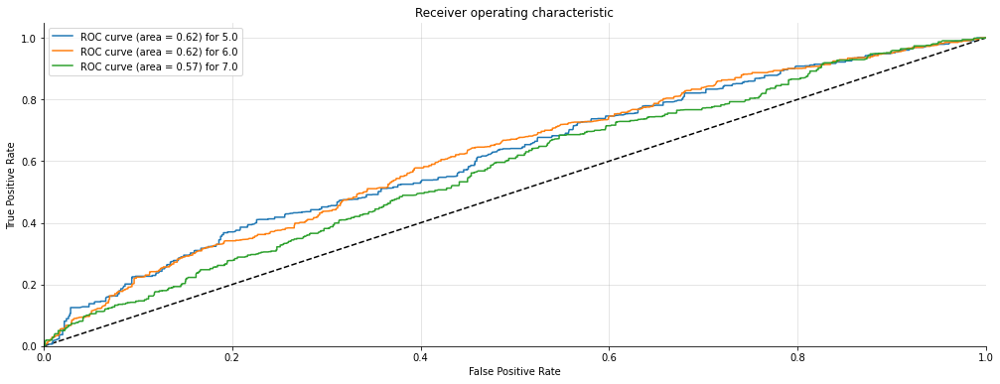

(3360, 3) (3360, 3)


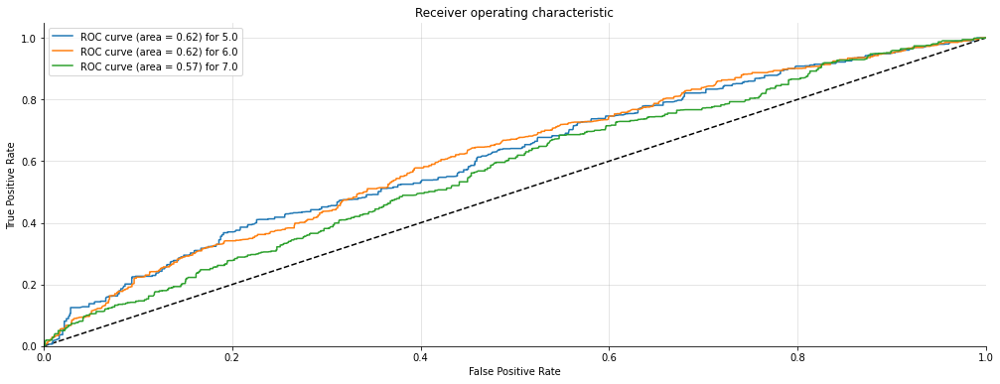

For column: complicated<==>easy
              precision    recall  f1-score   support

         4.0       0.34      0.47      0.40       834
         5.0       0.32      0.28      0.30       875
         6.0       0.29      0.24      0.26       842
         7.0       0.24      0.23      0.24       809

    accuracy                           0.31      3360
   macro avg       0.30      0.31      0.30      3360
weighted avg       0.30      0.31      0.30      3360

Confusion Matrix: 
 [[391 123 138 182]
 [242 249 170 214]
 [257 207 201 177]
 [245 192 187 185]]
Accuracy Score : 0.3053571428571429
Precision Score : 0.30074585127375475
Recall Score : 0.3053571428571429
F1 Score : 0.29972095338372595
(3360, 4) (3360, 4)


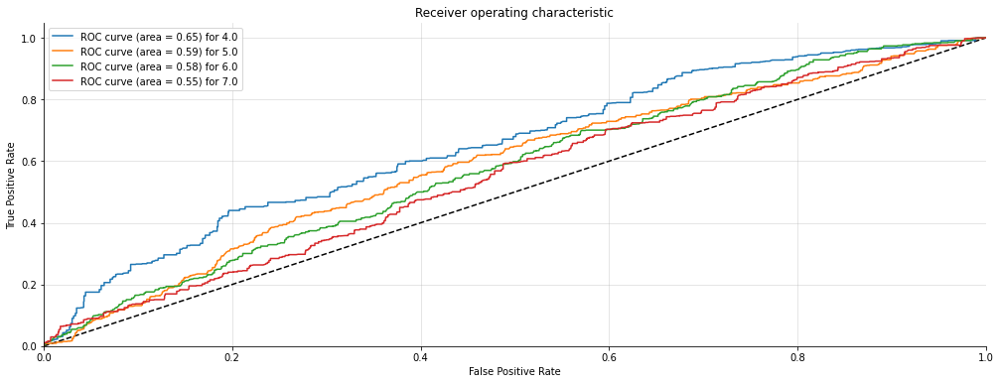

(3360, 4) (3360, 4)


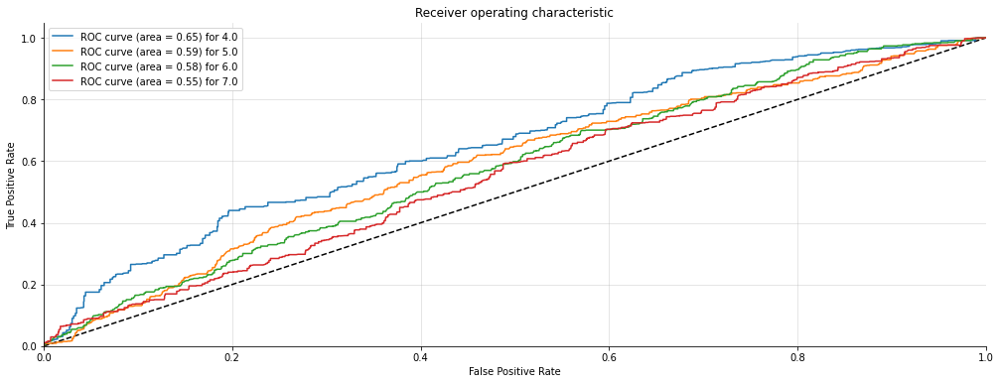

For column: inefficient<==>efficient
              precision    recall  f1-score   support

         4.0       0.36      0.49      0.41       829
         5.0       0.34      0.29      0.31       882
         6.0       0.28      0.22      0.25       847
         7.0       0.25      0.24      0.24       802

    accuracy                           0.31      3360
   macro avg       0.30      0.31      0.30      3360
weighted avg       0.30      0.31      0.30      3360

Confusion Matrix: 
 [[410 116 137 166]
 [243 256 172 211]
 [260 205 188 194]
 [241 185 186 190]]
Accuracy Score : 0.3107142857142857
Precision Score : 0.3048290399999484
Recall Score : 0.3107142857142857
F1 Score : 0.3037576199610284
(3360, 4) (3360, 4)


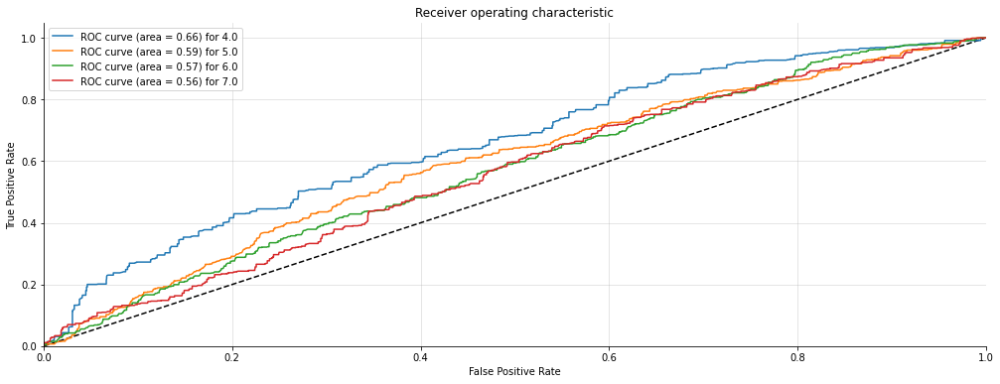

(3360, 4) (3360, 4)


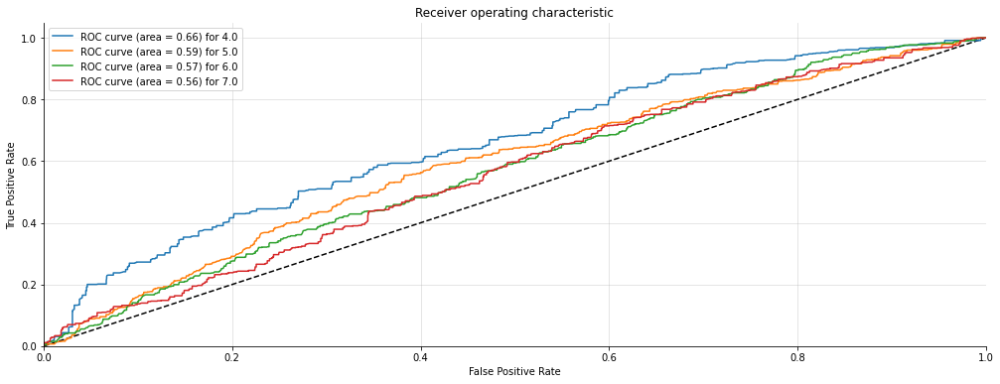

For column:  confusing<==>clear
              precision    recall  f1-score   support

         4.0       0.36      0.49      0.41       839
         5.0       0.33      0.31      0.32       863
         6.0       0.30      0.24      0.27       838
         7.0       0.26      0.25      0.25       820

    accuracy                           0.32      3360
   macro avg       0.31      0.32      0.31      3360
weighted avg       0.31      0.32      0.31      3360

Confusion Matrix: 
 [[411 124 137 167]
 [237 265 147 214]
 [249 212 198 179]
 [247 200 172 201]]
Accuracy Score : 0.31994047619047616
Precision Score : 0.31465049883346774
Recall Score : 0.31994047619047616
F1 Score : 0.3135649260075443
(3360, 4) (3360, 4)


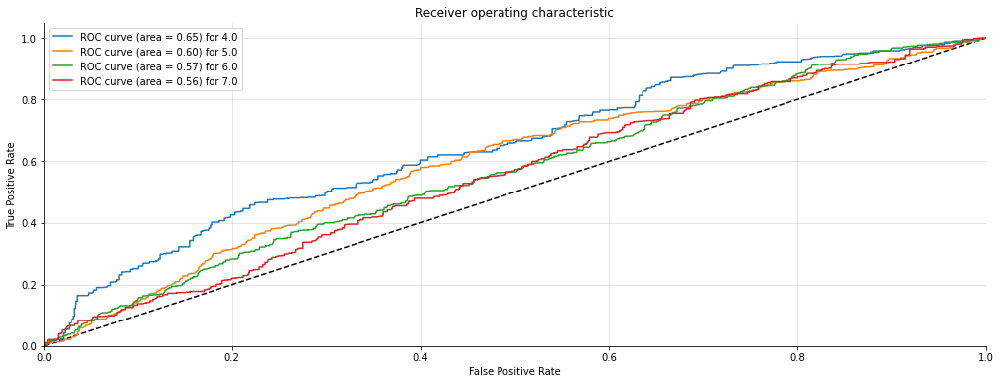

(3360, 4) (3360, 4)


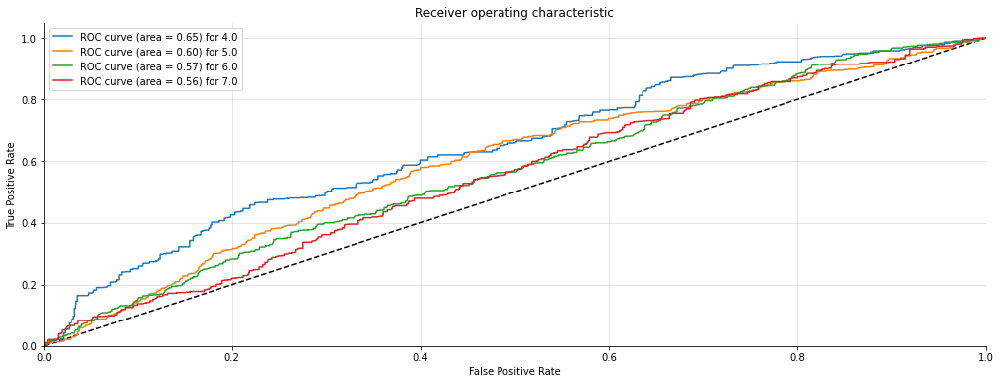

For column: boring<==>exciting
              precision    recall  f1-score   support

         3.0       0.43      0.46      0.44      1121
         4.0       0.43      0.39      0.41      1174
         5.0       0.36      0.37      0.37      1065

    accuracy                           0.41      3360
   macro avg       0.41      0.41      0.41      3360
weighted avg       0.41      0.41      0.41      3360

Confusion Matrix: 
 [[512 288 321]
 [338 460 376]
 [344 325 396]]
Accuracy Score : 0.40714285714285714
Precision Score : 0.40769387570936805
Recall Score : 0.40714285714285714
F1 Score : 0.40696226972776217
(3360, 3) (3360, 3)


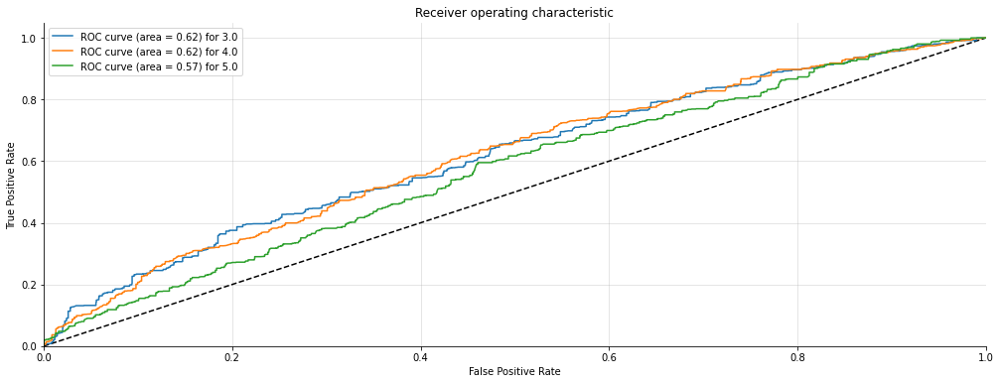

(3360, 3) (3360, 3)


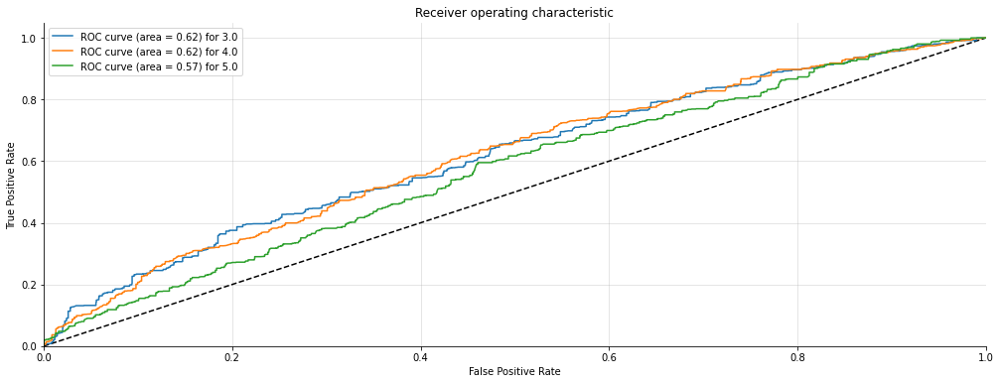

For column: not interesting<==>interesting
              precision    recall  f1-score   support

         3.0       0.35      0.47      0.40       840
         4.0       0.33      0.30      0.32       863
         5.0       0.30      0.24      0.26       838
         6.0       0.25      0.24      0.24       819

    accuracy                           0.31      3360
   macro avg       0.31      0.31      0.31      3360
weighted avg       0.31      0.31      0.31      3360

Confusion Matrix: 
 [[392 123 132 193]
 [227 262 162 212]
 [253 206 200 179]
 [246 200 180 193]]
Accuracy Score : 0.31160714285714286
Precision Score : 0.30728314087394487
Recall Score : 0.31160714285714286
F1 Score : 0.30640486756348984
(3360, 4) (3360, 4)


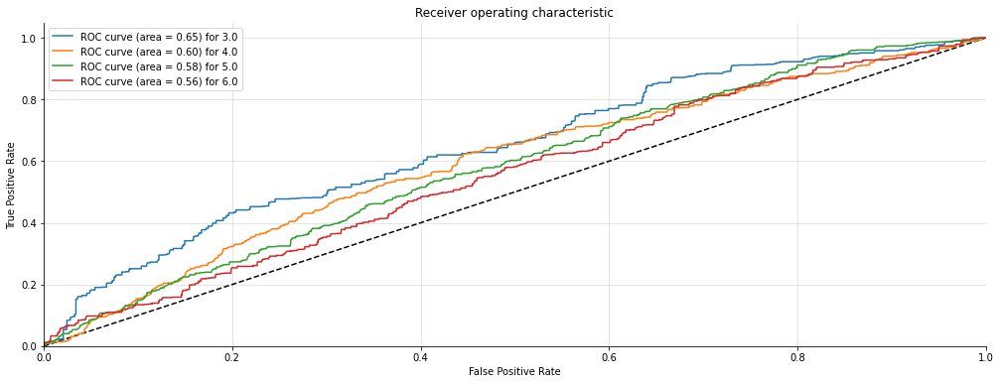

(3360, 4) (3360, 4)


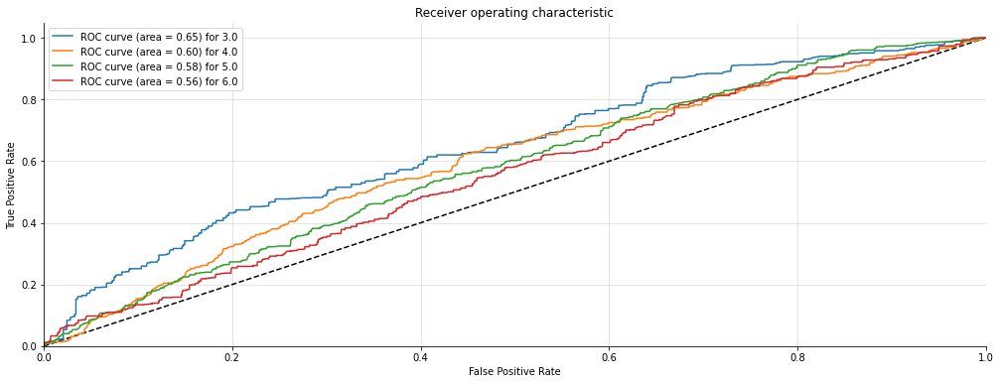

For column: conventional<==>inventive
              precision    recall  f1-score   support

         2.0       0.35      0.47      0.40       832
         3.0       0.33      0.28      0.30       881
         4.0       0.28      0.23      0.25       842
         5.0       0.26      0.25      0.26       805

    accuracy                           0.31      3360
   macro avg       0.30      0.31      0.30      3360
weighted avg       0.30      0.31      0.30      3360

Confusion Matrix: 
 [[392 125 146 169]
 [234 250 177 220]
 [247 213 190 192]
 [250 176 175 204]]
Accuracy Score : 0.30833333333333335
Precision Score : 0.3037005791712026
Recall Score : 0.30833333333333335
F1 Score : 0.3027150376942629
(3360, 4) (3360, 4)


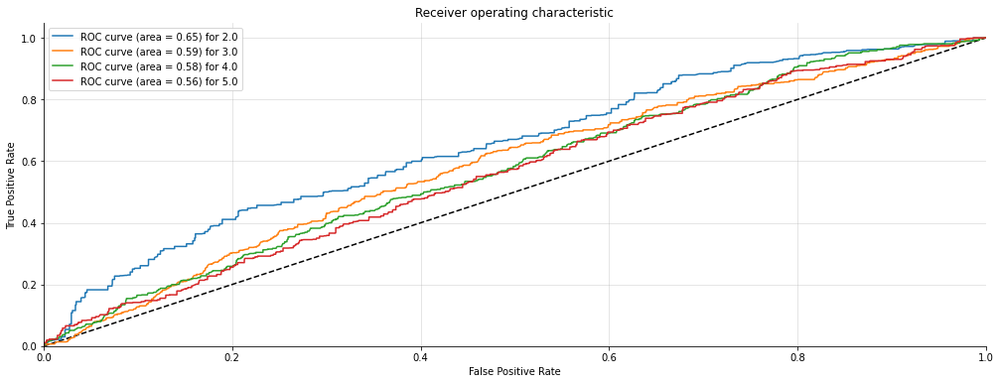

(3360, 4) (3360, 4)


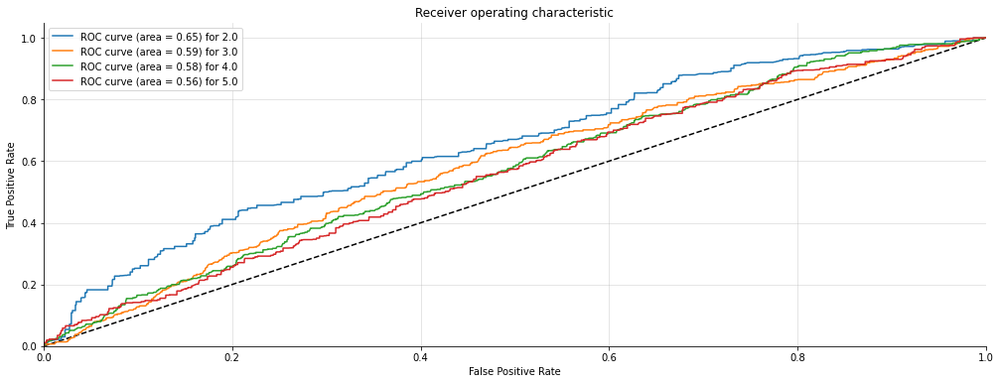

For column: usual<==>leading edge
              precision    recall  f1-score   support

         2.0       0.34      0.47      0.39       675
         3.0       0.27      0.21      0.23       677
         4.0       0.37      0.36      0.37       726
         5.0       0.30      0.32      0.31       637
         6.0       0.25      0.20      0.22       645

    accuracy                           0.31      3360
   macro avg       0.31      0.31      0.31      3360
weighted avg       0.31      0.31      0.31      3360

Confusion Matrix: 
 [[315  42  85 117 116]
 [137 140 141 133 126]
 [161 119 264 118  64]
 [163 105  88 207  74]
 [157 112 130 118 128]]
Accuracy Score : 0.3136904761904762
Precision Score : 0.30784855368068187
Recall Score : 0.3136904761904762
F1 Score : 0.3071111929441371
(3360, 5) (3360, 5)


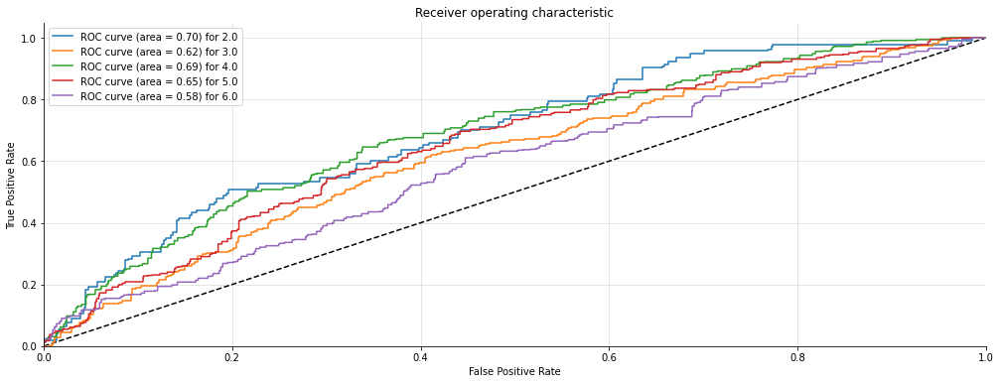

(3360, 5) (3360, 5)


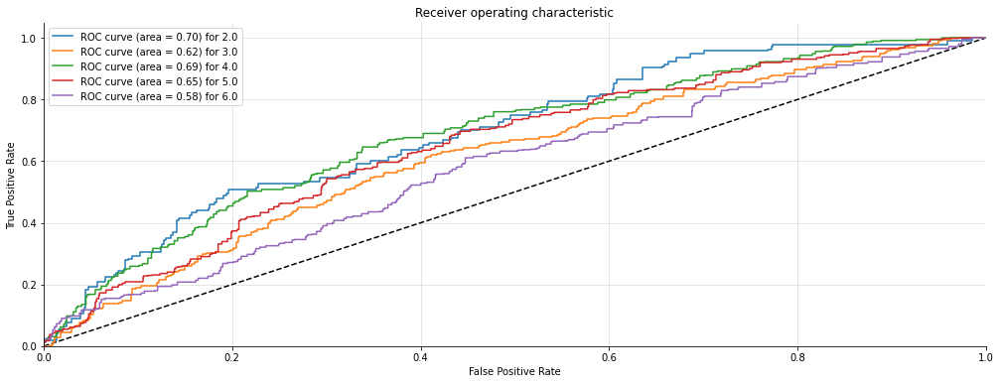

In [75]:
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC, LinearSVC
from sklearn.metrics import confusion_matrix,f1_score, precision_score, recall_score, classification_report
from sklearn.metrics import plot_confusion_matrix, accuracy_score
acc=[]
pre=[]
recal=[]
f1=[]
rms=[]
aucscore=[]
fpo=dict()
tpo=dict()
ffpo=[]
ttpo=[]
def Logistic(X_train, X_test, y_train, y_test, n_classes, figsize=(8, 6)):
    model = LogisticRegression(multi_class='multinomial', solver='lbfgs')   
    model.fit(X_train, y_train)

    # predictions over test set
    predictions = [round(float(x)) for x in model.predict(X_test)]
    print((classification_report(y_test, predictions)))


    # calculating Accuracy Score, Precision Score, Recall Score and F1 Score
    print('Confusion Matrix: \n' ,confusion_matrix(y_test, predictions))
    acc.append(accuracy_score(y_test, predictions))
    print(f'Accuracy Score : {accuracy_score(y_test, predictions)}')
    pre.append(precision_score(y_test,predictions,average='weighted'))
    print('Precision Score : ' + str(precision_score(y_test,predictions,average='weighted')))
    recal.append(recall_score(y_test,predictions,average='weighted'))
    print('Recall Score : ' + str(recall_score(y_test,predictions,average='weighted')))
    f1.append(f1_score(y_test,predictions,average='weighted'))
    print('F1 Score : ' + str(f1_score(y_test,predictions,average='weighted')))
    rms.append(np.sqrt(mean_squared_error(y_test,predictions)))
    aucscore.append(score_auc(y_test,predictions))
    fpo,tpo=plot_multiclass_roc(model, X_test, y_test, n_classes)
    ffpo.append(fpo)
    ttpo.append(tpo)
    plot_multiclass_roc(model, X_test, y_test, n_classes)

for i in range(8):
  print('For column:', df.columns[1:][i])
  n_classes = len(np.unique(df[df.columns[1:][i]]))
  Logistic(X_train, X_test, y_train[:,i], y_test[:,i], n_classes, figsize=(8, 6))

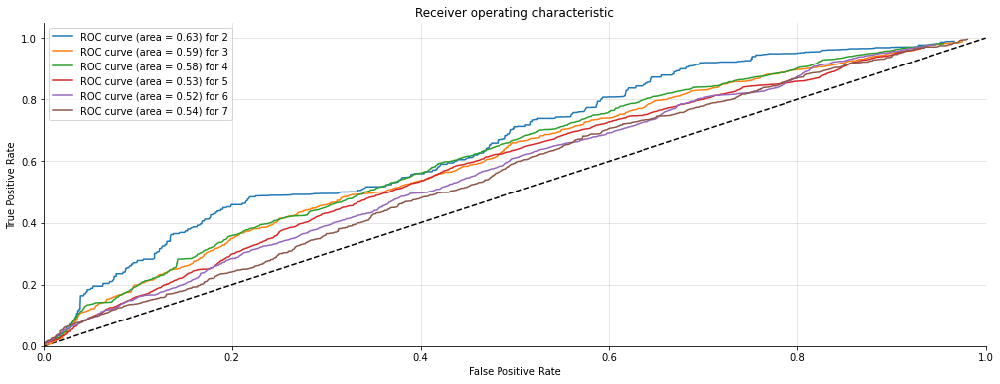

In [77]:
fsum5=list(np.array(dadd(dadd(dadd(ffpo[0][0],ffpo[1][1]),dadd(ffpo[2][1],ffpo[3][1])),dadd(dadd(ffpo[4][2],ffpo[5][2]),dadd(ffpo[6][3],ffpo[7][3]))))/8)
fsum6=list(np.array(dadd(dadd(dadd(ffpo[0][1],ffpo[1][2]),dadd(ffpo[2][2],ffpo[3][2])),dadd(dadd([0],ffpo[5][3]),dadd([0],ffpo[7][4]))))/6)
fsum7=list(np.array(dadd(dadd(dadd(ffpo[0][2],ffpo[1][3]),dadd(ffpo[2][3],ffpo[3][3])),dadd(dadd([0],[0]),dadd([0],[0]))))/4)
fsum4=list(np.array(dadd(dadd(dadd([0],ffpo[1][0]),dadd(ffpo[2][0],ffpo[3][0])),dadd(dadd(ffpo[4][1],ffpo[5][1]),dadd(ffpo[6][2],ffpo[7][2]))))/7)
fsum3=list(np.array(dadd(dadd(dadd([0],[0]),dadd([0],[0])),dadd(dadd(ffpo[4][0],ffpo[5][0]),dadd(ffpo[6][1],ffpo[7][1]))))/4)
fsum2=list(np.array(dadd(dadd(dadd([0],[0]),dadd([0],[0])),dadd(dadd([0],[0]),dadd(ffpo[6][0],ffpo[7][0]))))/2)




fpr=dict()

fsum2.sort()
fpr[0]=fsum2

fsum3.sort()
fpr[1]=fsum3

fsum4.sort()
fpr[2]=fsum4

fsum5.sort()
fpr[3]=fsum5

fsum6.sort()
fpr[4]=fsum6

fsum7.sort()
fpr[5]=fsum7











tsum5=list(np.array(dadd(dadd(dadd(ttpo[0][0],ttpo[1][1]),dadd(ttpo[2][1],ttpo[3][1])),dadd(dadd(ttpo[4][2],ttpo[5][2]),dadd(ttpo[6][3],ttpo[7][3]))))/8)
tsum6=list(np.array(dadd(dadd(dadd(ttpo[0][1],ttpo[1][2]),dadd(ttpo[2][2],ttpo[3][2])),dadd(dadd([0],ttpo[5][3]),dadd([0],ttpo[7][4]))))/6)
tsum7=list(np.array(dadd(dadd(dadd(ttpo[0][2],ttpo[1][3]),dadd(ttpo[2][3],ttpo[3][3])),dadd(dadd([0],[0]),dadd([0],[0]))))/4)
tsum4=list(np.array(dadd(dadd(dadd([0],ttpo[1][0]),dadd(ttpo[2][0],ttpo[3][0])),dadd(dadd(ttpo[4][1],ttpo[5][1]),dadd(ttpo[6][2],ttpo[7][2]))))/7)
tsum3=list(np.array(dadd(dadd(dadd([0],[0]),dadd([0],[0])),dadd(dadd(ttpo[4][0],ttpo[5][0]),dadd(ttpo[6][1],ttpo[7][1]))))/4)
tsum2=list(np.array(dadd(dadd(dadd([0],[0]),dadd([0],[0])),dadd(dadd([0],[0]),dadd(ttpo[6][0],ttpo[7][0]))))/2)


tpr=dict()

tsum2.sort()
tpr[0]=tsum2

tsum3.sort()
tpr[1]=tsum3

tsum4.sort()
tpr[2]=tsum4

tsum5.sort()
tpr[3]=tsum5

tsum6.sort()
tpr[4]=tsum6

tsum7.sort()
tpr[5]=tsum7


plot_multiclass_roc_avg(fpr,tpr,6)

In [78]:
print("average Accuracy :{}".format(np.mean(acc)))
print("average Precision :{}".format(np.mean(pre)))
print("average Recall :{}".format(np.mean(recal)))
print("average F1 -score :{}".format(np.mean(f1)))
print("average RMSE :{}".format(np.mean(rms)))
print("average AUC score {}".format(np.mean(aucscore)))
metric_df['LogisticModel'] = [np.mean(acc),np.mean(pre),np.mean(recal),np.mean(f1),np.mean(rms),np.mean(aucscore)]

average Accuracy :0.3347470238095238
average Precision :0.33106877004295243
average Recall :0.3347470238095238
average F1 -score :0.3300666091406702
average RMSE :1.484205007303038
average AUC score 0.547843146870042


# 4.5 Neural network - classifier

In [79]:
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam

initializer = tf.keras.initializers.RandomNormal(seed=1) # Reproducibility

model = Sequential(name="classifier_NN")
model.add(tf.keras.Input(shape=(X_train.shape[1],))) # Automatically detect features as input nodes
model.add(layers.Dense(512, activation='relu', kernel_initializer=initializer))
model.add(layers.Dense(256, activation='relu', kernel_initializer=initializer))
model.add(layers.Dropout(0.1))
model.add(layers.Dense(256, activation='relu', kernel_initializer=initializer))
model.add(layers.Dropout(0.1))
model.add(layers.Dense(256, activation='relu', kernel_initializer=initializer))
model.add(layers.Dense(128, activation='relu', kernel_initializer=initializer))
model.add(layers.Dropout(0.1))
model.add(layers.Dense(128, activation='relu', kernel_initializer=initializer))
model.add(layers.Dense(64, activation='relu', kernel_initializer=initializer))
model.add(layers.Dropout(0.1))
model.add(layers.Dense(8)) # output layer
opt = tf.keras.optimizers.Adam(learning_rate = 0.0003)
model.compile(loss=tf.keras.losses.MeanSquaredError(), metrics=['mae'], optimizer = opt)
model.summary()

Model: "classifier_NN"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_10 (Dense)             (None, 512)               20992     
_________________________________________________________________
dense_11 (Dense)             (None, 256)               131328    
_________________________________________________________________
dropout_6 (Dropout)          (None, 256)               0         
_________________________________________________________________
dense_12 (Dense)             (None, 256)               65792     
_________________________________________________________________
dropout_7 (Dropout)          (None, 256)               0         
_________________________________________________________________
dense_13 (Dense)             (None, 256)               65792     
_________________________________________________________________
dense_14 (Dense)             (None, 128)             

Epoch 1/150
588/588 - 1s - loss: 3.9751 - mae: 1.5538 - val_loss: 1.7688 - val_mae: 1.0326
Epoch 2/150
588/588 - 1s - loss: 1.7135 - mae: 1.0255 - val_loss: 1.5502 - val_mae: 1.0178
Epoch 3/150
588/588 - 1s - loss: 1.2430 - mae: 0.8693 - val_loss: 0.9010 - val_mae: 0.7582
Epoch 4/150
588/588 - 1s - loss: 1.0045 - mae: 0.7772 - val_loss: 1.1099 - val_mae: 0.8690
Epoch 5/150
588/588 - 1s - loss: 0.8651 - mae: 0.7215 - val_loss: 1.1806 - val_mae: 0.9097
Epoch 6/150
588/588 - 1s - loss: 0.7790 - mae: 0.6816 - val_loss: 0.6878 - val_mae: 0.6610
Epoch 7/150
588/588 - 1s - loss: 0.6979 - mae: 0.6433 - val_loss: 0.5028 - val_mae: 0.5407
Epoch 8/150
588/588 - 1s - loss: 0.6342 - mae: 0.6095 - val_loss: 0.5994 - val_mae: 0.6094
Epoch 9/150
588/588 - 1s - loss: 0.5925 - mae: 0.5892 - val_loss: 0.5917 - val_mae: 0.5990
Epoch 10/150
588/588 - 1s - loss: 0.5462 - mae: 0.5618 - val_loss: 0.4929 - val_mae: 0.5377
Epoch 11/150
588/588 - 1s - loss: 0.5288 - mae: 0.5524 - val_loss: 0.3886 - val_mae: 0.46

Epoch 91/150
588/588 - 1s - loss: 0.2921 - mae: 0.3748 - val_loss: 0.2628 - val_mae: 0.3459
Epoch 92/150
588/588 - 1s - loss: 0.2984 - mae: 0.3786 - val_loss: 0.2637 - val_mae: 0.3437
Epoch 93/150
588/588 - 1s - loss: 0.2955 - mae: 0.3772 - val_loss: 0.2619 - val_mae: 0.3213
Epoch 94/150
588/588 - 1s - loss: 0.3001 - mae: 0.3769 - val_loss: 0.2639 - val_mae: 0.3365
Epoch 95/150
588/588 - 1s - loss: 0.2917 - mae: 0.3741 - val_loss: 0.2635 - val_mae: 0.3318
Epoch 96/150
588/588 - 1s - loss: 0.2928 - mae: 0.3753 - val_loss: 0.2598 - val_mae: 0.3318
Epoch 97/150
588/588 - 1s - loss: 0.2936 - mae: 0.3733 - val_loss: 0.2640 - val_mae: 0.3381
Epoch 98/150
588/588 - 1s - loss: 0.2867 - mae: 0.3686 - val_loss: 0.2622 - val_mae: 0.3367
Epoch 99/150
588/588 - 1s - loss: 0.2903 - mae: 0.3709 - val_loss: 0.2659 - val_mae: 0.3425
Epoch 100/150
588/588 - 1s - loss: 0.2907 - mae: 0.3697 - val_loss: 0.2603 - val_mae: 0.3311
Epoch 00100: early stopping


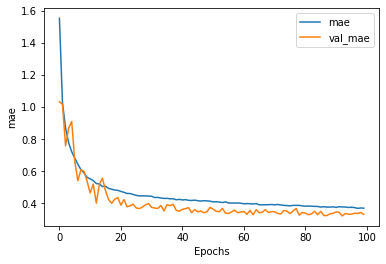

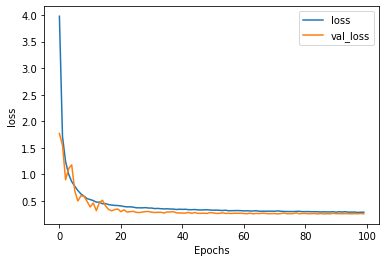

In [80]:
es = tf.keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=15)
history = model.fit(X_train, y_train, epochs=150, batch_size = 16, validation_split=0.3, 
                    callbacks = [es], # Call checkpoint variable if neccessary
                    verbose=2)

plot_graphs(history, "mae")
plot_graphs(history, "loss")

In [81]:
scores = model.evaluate(
    X_test, y_test, batch_size=1, verbose=1, sample_weight=None, steps=None,
    callbacks=None, max_queue_size=10, workers=4, use_multiprocessing=False,
    return_dict=False
)
print("------------------ EVALUATION FINISHED! ------------------".center(115))
for i in range(len(scores)):
    print("%s: %.2f%%" % (model.metrics_names[i], scores[i]*100))

3360/3360 [==============================] - 2s 701us/step - loss: 0.2541 - mae: 0.3270
                             ------------------ EVALUATION FINISHED! ------------------                            
loss: 25.41%
mae: 32.70%


In [82]:
from sklearn.metrics import confusion_matrix,f1_score, precision_score, recall_score, classification_report
from sklearn.metrics import plot_confusion_matrix, accuracy_score
from sklearn.metrics import mean_squared_error
acc=[]
pre=[]
recal=[]
f1=[]
rms=[]
aucscore=[]

In [83]:
from sklearn.metrics import classification_report, f1_score
y_pred = model.predict(X_test)
for i in range(8):
    print("Column", df.columns[1:][i])
    estimates = [round(float(x)) for x in y_pred[:,i]]
    estimates = transform_results(estimates)
    print(np.unique(estimates))
    acc.append(accuracy_score(y_test[:,i], estimates))
    pre.append(precision_score(y_test[:,i], estimates,average='weighted'))
    recal.append(recall_score(y_test[:,i], estimates,average='weighted'))
    f1.append(f1_score(y_test[:,i], estimates,average='weighted'))
    rms.append(np.sqrt(mean_squared_error(y_test[:,i], estimates)))
    aucscore.append(score_auc(y_test[:,i], estimates))
    print(classification_report(y_test[:,i], estimates), "\n------")

Column obstructive<==>supportive
[5 6 7]
              precision    recall  f1-score   support

         5.0       0.81      0.87      0.84      1112
         6.0       0.80      0.65      0.72      1171
         7.0       0.79      0.90      0.84      1077

    accuracy                           0.80      3360
   macro avg       0.80      0.80      0.80      3360
weighted avg       0.80      0.80      0.80      3360
 
------
Column complicated<==>easy
[4 5 6 7]
              precision    recall  f1-score   support

         4.0       0.93      0.79      0.85       834
         5.0       0.63      0.70      0.66       875
         6.0       0.56      0.75      0.64       842
         7.0       0.94      0.65      0.77       809

    accuracy                           0.72      3360
   macro avg       0.76      0.72      0.73      3360
weighted avg       0.76      0.72      0.73      3360
 
------
Column inefficient<==>efficient
[4 5 6 7]
              precision    recall  f1-score   su

In [84]:
print("average Accuracy :{}".format(np.mean(acc)))
print("average Precision :{}".format(np.mean(pre)))
print("average Recall :{}".format(np.mean(recal)))
print("average F1 -score :{}".format(np.mean(f1)))
print("average RMSE -score :{}".format(np.mean(rms)))
print("average AUC -score :{}".format(np.mean(aucscore)))
metric_df['Neural Network classifier 2'] = [np.mean(acc),np.mean(pre),np.mean(recal),np.mean(f1),np.mean(rms),np.mean(aucscore)]

average Accuracy :0.7618675595238096
average Precision :0.7893578448826182
average Recall :0.7618675595238096
average F1 -score :0.7664862045840535
average RMSE -score :0.5510571279269421
average AUC -score :0.8370985024372853


# 4.6 LSTM 

In [85]:
## Callbacks
es = tf.keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=7)

checkpoint = tf.keras.callbacks.ModelCheckpoint(
  "model_checkpoints", monitor="val_loss", verbose=1, save_best_only=True, mode="min")

## Optimizer
opt = tf.keras.optimizers.Adam(learning_rate=0.001)

LSTM_model = tf.keras.Sequential([
    tf.keras.layers.Embedding(4000, 128),
    tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(128)),
    #tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(32)),
    # use ReLU in place of tanh function since they are very good alternatives of each other.
    tf.keras.layers.Dense(64, activation='relu', 
                          
                          # Prevent overfitting
                          kernel_regularizer=tf.keras.regularizers.L2(l2=0.01), 

                          # Ensuring consistent outputs and not run into potential local optima
                          # Avoid initializing standard normal (mean = 0, std = 1) to reach faster convergence and less initial loss.
                          kernel_initializer=tf.keras.initializers.RandomNormal(seed=42)
                          
                          ),
     
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(8, activation='linear')
])
LSTM_model.summary()

LSTM_model.compile(loss=tf.keras.losses.MeanSquaredError(), optimizer= opt, metrics=['mae'])

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_1 (Embedding)      (None, None, 128)         512000    
_________________________________________________________________
bidirectional_1 (Bidirection (None, 256)               263168    
_________________________________________________________________
dense_18 (Dense)             (None, 64)                16448     
_________________________________________________________________
dropout_10 (Dropout)         (None, 64)                0         
_________________________________________________________________
dense_19 (Dense)             (None, 8)                 520       
Total params: 792,136
Trainable params: 792,136
Non-trainable params: 0
_________________________________________________________________


In [86]:
history = LSTM_model.fit(X_train, y_train, epochs=100, batch_size = 512, validation_split=0.2, 
                    callbacks = [es], # Call checkpoint variable if neccessary
                    verbose=1)

Epoch 1/100
21/21 [==============================] - 10s 423ms/step - loss: 14.1372 - mae: 3.1425 - val_loss: 1.7104 - val_mae: 1.0052
Epoch 2/100
21/21 [==============================] - 9s 408ms/step - loss: 2.5108 - mae: 1.2167 - val_loss: 1.5714 - val_mae: 0.9557
Epoch 3/100
21/21 [==============================] - 9s 409ms/step - loss: 2.1839 - mae: 1.1403 - val_loss: 1.4549 - val_mae: 0.9543
Epoch 4/100
21/21 [==============================] - 9s 412ms/step - loss: 2.0925 - mae: 1.1219 - val_loss: 1.3994 - val_mae: 0.9358
Epoch 5/100
21/21 [==============================] - 9s 413ms/step - loss: 2.0368 - mae: 1.1138 - val_loss: 1.3926 - val_mae: 0.9417
Epoch 6/100
21/21 [==============================] - 9s 412ms/step - loss: 1.9581 - mae: 1.0935 - val_loss: 1.3619 - val_mae: 0.9315
Epoch 7/100
21/21 [==============================] - 9s 411ms/step - loss: 1.9152 - mae: 1.0859 - val_loss: 1.3476 - val_mae: 0.9299
Epoch 8/100
21/21 [==============================] - 9s 413ms/step 

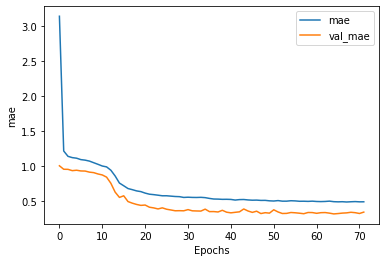

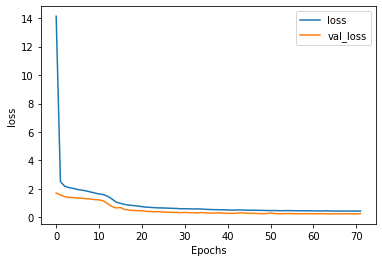

In [87]:
plot_graphs(history, "mae")
plot_graphs(history, "loss")

In [88]:
scores = LSTM_model.evaluate(
    X_test, y_test, batch_size=1, verbose=1, sample_weight=None, steps=None,
    callbacks=None, max_queue_size=10, workers=4, use_multiprocessing=False,
    return_dict=False
)
print("------------------ EVALUATION FINISHED! ------------------".center(115))
for i in range(len(scores)):
    print("%s: %.2f%%" % (model.metrics_names[i], scores[i]*100))

3360/3360 [==============================] - 8s 2ms/step - loss: 0.2556 - mae: 0.3417
                             ------------------ EVALUATION FINISHED! ------------------                            
loss: 25.56%
mae: 34.17%


In [89]:
from sklearn.metrics import confusion_matrix,f1_score, precision_score, recall_score, classification_report
from sklearn.metrics import plot_confusion_matrix, accuracy_score
from sklearn.metrics import mean_squared_error
acc=[]
pre=[]
recal=[]
f1=[]
rms=[]
aucscore=[]

In [90]:
from sklearn.metrics import classification_report, f1_score
y_pred = LSTM_model.predict(X_test)
for i in range(8):
    print("Column", df.columns[1:][i])
    estimates = [round(float(x)) for x in y_pred[:,i]]
    estimates = transform_results(estimates)
    print(np.unique(estimates))
    acc.append(accuracy_score(y_test[:,i], estimates))
    pre.append(precision_score(y_test[:,i], estimates,average='weighted'))
    recal.append(recall_score(y_test[:,i], estimates,average='weighted'))
    f1.append(f1_score(y_test[:,i], estimates,average='weighted'))
    rms.append(np.sqrt(mean_squared_error(y_test[:,i], estimates)))
    aucscore.append(score_auc(y_test[:,i], estimates))
    print(classification_report(y_test[:,i], estimates), "\n------")

Column obstructive<==>supportive
[5 6 7]
              precision    recall  f1-score   support

         5.0       0.80      0.90      0.85      1112
         6.0       0.68      0.75      0.71      1171
         7.0       0.88      0.67      0.76      1077

    accuracy                           0.77      3360
   macro avg       0.79      0.77      0.77      3360
weighted avg       0.78      0.77      0.77      3360
 
------
Column complicated<==>easy
[4 5 6 7]
              precision    recall  f1-score   support

         4.0       0.94      0.80      0.87       834
         5.0       0.62      0.84      0.72       875
         6.0       0.64      0.63      0.63       842
         7.0       0.94      0.72      0.82       809

    accuracy                           0.75      3360
   macro avg       0.78      0.75      0.76      3360
weighted avg       0.78      0.75      0.76      3360
 
------
Column inefficient<==>efficient
[4 5 6 7]
              precision    recall  f1-score   su

In [91]:
print("average Accuracy :{}".format(np.mean(acc)))
print("average Precision :{}".format(np.mean(pre)))
print("average Recall :{}".format(np.mean(recal)))
print("average F1 -score :{}".format(np.mean(f1)))
print("average RMSE -score :{}".format(np.mean(rms)))
print("average AUC -score :{}".format(np.mean(aucscore)))
metric_df['Bidirectional LSTM 2'] = [np.mean(acc),np.mean(pre),np.mean(recal),np.mean(f1),np.mean(rms),np.mean(aucscore)]

average Accuracy :0.7761904761904762
average Precision :0.7995152113910466
average Recall :0.7761904761904762
average F1 -score :0.779754971690248
average RMSE -score :0.5296411718113286
average AUC -score :0.8450571535208016


# 4.7 Ensemble

In [92]:
from sklearn.model_selection import cross_val_score
from sklearn.datasets import make_blobs
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier


# 4.7.1 Decison tree classifier

For column: obstructive<==>supportive
              precision    recall  f1-score   support

         5.0       0.81      0.91      0.85      1112
         6.0       0.84      0.66      0.74      1171
         7.0       0.82      0.90      0.86      1077

    accuracy                           0.82      3360
   macro avg       0.82      0.82      0.82      3360
weighted avg       0.82      0.82      0.81      3360

Confusion Matrix: 
 [[1010   72   30]
 [ 213  770  188]
 [  28   76  973]]
Accuracy Score : 0.8193452380952381
Precision Score : 0.8213855968733235
Recall Score : 0.8193452380952381
F1 Score : 0.8148618969909472
(3360, 3) (3360, 3)


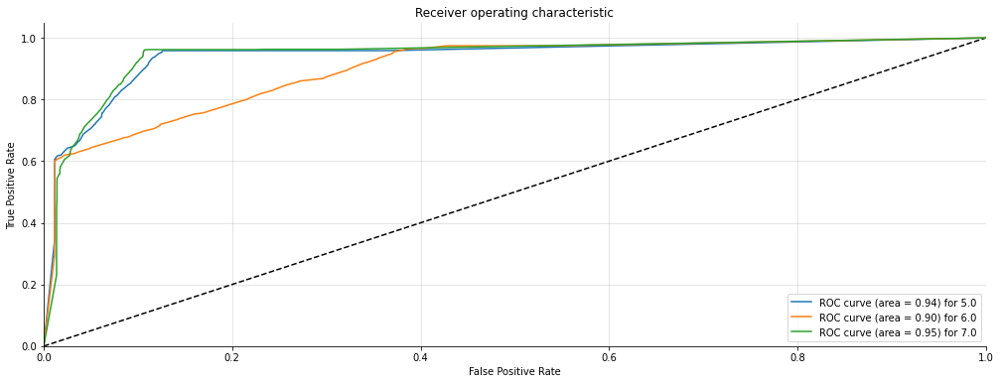

For column: complicated<==>easy
              precision    recall  f1-score   support

         4.0       0.94      0.80      0.87       834
         5.0       0.65      0.73      0.69       875
         6.0       0.63      0.73      0.67       842
         7.0       0.93      0.77      0.84       809

    accuracy                           0.76      3360
   macro avg       0.79      0.76      0.77      3360
weighted avg       0.78      0.76      0.77      3360

Confusion Matrix: 
 [[669 140  17   8]
 [ 30 643 192  10]
 [  3 192 615  32]
 [  8  18 158 625]]
Accuracy Score : 0.7595238095238095
Precision Score : 0.7823888217024539
Recall Score : 0.7595238095238095
F1 Score : 0.7661730859702275
(3360, 4) (3360, 4)


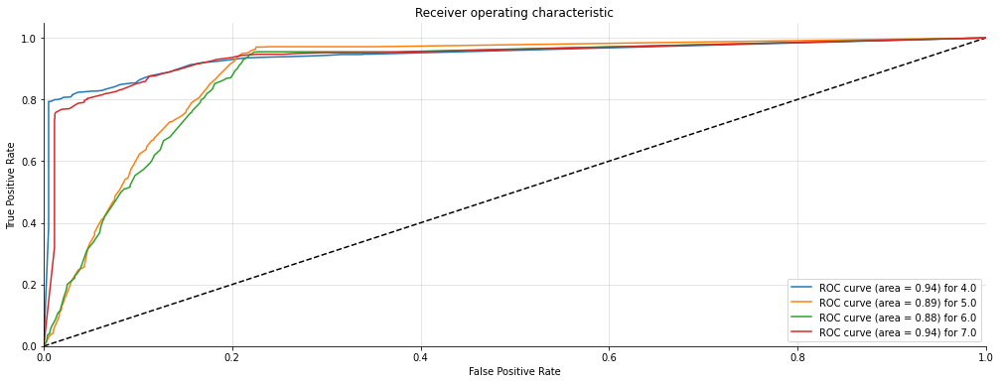

For column: inefficient<==>efficient
              precision    recall  f1-score   support

         4.0       0.93      0.80      0.86       829
         5.0       0.65      0.72      0.69       882
         6.0       0.63      0.74      0.68       847
         7.0       0.92      0.77      0.84       802

    accuracy                           0.76      3360
   macro avg       0.78      0.76      0.77      3360
weighted avg       0.78      0.76      0.76      3360

Confusion Matrix: 
 [[660 145  14  10]
 [ 32 635 205  10]
 [  6 178 627  36]
 [ 10  14 157 621]]
Accuracy Score : 0.7568452380952381
Precision Score : 0.778018195856279
Recall Score : 0.7568452380952381
F1 Score : 0.763019807556809
(3360, 4) (3360, 4)


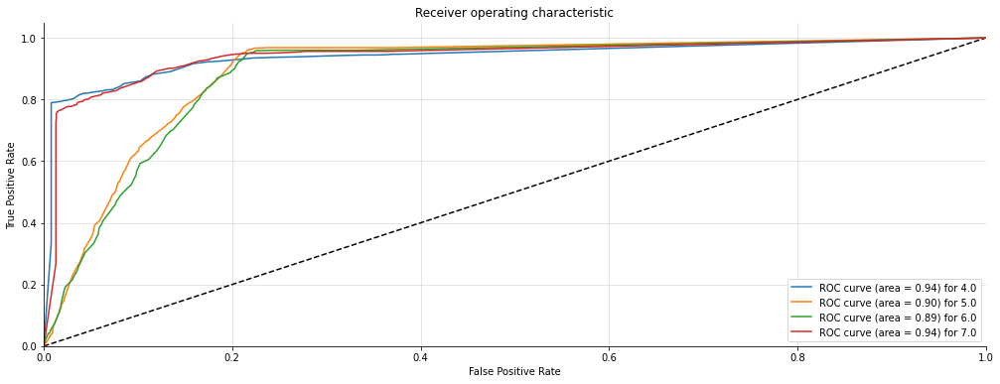

For column:  confusing<==>clear
              precision    recall  f1-score   support

         4.0       0.88      0.80      0.84       839
         5.0       0.60      0.73      0.66       863
         6.0       0.65      0.69      0.67       838
         7.0       0.94      0.76      0.84       820

    accuracy                           0.75      3360
   macro avg       0.77      0.75      0.75      3360
weighted avg       0.77      0.75      0.75      3360

Confusion Matrix: 
 [[675 164   0   0]
 [ 68 626 157  12]
 [ 12 224 576  26]
 [  8  27 158 627]]
Accuracy Score : 0.7452380952380953
Precision Score : 0.7666891208142328
Recall Score : 0.7452380952380953
F1 Score : 0.7515736185406297
(3360, 4) (3360, 4)


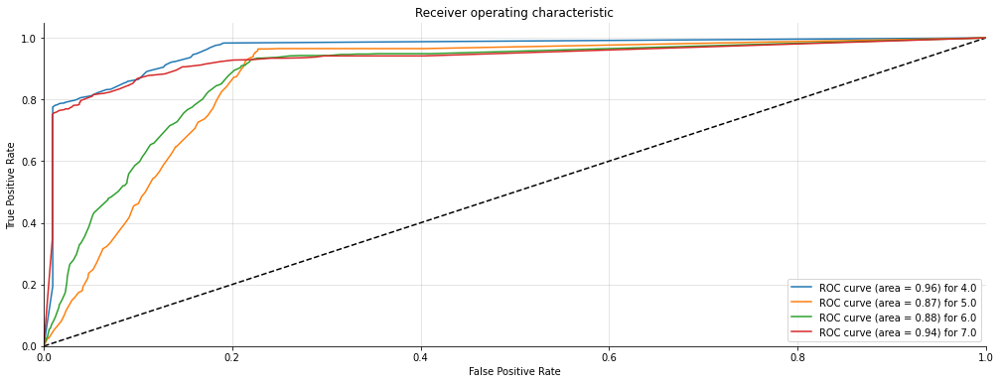

For column: boring<==>exciting
              precision    recall  f1-score   support

         3.0       0.81      0.91      0.86      1121
         4.0       0.82      0.65      0.73      1174
         5.0       0.80      0.88      0.84      1065

    accuracy                           0.81      3360
   macro avg       0.81      0.82      0.81      3360
weighted avg       0.81      0.81      0.81      3360

Confusion Matrix: 
 [[1023   71   27]
 [ 208  763  203]
 [  29   96  940]]
Accuracy Score : 0.8113095238095238
Precision Score : 0.8121938124919116
Recall Score : 0.8113095238095238
F1 Score : 0.8067268367499799
(3360, 3) (3360, 3)


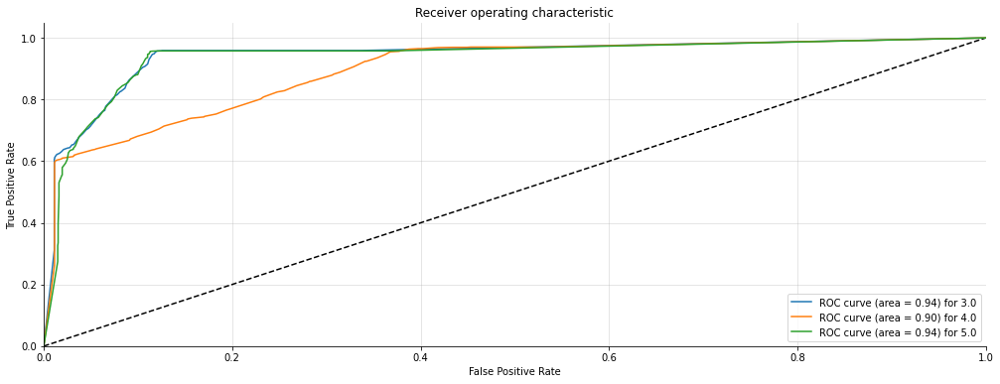

For column: not interesting<==>interesting
              precision    recall  f1-score   support

         3.0       0.89      0.80      0.84       840
         4.0       0.59      0.71      0.65       863
         5.0       0.64      0.70      0.67       838
         6.0       0.95      0.76      0.85       819

    accuracy                           0.74      3360
   macro avg       0.77      0.74      0.75      3360
weighted avg       0.77      0.74      0.75      3360

Confusion Matrix: 
 [[675 165   0   0]
 [ 70 617 161  15]
 [  8 231 584  15]
 [  9  26 162 622]]
Accuracy Score : 0.743452380952381
Precision Score : 0.7671032067118362
Recall Score : 0.743452380952381
F1 Score : 0.7503850795108116
(3360, 4) (3360, 4)


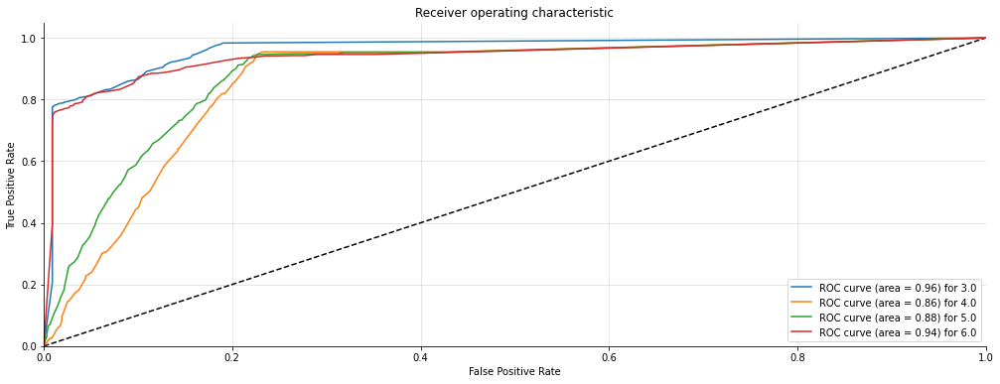

For column: conventional<==>inventive
              precision    recall  f1-score   support

         2.0       0.94      0.80      0.86       832
         3.0       0.65      0.73      0.69       881
         4.0       0.63      0.73      0.67       842
         5.0       0.92      0.78      0.84       805

    accuracy                           0.76      3360
   macro avg       0.78      0.76      0.77      3360
weighted avg       0.78      0.76      0.76      3360

Confusion Matrix: 
 [[664 141  21   6]
 [ 36 643 187  15]
 [  3 193 613  33]
 [  6  19 155 625]]
Accuracy Score : 0.7574404761904762
Precision Score : 0.7790978447104705
Recall Score : 0.7574404761904762
F1 Score : 0.7638355532372623
(3360, 4) (3360, 4)


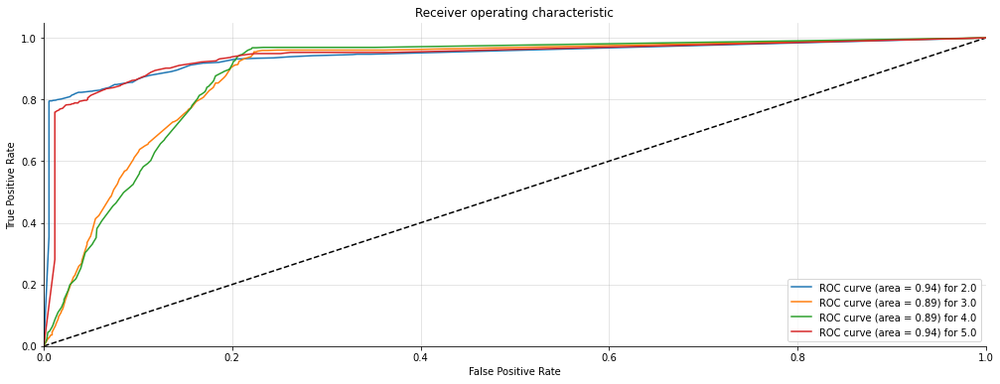

For column: usual<==>leading edge
              precision    recall  f1-score   support

         2.0       1.00      1.00      1.00       675
         3.0       1.00      1.00      1.00       677
         4.0       0.99      1.00      1.00       726
         5.0       1.00      1.00      1.00       637
         6.0       1.00      0.99      1.00       645

    accuracy                           1.00      3360
   macro avg       1.00      1.00      1.00      3360
weighted avg       1.00      1.00      1.00      3360

Confusion Matrix: 
 [[675   0   0   0   0]
 [  0 677   0   0   0]
 [  0   0 726   0   0]
 [  0   0   0 636   1]
 [  0   0   5   0 640]]
Accuracy Score : 0.9982142857142857
Precision Score : 0.9982226069871405
Recall Score : 0.9982142857142857
F1 Score : 0.9982139450118394
(3360, 5) (3360, 5)


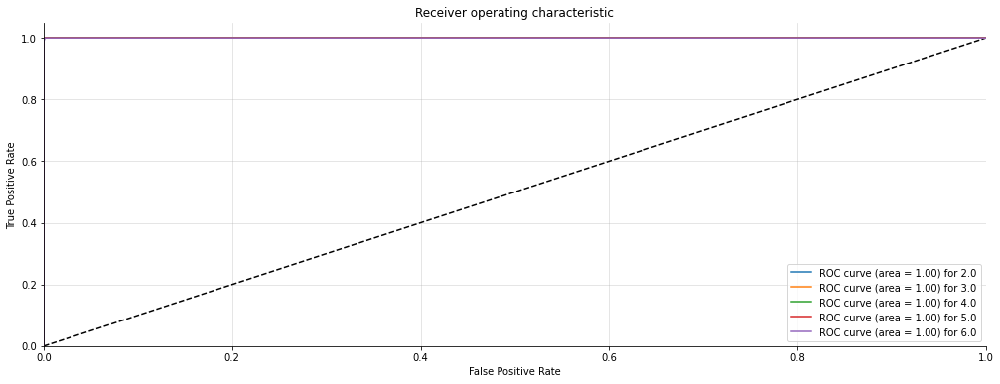

In [93]:
acc=[]
pre=[]
recal=[]
f1=[]
rms=[]
aucscore=[]
fpo=dict()
tpo=dict()
ffpo=[]
ttpo=[]
from sklearn.metrics import confusion_matrix,f1_score, precision_score, recall_score, classification_report
from sklearn.metrics import plot_confusion_matrix, accuracy_score
def DTC(X_train, X_test, y_train, y_test, n_classes, figsize=(8, 6)):
    model = DecisionTreeClassifier(max_depth=None, min_samples_split=2,
     random_state=0)   
    model.fit(X_train, y_train)

    # predictions over test set
    predictions = [round(float(x)) for x in model.predict(X_test)]
    print((classification_report(y_test, predictions)))


    # calculating Accuracy Score, Precision Score, Recall Score and F1 Score
    print('Confusion Matrix: \n' ,confusion_matrix(y_test, predictions))
    acc.append(accuracy_score(y_test, predictions))
    print(f'Accuracy Score : {accuracy_score(y_test, predictions)}')
    pre.append(precision_score(y_test,predictions,average='weighted'))
    print('Precision Score : ' + str(precision_score(y_test,predictions,average='weighted')))
    recal.append(recall_score(y_test,predictions,average='weighted'))
    print('Recall Score : ' + str(recall_score(y_test,predictions,average='weighted')))
    f1.append(f1_score(y_test,predictions,average='weighted'))
    print('F1 Score : ' + str(f1_score(y_test,predictions,average='weighted')))
    aucscore.append(score_auc(y_test,predictions))
    rms.append(np.sqrt(mean_squared_error(y_test,predictions)))
    fpo,tpo=plot_multiclass_roc(model, X_test, y_test, n_classes)
    ffpo.append(fpo)
    ttpo.append(tpo)


for i in range(8):
  print('For column:', df.columns[1:][i])
  n_classes = len(np.unique(df[df.columns[1:][i]]))
  DTC(X_train, X_test, y_train[:,i], y_test[:,i], n_classes, figsize=(8, 6))

In [94]:
fsum0=[]
fsum1=[]
fsum2=[]
fsum3=[]
fsum4=[]
fsum5=[]
fsum6=[]
tsum0=[]
tsum1=[]
tsum2=[]
tsum3=[]
tsum4=[]
tsum5=[]
tsum6=[]

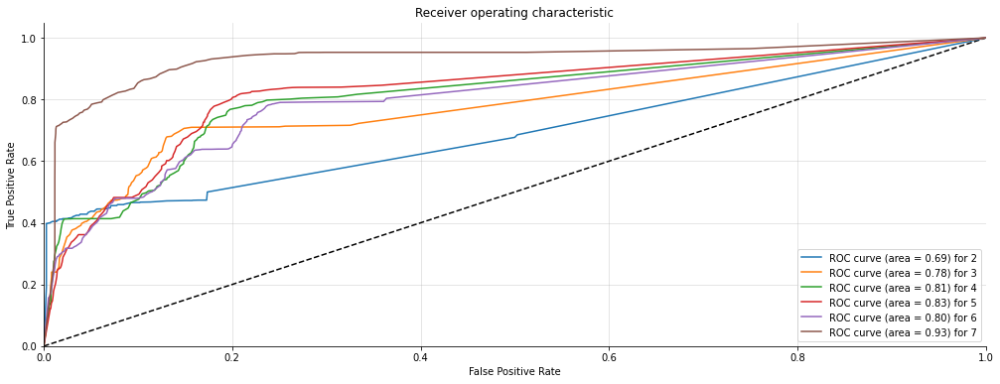

In [95]:
fsum5=list(np.array(dadd(dadd(dadd(ffpo[0][0],ffpo[1][1]),dadd(ffpo[2][1],ffpo[3][1])),dadd(dadd(ffpo[4][2],ffpo[5][2]),dadd(ffpo[6][3],ffpo[7][3]))))/8)
fsum6=list(np.array(dadd(dadd(dadd(ffpo[0][1],ffpo[1][2]),dadd(ffpo[2][2],ffpo[3][2])),dadd(dadd([0],ffpo[5][3]),dadd([0],ffpo[7][4]))))/6)
fsum7=list(np.array(dadd(dadd(dadd(ffpo[0][2],ffpo[1][3]),dadd(ffpo[2][3],ffpo[3][3])),dadd(dadd([0],[0]),dadd([0],[0]))))/4)
fsum4=list(np.array(dadd(dadd(dadd([0],ffpo[1][0]),dadd(ffpo[2][0],ffpo[3][0])),dadd(dadd(ffpo[4][1],ffpo[5][1]),dadd(ffpo[6][2],ffpo[7][2]))))/7)
fsum3=list(np.array(dadd(dadd(dadd([0],[0]),dadd([0],[0])),dadd(dadd(ffpo[4][0],ffpo[5][0]),dadd(ffpo[6][1],ffpo[7][1]))))/4)
fsum2=list(np.array(dadd(dadd(dadd([0],[0]),dadd([0],[0])),dadd(dadd([0],[0]),dadd(ffpo[6][0],ffpo[7][0]))))/2)




fpr=dict()

fsum2.sort()
fpr[0]=fsum2+[1]

fsum3.sort()
fpr[1]=fsum3+[1]

fsum4.sort()
fpr[2]=fsum4+[1]

fsum5.sort()
fpr[3]=fsum5+[1]

fsum6.sort()
fpr[4]=fsum6+[1]

fsum7.sort()
fpr[5]=fsum7+[1]











tsum5=list(np.array(dadd(dadd(dadd(ttpo[0][0],ttpo[1][1]),dadd(ttpo[2][1],ttpo[3][1])),dadd(dadd(ttpo[4][2],ttpo[5][2]),dadd(ttpo[6][3],ttpo[7][3]))))/8)
tsum6=list(np.array(dadd(dadd(dadd(ttpo[0][1],ttpo[1][2]),dadd(ttpo[2][2],ttpo[3][2])),dadd(dadd([0],ttpo[5][3]),dadd([0],ttpo[7][4]))))/6)
tsum7=list(np.array(dadd(dadd(dadd(ttpo[0][2],ttpo[1][3]),dadd(ttpo[2][3],ttpo[3][3])),dadd(dadd([0],[0]),dadd([0],[0]))))/4)
tsum4=list(np.array(dadd(dadd(dadd([0],ttpo[1][0]),dadd(ttpo[2][0],ttpo[3][0])),dadd(dadd(ttpo[4][1],ttpo[5][1]),dadd(ttpo[6][2],ttpo[7][2]))))/7)
tsum3=list(np.array(dadd(dadd(dadd([0],[0]),dadd([0],[0])),dadd(dadd(ttpo[4][0],ttpo[5][0]),dadd(ttpo[6][1],ttpo[7][1]))))/4)
tsum2=list(np.array(dadd(dadd(dadd([0],[0]),dadd([0],[0])),dadd(dadd([0],[0]),dadd(ttpo[6][0],ttpo[7][0]))))/2)


tpr=dict()

tsum2.sort()
tpr[0]=tsum2+[1]

tsum3.sort()
tpr[1]=tsum3+[1]

tsum4.sort()
tpr[2]=tsum4+[1]

tsum5.sort()
tpr[3]=tsum5+[1]

tsum6.sort()
tpr[4]=tsum6+[1]

tsum7.sort()
tpr[5]=tsum7+[1]


plot_multiclass_roc_avg(fpr,tpr,6)

In [96]:
print("average Accuracy :{}".format(np.mean(acc)))
print("average Precision :{}".format(np.mean(pre)))
print("average Recall :{}".format(np.mean(recal)))
print("average F1 -score :{}".format(np.mean(f1)))
print("average RMSE :{}".format(np.mean(rms)))
print("average AUC score {}".format(np.mean(aucscore)))
metric_df['DecisionTreeclasssifier'] = [np.mean(acc),np.mean(pre),np.mean(recal),np.mean(f1),np.mean(rms),np.mean(aucscore)]

average Accuracy :0.7989211309523809
average Precision :0.813137400768456
average Recall :0.7989211309523809
average F1 -score :0.8018487279460633
average RMSE :0.48647065205330237
average AUC score 0.8616371075120781


# 4.7.2 Random forest classifier

For column: obstructive<==>supportive
              precision    recall  f1-score   support

         5.0       0.81      0.88      0.85      1112
         6.0       0.83      0.67      0.74      1171
         7.0       0.82      0.91      0.86      1077

    accuracy                           0.82      3360
   macro avg       0.82      0.82      0.82      3360
weighted avg       0.82      0.82      0.81      3360

Confusion Matrix: 
 [[983  99  30]
 [199 781 191]
 [ 28  65 984]]
Accuracy Score : 0.8178571428571428
Precision Score : 0.8186427019696361
Recall Score : 0.8178571428571428
F1 Score : 0.8139088492038725
(3360, 3) (3360, 3)


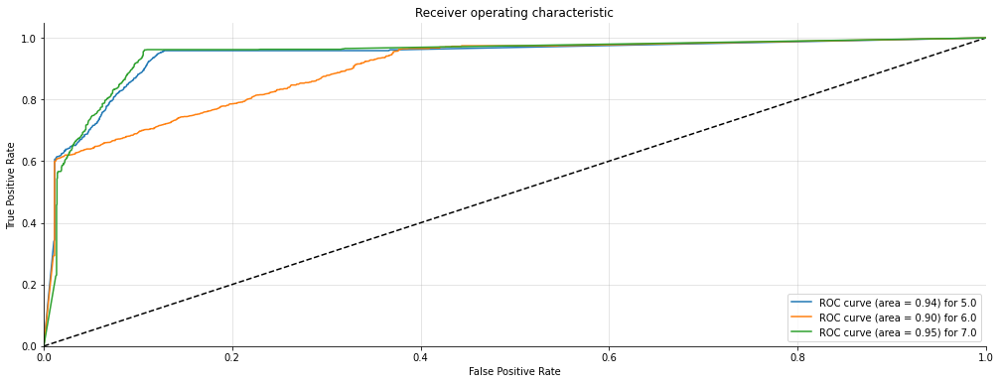

For column: complicated<==>easy
              precision    recall  f1-score   support

         4.0       0.96      0.80      0.87       834
         5.0       0.66      0.72      0.69       875
         6.0       0.62      0.76      0.69       842
         7.0       0.92      0.77      0.84       809

    accuracy                           0.76      3360
   macro avg       0.79      0.77      0.77      3360
weighted avg       0.79      0.76      0.77      3360

Confusion Matrix: 
 [[667 142  16   9]
 [ 17 634 214  10]
 [  2 163 643  34]
 [  8  18 157 626]]
Accuracy Score : 0.7648809523809523
Precision Score : 0.7894997032664569
Recall Score : 0.7648809523809523
F1 Score : 0.7716818184754914
(3360, 4) (3360, 4)


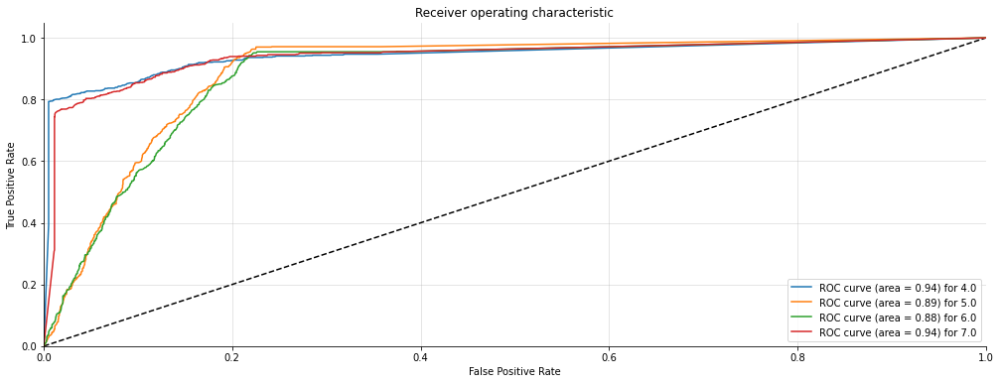

For column: inefficient<==>efficient
              precision    recall  f1-score   support

         4.0       0.94      0.79      0.86       829
         5.0       0.66      0.71      0.69       882
         6.0       0.62      0.77      0.69       847
         7.0       0.91      0.77      0.84       802

    accuracy                           0.76      3360
   macro avg       0.79      0.76      0.77      3360
weighted avg       0.78      0.76      0.77      3360

Confusion Matrix: 
 [[658 147  14  10]
 [ 26 627 218  11]
 [  6 154 648  39]
 [  9  15 157 621]]
Accuracy Score : 0.7601190476190476
Precision Score : 0.7819726416982871
Recall Score : 0.7601190476190476
F1 Score : 0.7661733144944359
(3360, 4) (3360, 4)


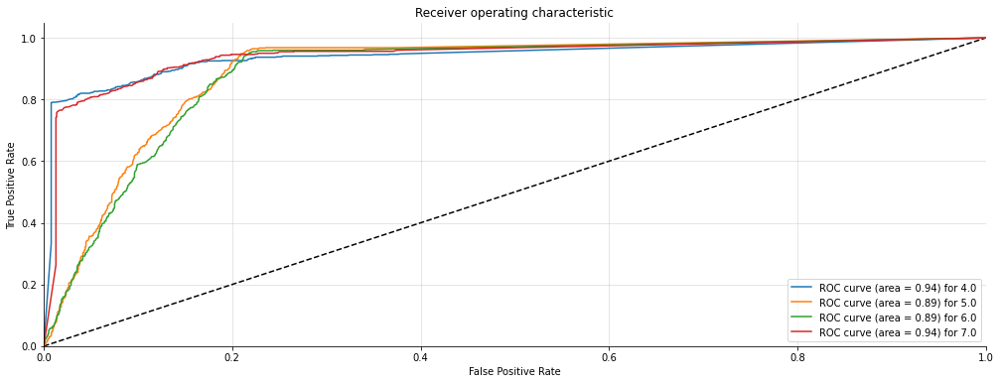

For column:  confusing<==>clear
              precision    recall  f1-score   support

         4.0       0.90      0.80      0.85       839
         5.0       0.61      0.73      0.66       863
         6.0       0.64      0.70      0.67       838
         7.0       0.93      0.77      0.84       820

    accuracy                           0.75      3360
   macro avg       0.77      0.75      0.76      3360
weighted avg       0.77      0.75      0.75      3360

Confusion Matrix: 
 [[670 169   0   0]
 [ 55 626 170  12]
 [ 12 203 588  35]
 [  8  27 155 630]]
Accuracy Score : 0.7482142857142857
Precision Score : 0.7691572780344139
Recall Score : 0.7482142857142857
F1 Score : 0.7544764495407216
(3360, 4) (3360, 4)


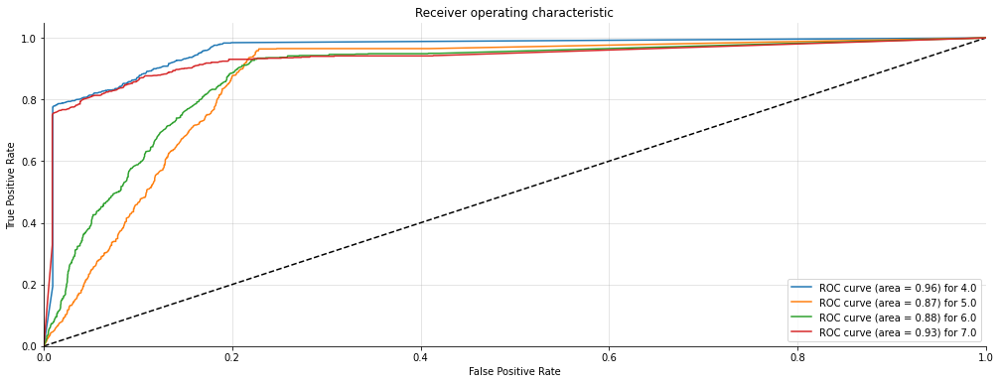

For column: boring<==>exciting
              precision    recall  f1-score   support

         3.0       0.81      0.89      0.85      1121
         4.0       0.83      0.65      0.73      1174
         5.0       0.80      0.91      0.85      1065

    accuracy                           0.81      3360
   macro avg       0.81      0.82      0.81      3360
weighted avg       0.81      0.81      0.81      3360

Confusion Matrix: 
 [[1000   93   28]
 [ 199  764  211]
 [  28   68  969]]
Accuracy Score : 0.8133928571428571
Precision Score : 0.8147509497117342
Recall Score : 0.8133928571428571
F1 Score : 0.8087871311803895
(3360, 3) (3360, 3)


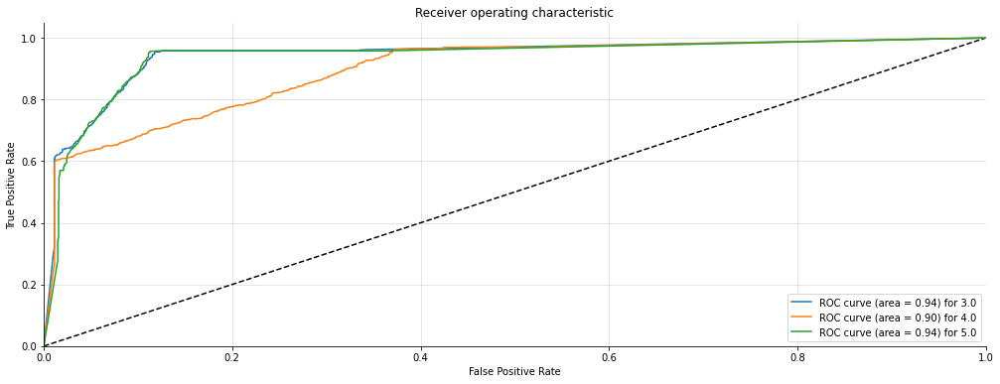

For column: not interesting<==>interesting
              precision    recall  f1-score   support

         3.0       0.90      0.80      0.85       840
         4.0       0.60      0.71      0.65       863
         5.0       0.64      0.72      0.68       838
         6.0       0.95      0.76      0.84       819

    accuracy                           0.75      3360
   macro avg       0.77      0.75      0.76      3360
weighted avg       0.77      0.75      0.75      3360

Confusion Matrix: 
 [[671 169   0   0]
 [ 57 617 174  15]
 [  8 211 601  18]
 [  9  25 162 623]]
Accuracy Score : 0.7476190476190476
Precision Score : 0.7716885128415094
Recall Score : 0.7476190476190476
F1 Score : 0.7546130506147735
(3360, 4) (3360, 4)


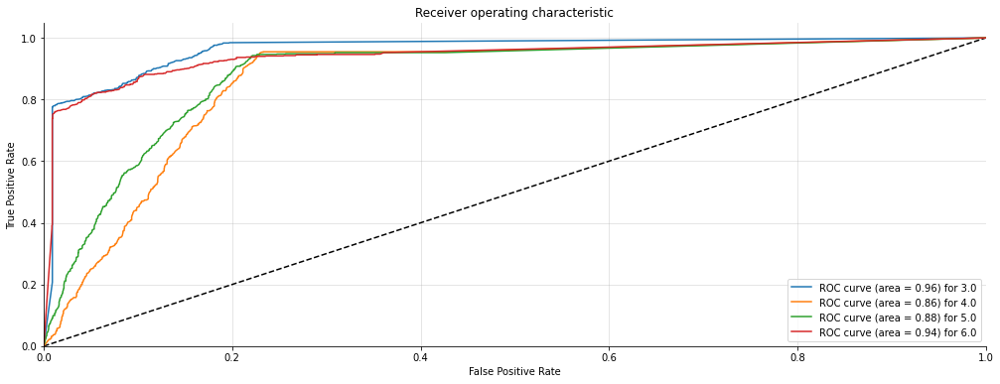

For column: conventional<==>inventive
              precision    recall  f1-score   support

         2.0       0.96      0.80      0.87       832
         3.0       0.66      0.73      0.70       881
         4.0       0.63      0.76      0.69       842
         5.0       0.92      0.78      0.84       805

    accuracy                           0.77      3360
   macro avg       0.79      0.77      0.77      3360
weighted avg       0.79      0.77      0.77      3360

Confusion Matrix: 
 [[663 142  21   6]
 [ 22 643 201  15]
 [  2 165 638  37]
 [  6  19 152 628]]
Accuracy Score : 0.7654761904761904
Precision Score : 0.7882003945247549
Recall Score : 0.7654761904761904
F1 Score : 0.7718650000236783
(3360, 4) (3360, 4)


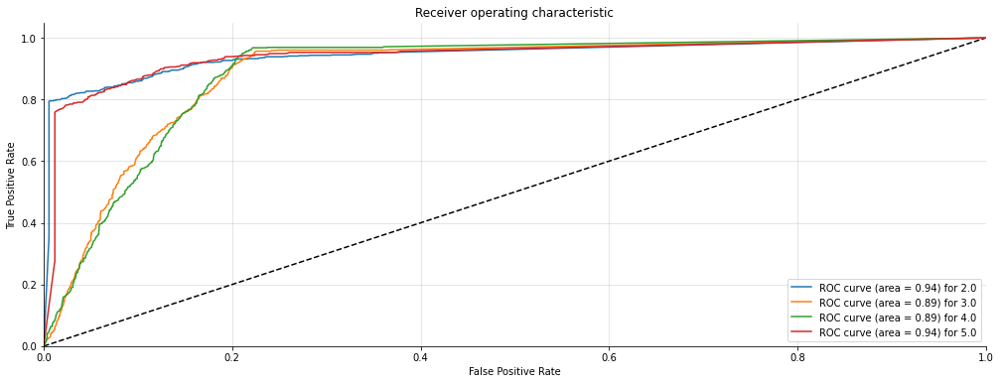

For column: usual<==>leading edge
              precision    recall  f1-score   support

         2.0       1.00      1.00      1.00       675
         3.0       1.00      1.00      1.00       677
         4.0       0.99      1.00      1.00       726
         5.0       1.00      1.00      1.00       637
         6.0       1.00      0.99      1.00       645

    accuracy                           1.00      3360
   macro avg       1.00      1.00      1.00      3360
weighted avg       1.00      1.00      1.00      3360

Confusion Matrix: 
 [[675   0   0   0   0]
 [  0 677   0   0   0]
 [  0   0 726   0   0]
 [  0   0   0 636   1]
 [  0   0   5   0 640]]
Accuracy Score : 0.9982142857142857
Precision Score : 0.9982226069871405
Recall Score : 0.9982142857142857
F1 Score : 0.9982139450118394
(3360, 5) (3360, 5)


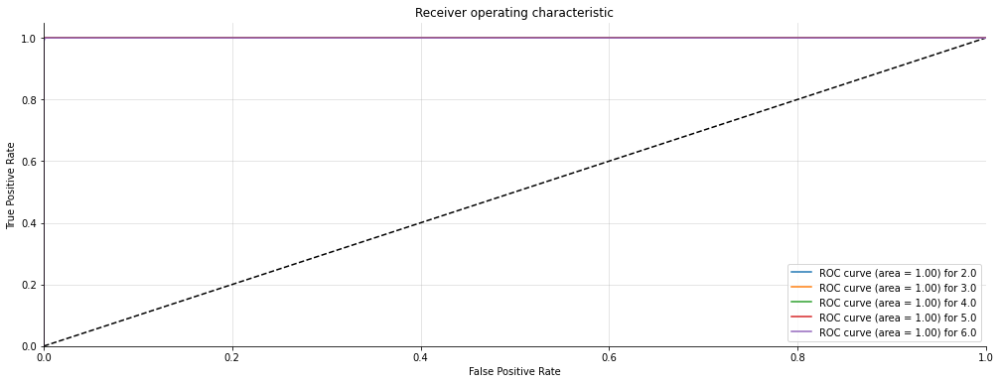

In [97]:
from sklearn.metrics import confusion_matrix,f1_score, precision_score, recall_score, classification_report
from sklearn.metrics import plot_confusion_matrix, accuracy_score
acc=[]
pre=[]
recal=[]
f1=[]
rms=[]
aucscore=[]
fpo=dict()
tpo=dict()
ffpo=[]
ttpo=[]
def RFC(X_train, X_test, y_train, y_test, n_classes, figsize=(8, 6)):
    model = RandomForestClassifier(n_estimators=100, max_depth=None,
     min_samples_split=2, random_state=0)   
    model.fit(X_train, y_train)

    # predictions over test set
    predictions = [round(float(x)) for x in model.predict(X_test)]
    print((classification_report(y_test, predictions)))


    # calculating Accuracy Score, Precision Score, Recall Score and F1 Score
    print('Confusion Matrix: \n' ,confusion_matrix(y_test, predictions))
    acc.append(accuracy_score(y_test, predictions))
    print(f'Accuracy Score : {accuracy_score(y_test, predictions)}')
    pre.append(precision_score(y_test,predictions,average='weighted'))
    print('Precision Score : ' + str(precision_score(y_test,predictions,average='weighted')))
    recal.append(recall_score(y_test,predictions,average='weighted'))
    print('Recall Score : ' + str(recall_score(y_test,predictions,average='weighted')))
    f1.append(f1_score(y_test,predictions,average='weighted'))
    print('F1 Score : ' + str(f1_score(y_test,predictions,average='weighted')))
    rms.append(np.sqrt(mean_squared_error(y_test,predictions)))
    aucscore.append(score_auc(y_test,predictions))
    fpo,tpo=plot_multiclass_roc(model, X_test, y_test, n_classes)
    ffpo.append(fpo)
    ttpo.append(tpo)

for i in range(8):
  print('For column:', df.columns[1:][i])
  n_classes = len(np.unique(df[df.columns[1:][i]]))
  RFC(X_train, X_test, y_train[:,i], y_test[:,i], n_classes, figsize=(8, 6))

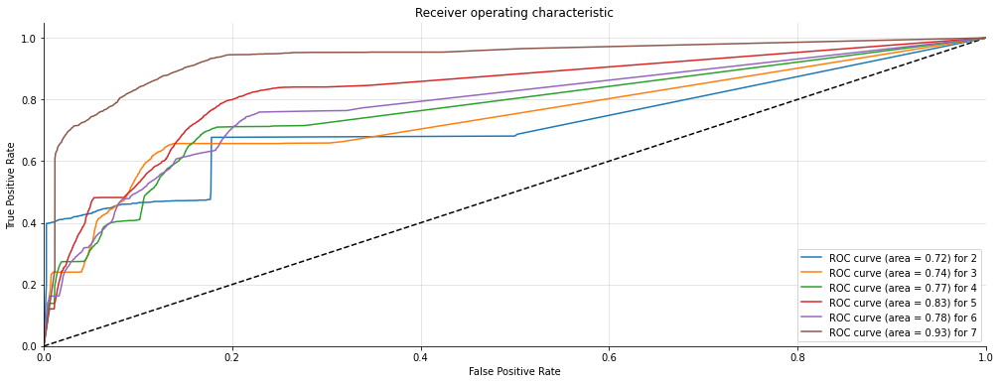

In [98]:
fsum5=list(np.array(dadd(dadd(dadd(ffpo[0][0],ffpo[1][1]),dadd(ffpo[2][1],ffpo[3][1])),dadd(dadd(ffpo[4][2],ffpo[5][2]),dadd(ffpo[6][3],ffpo[7][3]))))/8)
fsum6=list(np.array(dadd(dadd(dadd(ffpo[0][1],ffpo[1][2]),dadd(ffpo[2][2],ffpo[3][2])),dadd(dadd([0],ffpo[5][3]),dadd([0],ffpo[7][4]))))/6)
fsum7=list(np.array(dadd(dadd(dadd(ffpo[0][2],ffpo[1][3]),dadd(ffpo[2][3],ffpo[3][3])),dadd(dadd([0],[0]),dadd([0],[0]))))/4)
fsum4=list(np.array(dadd(dadd(dadd([0],ffpo[1][0]),dadd(ffpo[2][0],ffpo[3][0])),dadd(dadd(ffpo[4][1],ffpo[5][1]),dadd(ffpo[6][2],ffpo[7][2]))))/7)
fsum3=list(np.array(dadd(dadd(dadd([0],[0]),dadd([0],[0])),dadd(dadd(ffpo[4][0],ffpo[5][0]),dadd(ffpo[6][1],ffpo[7][1]))))/4)
fsum2=list(np.array(dadd(dadd(dadd([0],[0]),dadd([0],[0])),dadd(dadd([0],[0]),dadd(ffpo[6][0],ffpo[7][0]))))/2)




fpr=dict()

fsum2.sort()
fpr[0]=fsum2+[1]

fsum3.sort()
fpr[1]=fsum3+[1]

fsum4.sort()
fpr[2]=fsum4+[1]

fsum5.sort()
fpr[3]=fsum5+[1]

fsum6.sort()
fpr[4]=fsum6+[1]

fsum7.sort()
fpr[5]=fsum7+[1]











tsum5=list(np.array(dadd(dadd(dadd(ttpo[0][0],ttpo[1][1]),dadd(ttpo[2][1],ttpo[3][1])),dadd(dadd(ttpo[4][2],ttpo[5][2]),dadd(ttpo[6][3],ttpo[7][3]))))/8)
tsum6=list(np.array(dadd(dadd(dadd(ttpo[0][1],ttpo[1][2]),dadd(ttpo[2][2],ttpo[3][2])),dadd(dadd([0],ttpo[5][3]),dadd([0],ttpo[7][4]))))/6)
tsum7=list(np.array(dadd(dadd(dadd(ttpo[0][2],ttpo[1][3]),dadd(ttpo[2][3],ttpo[3][3])),dadd(dadd([0],[0]),dadd([0],[0]))))/4)
tsum4=list(np.array(dadd(dadd(dadd([0],ttpo[1][0]),dadd(ttpo[2][0],ttpo[3][0])),dadd(dadd(ttpo[4][1],ttpo[5][1]),dadd(ttpo[6][2],ttpo[7][2]))))/7)
tsum3=list(np.array(dadd(dadd(dadd([0],[0]),dadd([0],[0])),dadd(dadd(ttpo[4][0],ttpo[5][0]),dadd(ttpo[6][1],ttpo[7][1]))))/4)
tsum2=list(np.array(dadd(dadd(dadd([0],[0]),dadd([0],[0])),dadd(dadd([0],[0]),dadd(ttpo[6][0],ttpo[7][0]))))/2)


tpr=dict()

tsum2.sort()
tpr[0]=tsum2+[1]

tsum3.sort()
tpr[1]=tsum3+[1]

tsum4.sort()
tpr[2]=tsum4+[1]

tsum5.sort()
tpr[3]=tsum5+[1]

tsum6.sort()
tpr[4]=tsum6+[1]

tsum7.sort()
tpr[5]=tsum7+[1]


plot_multiclass_roc_avg(fpr,tpr,6)

In [99]:
print("average Accuracy :{}".format(np.mean(acc)))
print("average Precision :{}".format(np.mean(pre)))
print("average Recall :{}".format(np.mean(recal)))
print("average F1 -score :{}".format(np.mean(f1)))
print("average RMSE {}".format(np.mean(rms)))
print("average AUC score {}".format(np.mean(aucscore)))
metric_df['RandomForestClassifier'] = [np.mean(acc),np.mean(pre),np.mean(recal),np.mean(f1),np.mean(rms),np.mean(aucscore)]

average Accuracy :0.8019717261904762
average Precision :0.8165168486292416
average Recall :0.8019717261904762
average F1 -score :0.8049649448181503
average RMSE 0.4835685565528148
average AUC score 0.8637161434093725


# 4.7.3 Extra Trees Classifier

For column: obstructive<==>supportive
              precision    recall  f1-score   support

         5.0       0.81      0.91      0.85      1112
         6.0       0.84      0.66      0.74      1171
         7.0       0.82      0.90      0.86      1077

    accuracy                           0.82      3360
   macro avg       0.82      0.82      0.82      3360
weighted avg       0.82      0.82      0.81      3360

Confusion Matrix: 
 [[1010   72   30]
 [ 213  770  188]
 [  28   76  973]]
Accuracy Score : 0.8193452380952381
Precision Score : 0.8213855968733235
Recall Score : 0.8193452380952381
F1 Score : 0.8148618969909472
(3360, 3) (3360, 3)


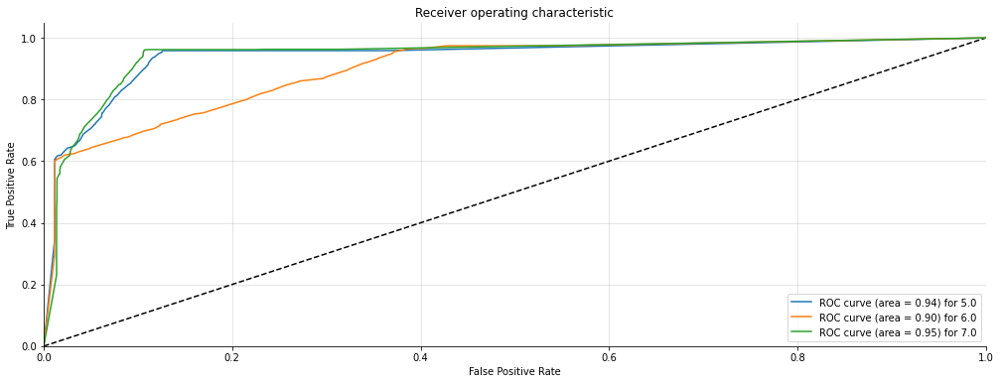

(3360, 3) (3360, 3)


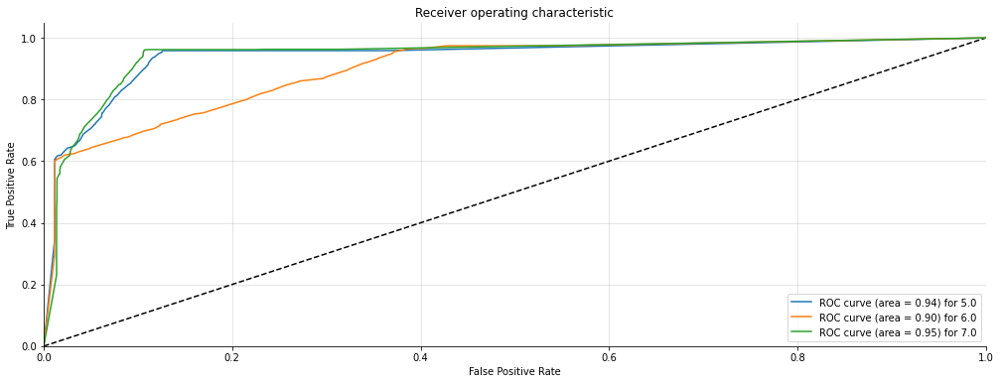

For column: complicated<==>easy
              precision    recall  f1-score   support

         4.0       0.94      0.80      0.87       834
         5.0       0.65      0.73      0.69       875
         6.0       0.63      0.73      0.67       842
         7.0       0.93      0.77      0.84       809

    accuracy                           0.76      3360
   macro avg       0.79      0.76      0.77      3360
weighted avg       0.78      0.76      0.77      3360

Confusion Matrix: 
 [[669 140  17   8]
 [ 30 643 192  10]
 [  3 192 615  32]
 [  8  18 158 625]]
Accuracy Score : 0.7595238095238095
Precision Score : 0.7823888217024539
Recall Score : 0.7595238095238095
F1 Score : 0.7661730859702275
(3360, 4) (3360, 4)


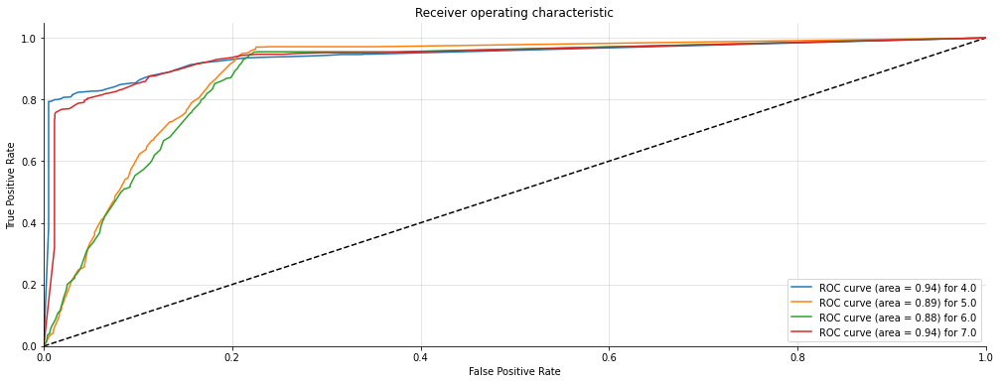

(3360, 4) (3360, 4)


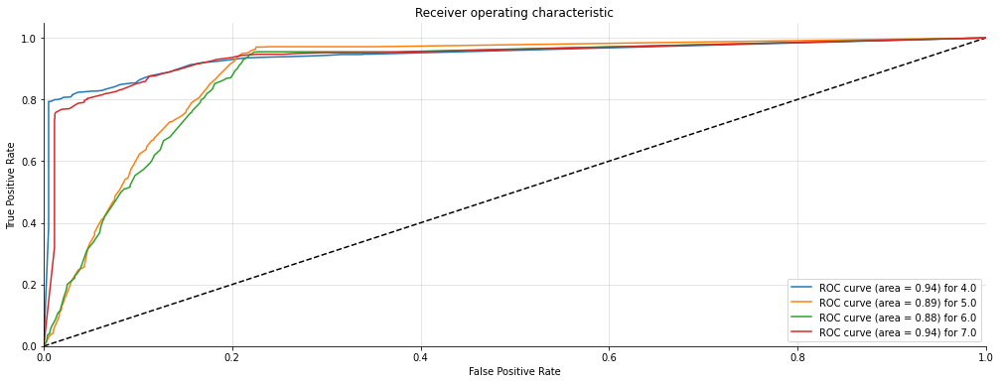

For column: inefficient<==>efficient
              precision    recall  f1-score   support

         4.0       0.93      0.80      0.86       829
         5.0       0.65      0.72      0.69       882
         6.0       0.63      0.74      0.68       847
         7.0       0.92      0.77      0.84       802

    accuracy                           0.76      3360
   macro avg       0.78      0.76      0.77      3360
weighted avg       0.78      0.76      0.76      3360

Confusion Matrix: 
 [[660 145  14  10]
 [ 32 635 205  10]
 [  6 178 627  36]
 [ 10  14 157 621]]
Accuracy Score : 0.7568452380952381
Precision Score : 0.778018195856279
Recall Score : 0.7568452380952381
F1 Score : 0.763019807556809
(3360, 4) (3360, 4)


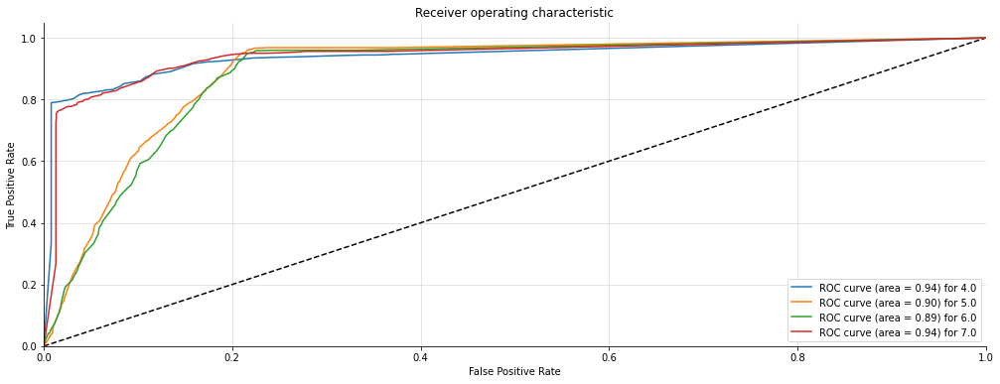

(3360, 4) (3360, 4)


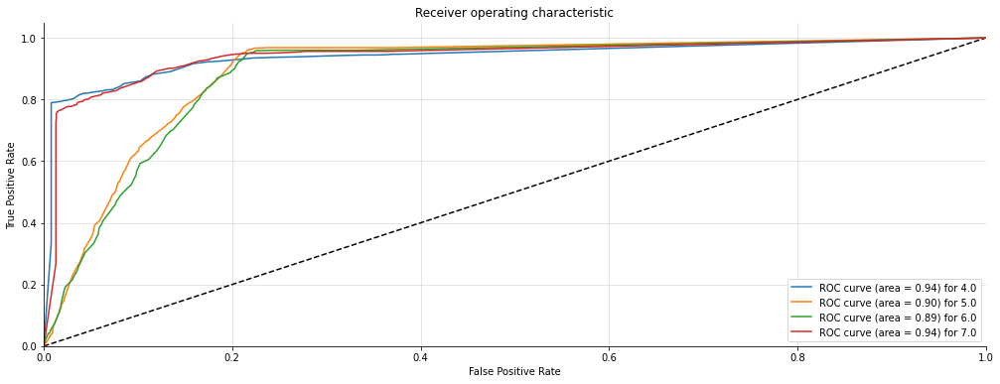

For column:  confusing<==>clear
              precision    recall  f1-score   support

         4.0       0.88      0.80      0.84       839
         5.0       0.60      0.73      0.66       863
         6.0       0.65      0.69      0.67       838
         7.0       0.94      0.76      0.84       820

    accuracy                           0.75      3360
   macro avg       0.77      0.75      0.75      3360
weighted avg       0.77      0.75      0.75      3360

Confusion Matrix: 
 [[675 164   0   0]
 [ 68 626 157  12]
 [ 12 224 576  26]
 [  8  27 158 627]]
Accuracy Score : 0.7452380952380953
Precision Score : 0.7666891208142328
Recall Score : 0.7452380952380953
F1 Score : 0.7515736185406297
(3360, 4) (3360, 4)


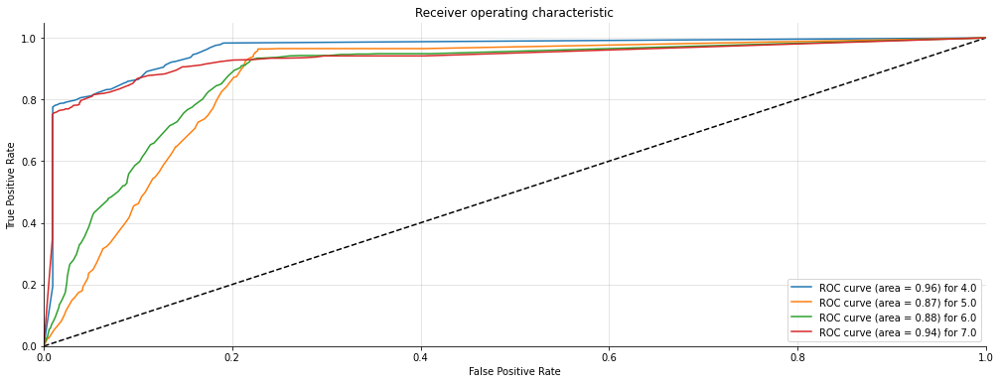

(3360, 4) (3360, 4)


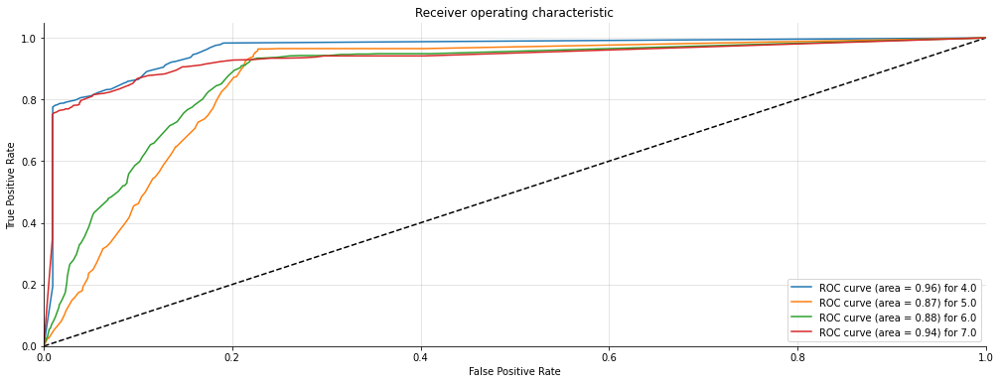

For column: boring<==>exciting
              precision    recall  f1-score   support

         3.0       0.81      0.91      0.86      1121
         4.0       0.82      0.65      0.73      1174
         5.0       0.80      0.88      0.84      1065

    accuracy                           0.81      3360
   macro avg       0.81      0.82      0.81      3360
weighted avg       0.81      0.81      0.81      3360

Confusion Matrix: 
 [[1023   71   27]
 [ 208  763  203]
 [  29   96  940]]
Accuracy Score : 0.8113095238095238
Precision Score : 0.8121938124919116
Recall Score : 0.8113095238095238
F1 Score : 0.8067268367499799
(3360, 3) (3360, 3)


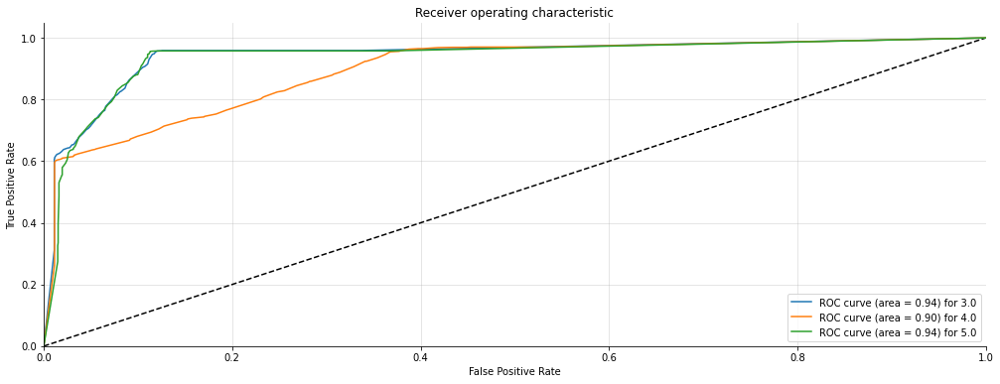

(3360, 3) (3360, 3)


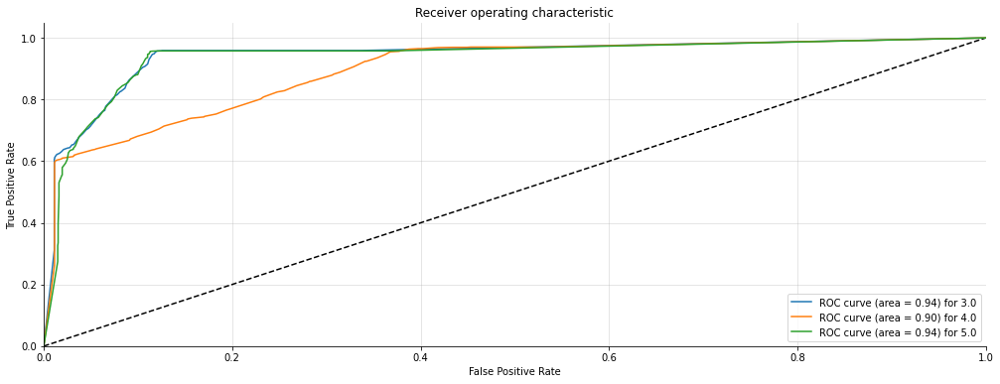

For column: not interesting<==>interesting
              precision    recall  f1-score   support

         3.0       0.89      0.80      0.84       840
         4.0       0.59      0.71      0.65       863
         5.0       0.64      0.70      0.67       838
         6.0       0.95      0.76      0.85       819

    accuracy                           0.74      3360
   macro avg       0.77      0.74      0.75      3360
weighted avg       0.77      0.74      0.75      3360

Confusion Matrix: 
 [[675 165   0   0]
 [ 70 617 161  15]
 [  8 231 584  15]
 [  9  26 162 622]]
Accuracy Score : 0.743452380952381
Precision Score : 0.7671032067118362
Recall Score : 0.743452380952381
F1 Score : 0.7503850795108116
(3360, 4) (3360, 4)


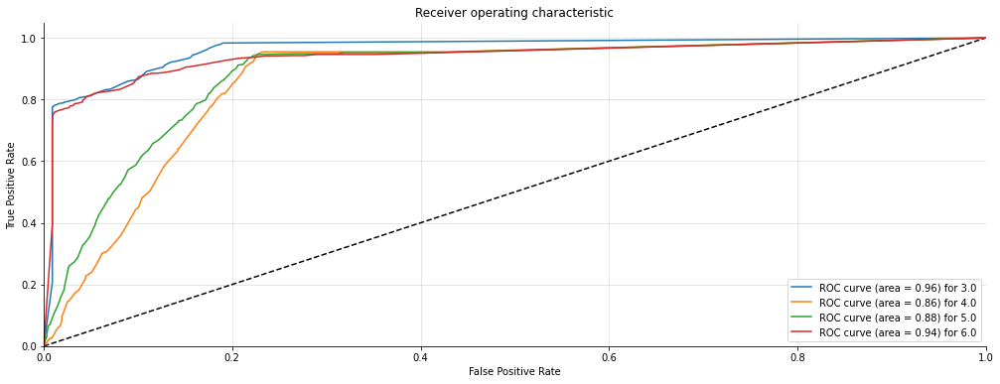

(3360, 4) (3360, 4)


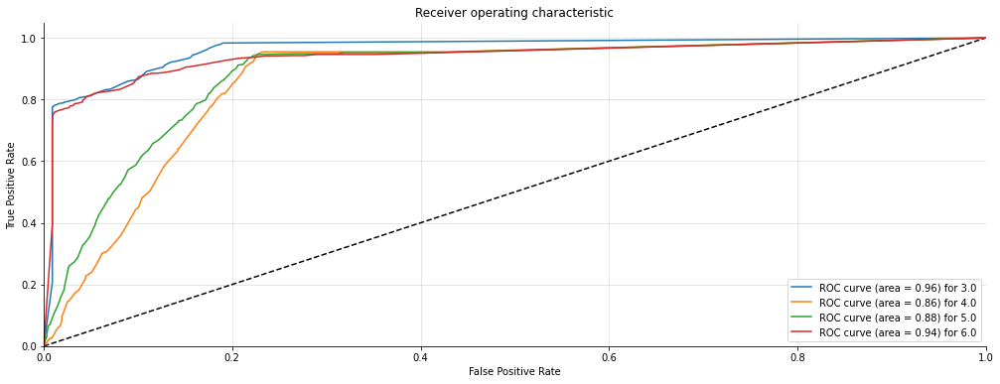

For column: conventional<==>inventive
              precision    recall  f1-score   support

         2.0       0.94      0.80      0.86       832
         3.0       0.65      0.73      0.69       881
         4.0       0.63      0.73      0.67       842
         5.0       0.92      0.78      0.84       805

    accuracy                           0.76      3360
   macro avg       0.78      0.76      0.77      3360
weighted avg       0.78      0.76      0.76      3360

Confusion Matrix: 
 [[664 141  21   6]
 [ 36 643 187  15]
 [  3 193 613  33]
 [  6  19 155 625]]
Accuracy Score : 0.7574404761904762
Precision Score : 0.7790978447104705
Recall Score : 0.7574404761904762
F1 Score : 0.7638355532372623
(3360, 4) (3360, 4)


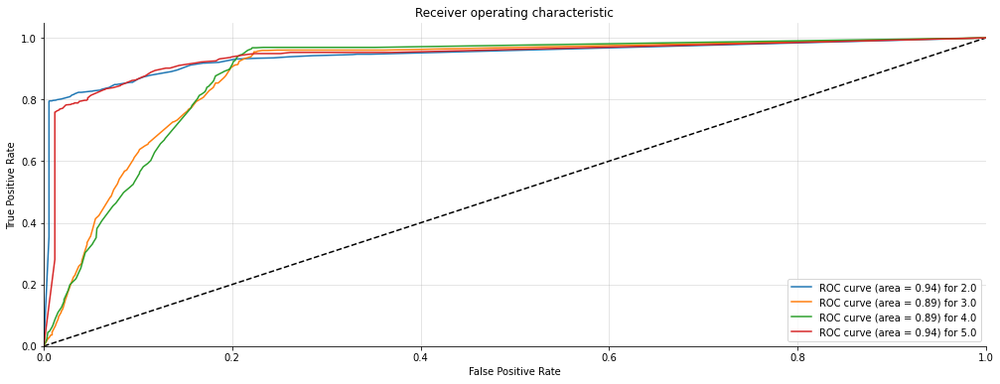

(3360, 4) (3360, 4)


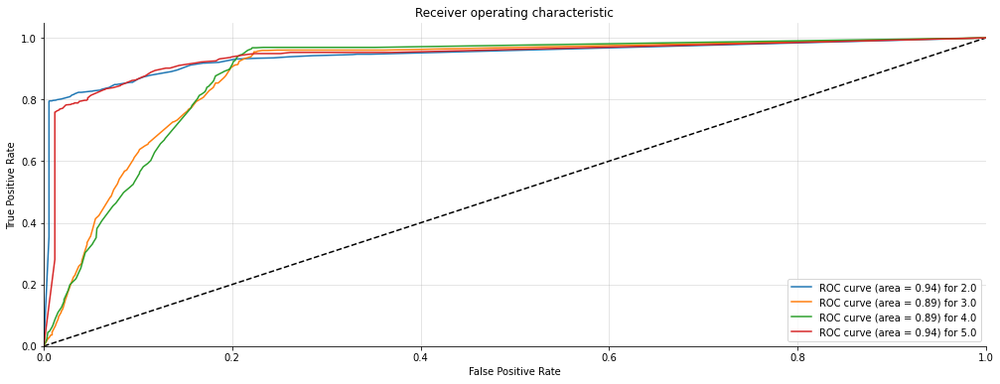

For column: usual<==>leading edge
              precision    recall  f1-score   support

         2.0       1.00      1.00      1.00       675
         3.0       1.00      1.00      1.00       677
         4.0       0.99      1.00      1.00       726
         5.0       1.00      1.00      1.00       637
         6.0       1.00      0.99      1.00       645

    accuracy                           1.00      3360
   macro avg       1.00      1.00      1.00      3360
weighted avg       1.00      1.00      1.00      3360

Confusion Matrix: 
 [[675   0   0   0   0]
 [  0 677   0   0   0]
 [  0   0 726   0   0]
 [  0   0   0 636   1]
 [  0   0   5   0 640]]
Accuracy Score : 0.9982142857142857
Precision Score : 0.9982226069871405
Recall Score : 0.9982142857142857
F1 Score : 0.9982139450118394
(3360, 5) (3360, 5)


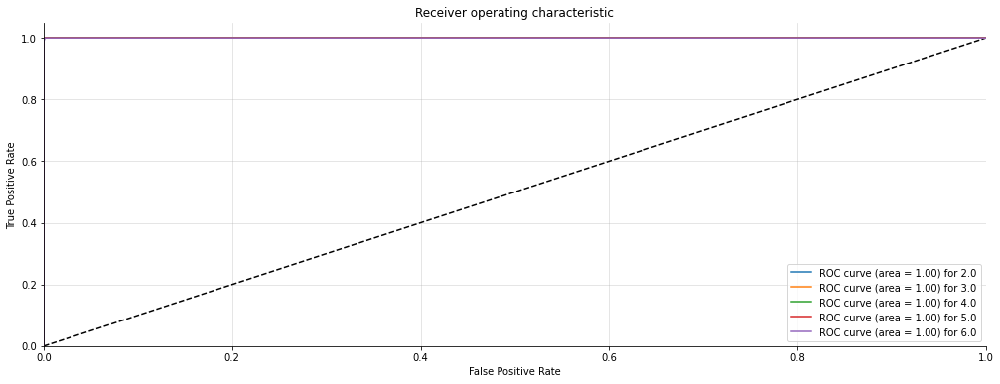

(3360, 5) (3360, 5)


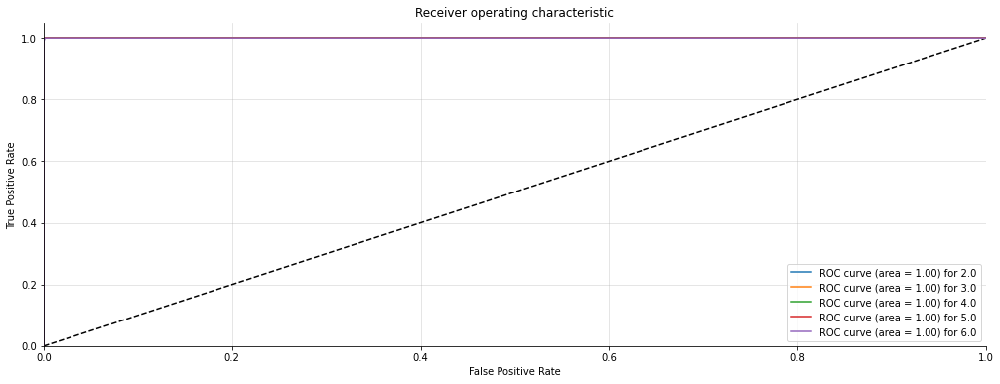

In [100]:
from sklearn.metrics import confusion_matrix,f1_score, precision_score, recall_score, classification_report
from sklearn.metrics import plot_confusion_matrix, accuracy_score
acc=[]
pre=[]
recal=[]
f1=[]
rms=[]
aucscore=[]
fpo=dict()
tpo=dict()
ffpo=[]
ttpo=[]
def ETC(X_train, X_test, y_train, y_test, n_classes, figsize=(8, 6)):
    model = ExtraTreesClassifier(n_estimators=100, max_depth=None,
     min_samples_split=2, random_state=0)   
    model.fit(X_train, y_train)

    # predictions over test set
    predictions = [round(float(x)) for x in model.predict(X_test)]
    print((classification_report(y_test, predictions)))


    # calculating Accuracy Score, Precision Score, Recall Score and F1 Score
    print('Confusion Matrix: \n' ,confusion_matrix(y_test, predictions))
    acc.append(accuracy_score(y_test, predictions))
    print(f'Accuracy Score : {accuracy_score(y_test, predictions)}')
    pre.append(precision_score(y_test,predictions,average='weighted'))
    print('Precision Score : ' + str(precision_score(y_test,predictions,average='weighted')))
    recal.append(recall_score(y_test,predictions,average='weighted'))
    print('Recall Score : ' + str(recall_score(y_test,predictions,average='weighted')))
    f1.append(f1_score(y_test,predictions,average='weighted'))
    print('F1 Score : ' + str(f1_score(y_test,predictions,average='weighted')))
    rms.append(np.sqrt(mean_squared_error(y_test,predictions)))
    aucscore.append(score_auc(y_test,predictions))
    fpo,tpo=plot_multiclass_roc(model, X_test, y_test, n_classes)
    ffpo.append(fpo)
    ttpo.append(tpo)
    plot_multiclass_roc(model, X_test, y_test, n_classes)

for i in range(8):
  print('For column:', df.columns[1:][i])
  n_classes = len(np.unique(df[df.columns[1:][i]]))
  ETC(X_train, X_test, y_train[:,i], y_test[:,i], n_classes, figsize=(8, 6))

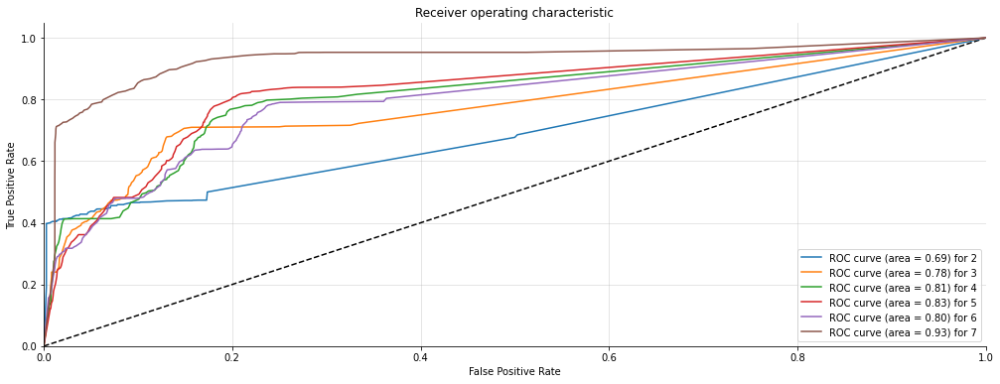

In [101]:
fsum5=list(np.array(dadd(dadd(dadd(ffpo[0][0],ffpo[1][1]),dadd(ffpo[2][1],ffpo[3][1])),dadd(dadd(ffpo[4][2],ffpo[5][2]),dadd(ffpo[6][3],ffpo[7][3]))))/8)
fsum6=list(np.array(dadd(dadd(dadd(ffpo[0][1],ffpo[1][2]),dadd(ffpo[2][2],ffpo[3][2])),dadd(dadd([0],ffpo[5][3]),dadd([0],ffpo[7][4]))))/6)
fsum7=list(np.array(dadd(dadd(dadd(ffpo[0][2],ffpo[1][3]),dadd(ffpo[2][3],ffpo[3][3])),dadd(dadd([0],[0]),dadd([0],[0]))))/4)
fsum4=list(np.array(dadd(dadd(dadd([0],ffpo[1][0]),dadd(ffpo[2][0],ffpo[3][0])),dadd(dadd(ffpo[4][1],ffpo[5][1]),dadd(ffpo[6][2],ffpo[7][2]))))/7)
fsum3=list(np.array(dadd(dadd(dadd([0],[0]),dadd([0],[0])),dadd(dadd(ffpo[4][0],ffpo[5][0]),dadd(ffpo[6][1],ffpo[7][1]))))/4)
fsum2=list(np.array(dadd(dadd(dadd([0],[0]),dadd([0],[0])),dadd(dadd([0],[0]),dadd(ffpo[6][0],ffpo[7][0]))))/2)




fpr=dict()

fsum2.sort()
fpr[0]=fsum2+[1]

fsum3.sort()
fpr[1]=fsum3+[1]

fsum4.sort()
fpr[2]=fsum4+[1]

fsum5.sort()
fpr[3]=fsum5+[1]

fsum6.sort()
fpr[4]=fsum6+[1]

fsum7.sort()
fpr[5]=fsum7+[1]











tsum5=list(np.array(dadd(dadd(dadd(ttpo[0][0],ttpo[1][1]),dadd(ttpo[2][1],ttpo[3][1])),dadd(dadd(ttpo[4][2],ttpo[5][2]),dadd(ttpo[6][3],ttpo[7][3]))))/8)
tsum6=list(np.array(dadd(dadd(dadd(ttpo[0][1],ttpo[1][2]),dadd(ttpo[2][2],ttpo[3][2])),dadd(dadd([0],ttpo[5][3]),dadd([0],ttpo[7][4]))))/6)
tsum7=list(np.array(dadd(dadd(dadd(ttpo[0][2],ttpo[1][3]),dadd(ttpo[2][3],ttpo[3][3])),dadd(dadd([0],[0]),dadd([0],[0]))))/4)
tsum4=list(np.array(dadd(dadd(dadd([0],ttpo[1][0]),dadd(ttpo[2][0],ttpo[3][0])),dadd(dadd(ttpo[4][1],ttpo[5][1]),dadd(ttpo[6][2],ttpo[7][2]))))/7)
tsum3=list(np.array(dadd(dadd(dadd([0],[0]),dadd([0],[0])),dadd(dadd(ttpo[4][0],ttpo[5][0]),dadd(ttpo[6][1],ttpo[7][1]))))/4)
tsum2=list(np.array(dadd(dadd(dadd([0],[0]),dadd([0],[0])),dadd(dadd([0],[0]),dadd(ttpo[6][0],ttpo[7][0]))))/2)


tpr=dict()

tsum2.sort()
tpr[0]=tsum2+[1]

tsum3.sort()
tpr[1]=tsum3+[1]

tsum4.sort()
tpr[2]=tsum4+[1]

tsum5.sort()
tpr[3]=tsum5+[1]

tsum6.sort()
tpr[4]=tsum6+[1]

tsum7.sort()
tpr[5]=tsum7+[1]


plot_multiclass_roc_avg(fpr,tpr,6)

In [102]:
print("average Accuracy :{}".format(np.mean(acc)))
print("average Precision :{}".format(np.mean(pre)))
print("average Recall :{}".format(np.mean(recal)))
print("average F1 -score :{}".format(np.mean(f1)))
print("average RMSE {}".format(np.mean(rms)))
print("average AUC score {}".format(np.mean(aucscore)))
metric_df['ExtraTreesClassifier'] = [np.mean(acc),np.mean(pre),np.mean(recal),np.mean(f1),np.mean(rms),np.mean(aucscore)]

average Accuracy :0.7989211309523809
average Precision :0.813137400768456
average Recall :0.7989211309523809
average F1 -score :0.8018487279460633
average RMSE 0.48647065205330237
average AUC score 0.8616371075120781


# 4.7.4 Adaboost 

For column: obstructive<==>supportive
              precision    recall  f1-score   support

         5.0       0.75      0.78      0.76      1112
         6.0       0.61      0.61      0.61      1171
         7.0       0.69      0.66      0.67      1077

    accuracy                           0.68      3360
   macro avg       0.68      0.68      0.68      3360
weighted avg       0.68      0.68      0.68      3360

Confusion Matrix: 
 [[863 172  77]
 [215 713 243]
 [ 78 293 706]]
Accuracy Score : 0.6791666666666667
Precision Score : 0.6785740994884366
Recall Score : 0.6791666666666667
F1 Score : 0.6786470288723208
(3360, 3) (3360, 3)


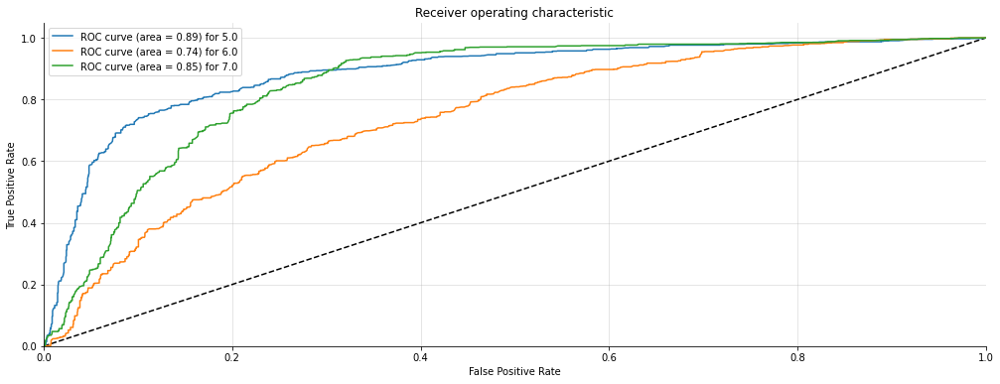

(3360, 3) (3360, 3)


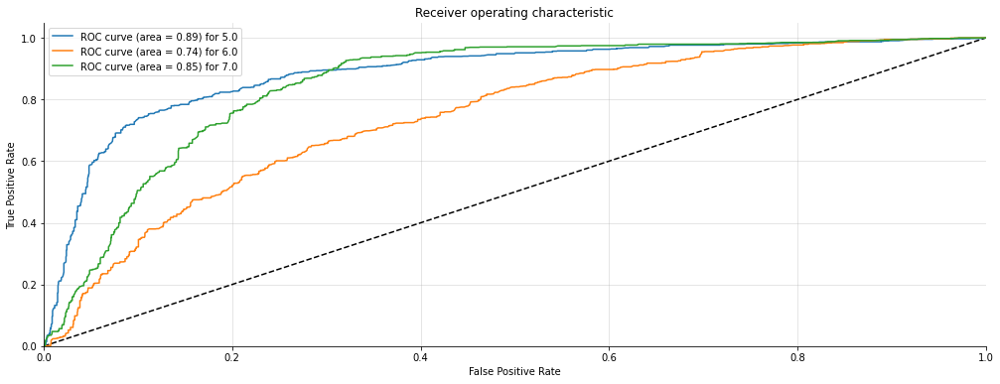

For column: complicated<==>easy
              precision    recall  f1-score   support

         4.0       0.76      0.77      0.76       834
         5.0       0.49      0.51      0.50       875
         6.0       0.49      0.50      0.49       842
         7.0       0.61      0.57      0.59       809

    accuracy                           0.58      3360
   macro avg       0.59      0.58      0.59      3360
weighted avg       0.58      0.58      0.58      3360

Confusion Matrix: 
 [[641 120  30  43]
 [124 443 221  87]
 [ 37 223 417 165]
 [ 41 121 187 460]]
Accuracy Score : 0.5836309523809524
Precision Score : 0.5848474247154902
Recall Score : 0.5836309523809524
F1 Score : 0.5840156886755514
(3360, 4) (3360, 4)


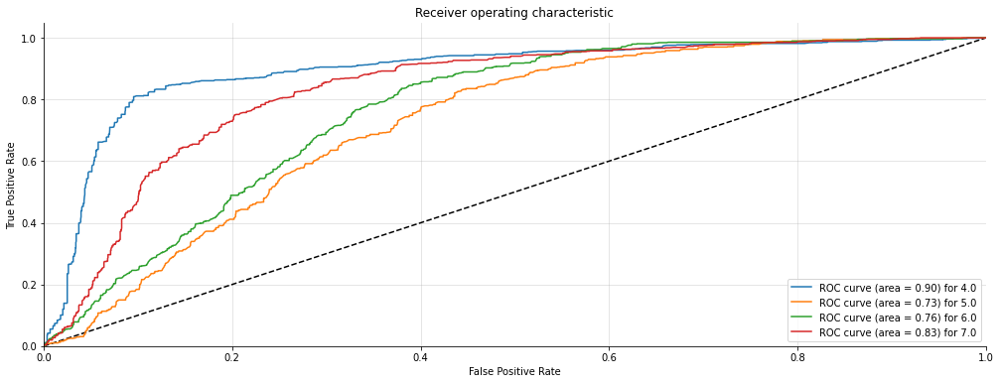

(3360, 4) (3360, 4)


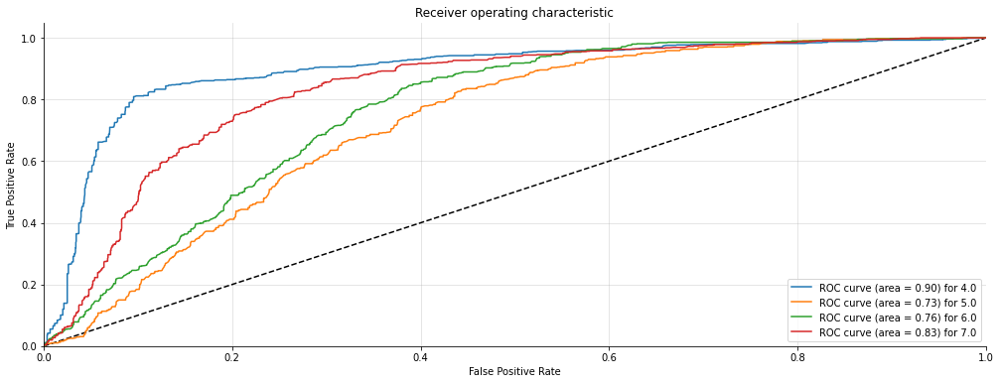

For column: inefficient<==>efficient
              precision    recall  f1-score   support

         4.0       0.78      0.79      0.78       829
         5.0       0.52      0.51      0.52       882
         6.0       0.52      0.55      0.53       847
         7.0       0.59      0.55      0.57       802

    accuracy                           0.60      3360
   macro avg       0.60      0.60      0.60      3360
weighted avg       0.60      0.60      0.60      3360

Confusion Matrix: 
 [[653 111  27  38]
 [107 450 212 113]
 [ 43 181 465 158]
 [ 38 122 198 444]]
Accuracy Score : 0.5988095238095238
Precision Score : 0.5989869918306133
Recall Score : 0.5988095238095238
F1 Score : 0.5986057485011911
(3360, 4) (3360, 4)


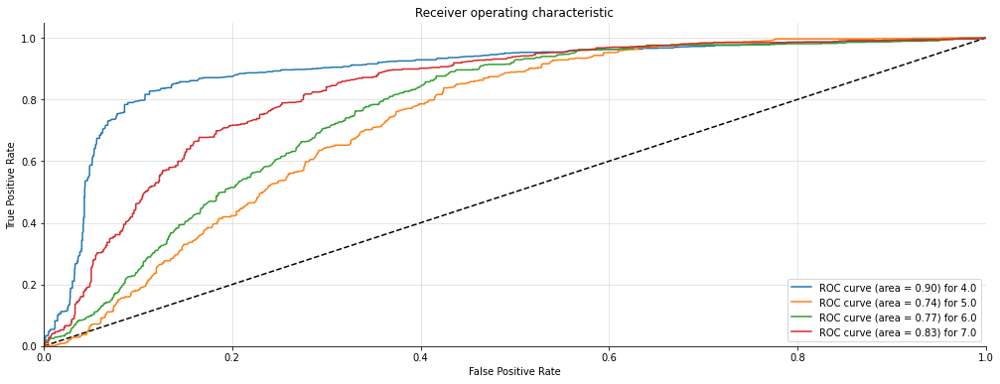

(3360, 4) (3360, 4)


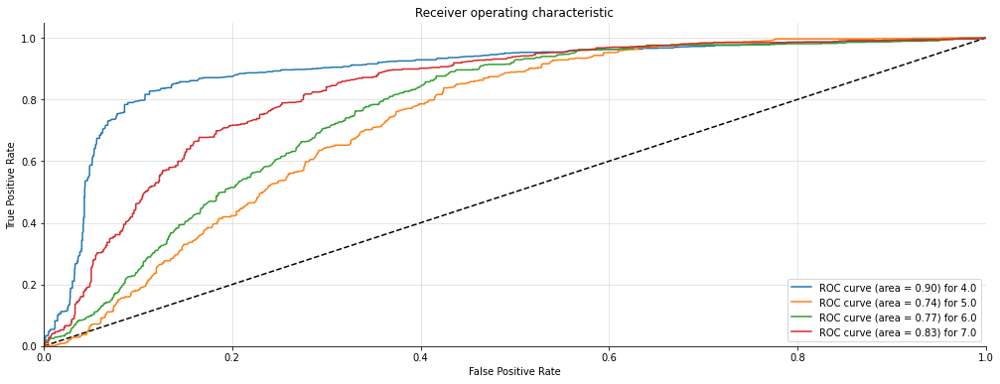

For column:  confusing<==>clear
              precision    recall  f1-score   support

         4.0       0.80      0.79      0.79       839
         5.0       0.50      0.56      0.53       863
         6.0       0.48      0.50      0.49       838
         7.0       0.58      0.51      0.54       820

    accuracy                           0.59      3360
   macro avg       0.59      0.59      0.59      3360
weighted avg       0.59      0.59      0.59      3360

Confusion Matrix: 
 [[659 121  30  29]
 [100 479 185  99]
 [ 29 217 416 176]
 [ 33 134 234 419]]
Accuracy Score : 0.587202380952381
Precision Score : 0.5911767195419445
Recall Score : 0.587202380952381
F1 Score : 0.5882897512960494
(3360, 4) (3360, 4)


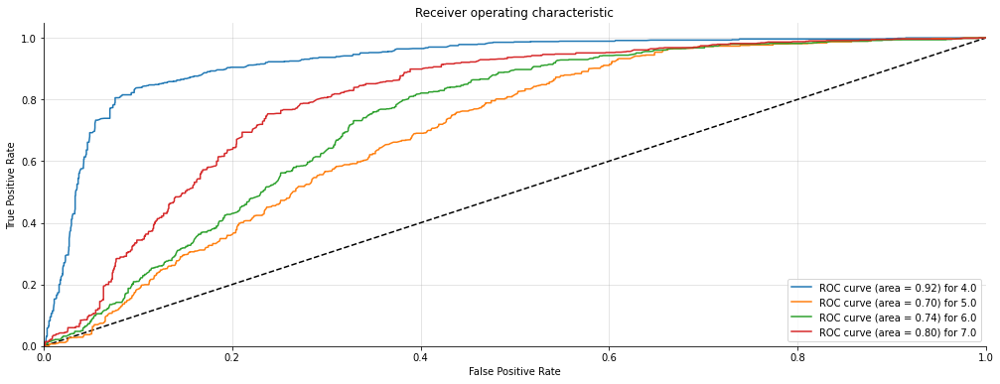

(3360, 4) (3360, 4)


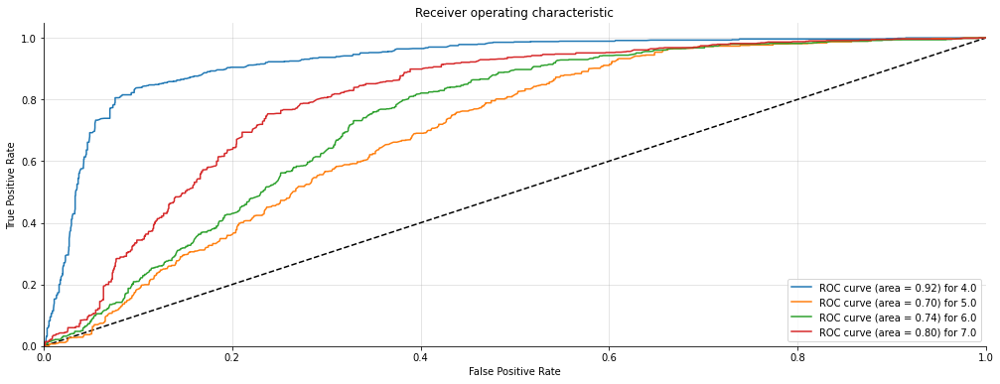

For column: boring<==>exciting
              precision    recall  f1-score   support

         3.0       0.77      0.78      0.77      1121
         4.0       0.64      0.62      0.63      1174
         5.0       0.69      0.71      0.70      1065

    accuracy                           0.70      3360
   macro avg       0.70      0.70      0.70      3360
weighted avg       0.70      0.70      0.70      3360

Confusion Matrix: 
 [[871 172  78]
 [188 723 263]
 [ 72 242 751]]
Accuracy Score : 0.6979166666666666
Precision Score : 0.6971005576611664
Recall Score : 0.6979166666666666
F1 Score : 0.6974128806340107
(3360, 3) (3360, 3)


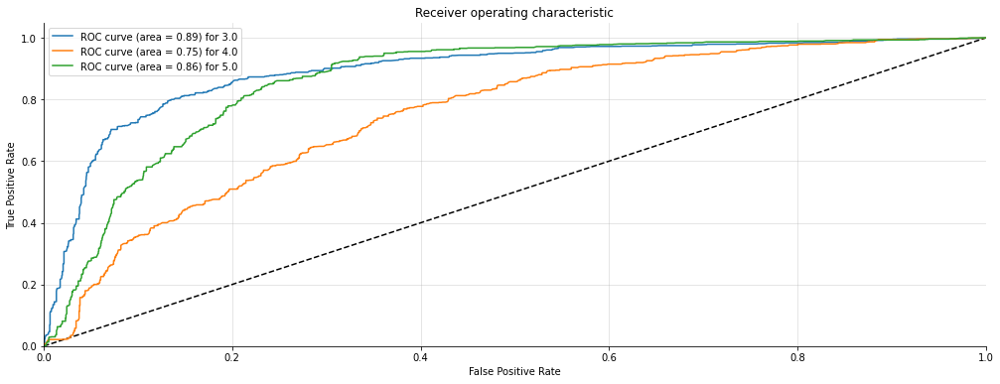

(3360, 3) (3360, 3)


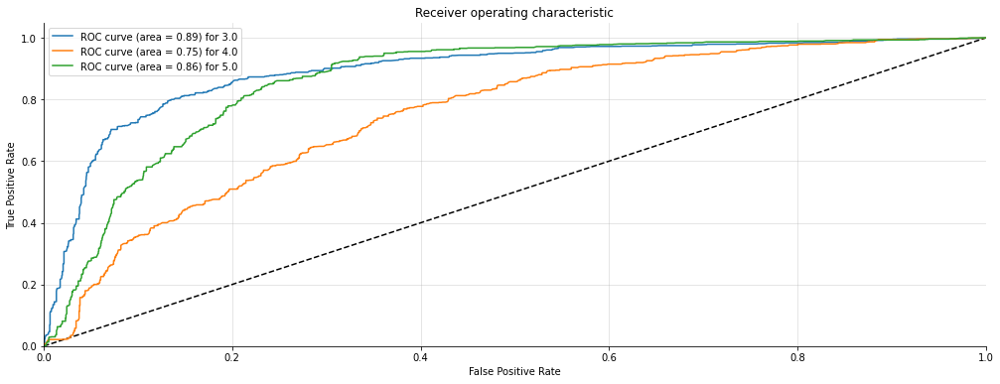

For column: not interesting<==>interesting
              precision    recall  f1-score   support

         3.0       0.79      0.75      0.77       840
         4.0       0.47      0.52      0.49       863
         5.0       0.46      0.50      0.48       838
         6.0       0.60      0.51      0.55       819

    accuracy                           0.57      3360
   macro avg       0.58      0.57      0.57      3360
weighted avg       0.58      0.57      0.57      3360

Confusion Matrix: 
 [[627 142  44  27]
 [104 453 226  80]
 [ 25 227 420 166]
 [ 37 152 216 414]]
Accuracy Score : 0.5696428571428571
Precision Score : 0.579630603691982
Recall Score : 0.5696428571428571
F1 Score : 0.5727929426560561
(3360, 4) (3360, 4)


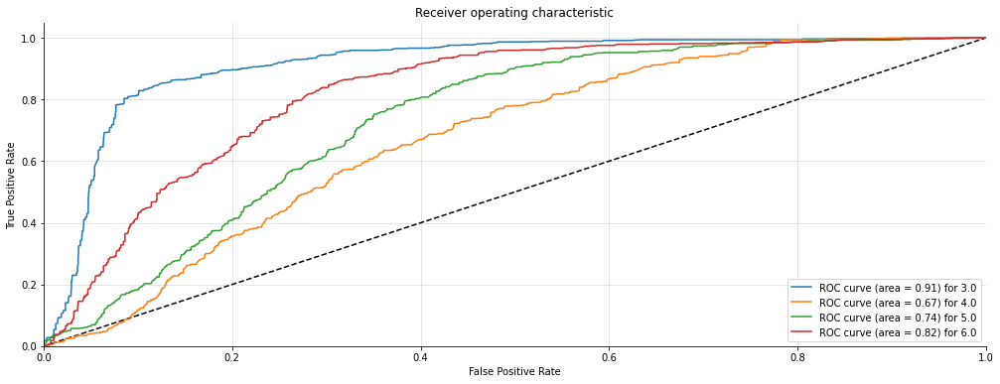

(3360, 4) (3360, 4)


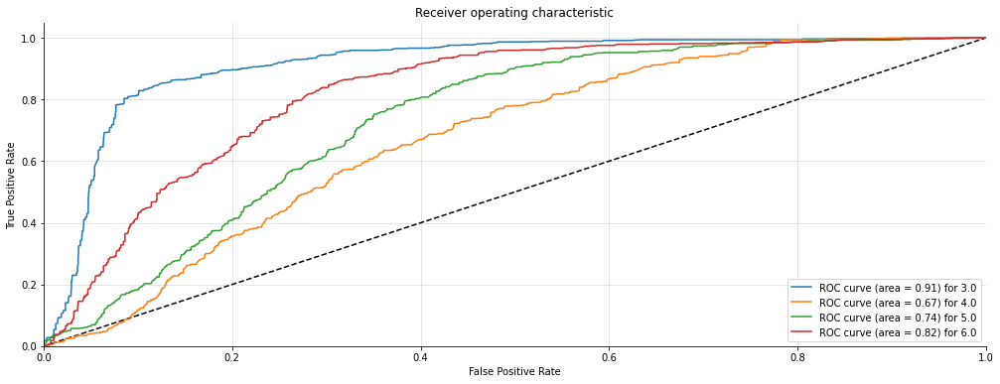

For column: conventional<==>inventive
              precision    recall  f1-score   support

         2.0       0.76      0.79      0.77       832
         3.0       0.53      0.51      0.52       881
         4.0       0.52      0.57      0.55       842
         5.0       0.62      0.57      0.59       805

    accuracy                           0.61      3360
   macro avg       0.61      0.61      0.61      3360
weighted avg       0.61      0.61      0.61      3360

Confusion Matrix: 
 [[658 113  28  33]
 [126 447 208 100]
 [ 27 192 482 141]
 [ 59  87 204 455]]
Accuracy Score : 0.6077380952380952
Precision Score : 0.6075146206568247
Recall Score : 0.6077380952380952
F1 Score : 0.6068175972941072
(3360, 4) (3360, 4)


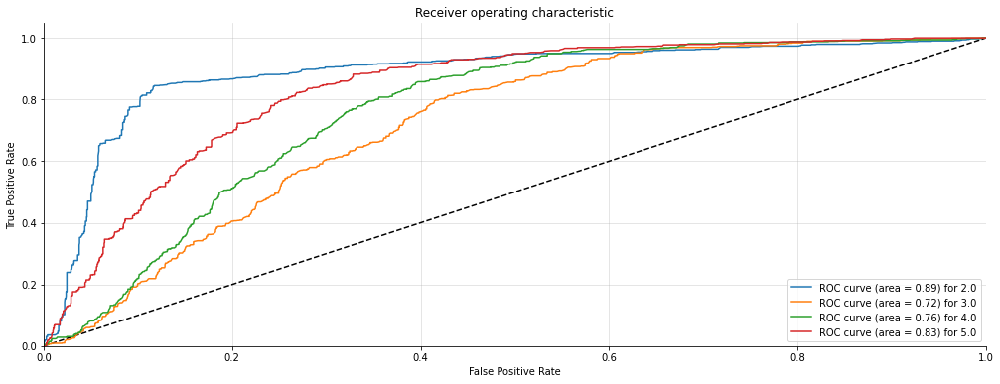

(3360, 4) (3360, 4)


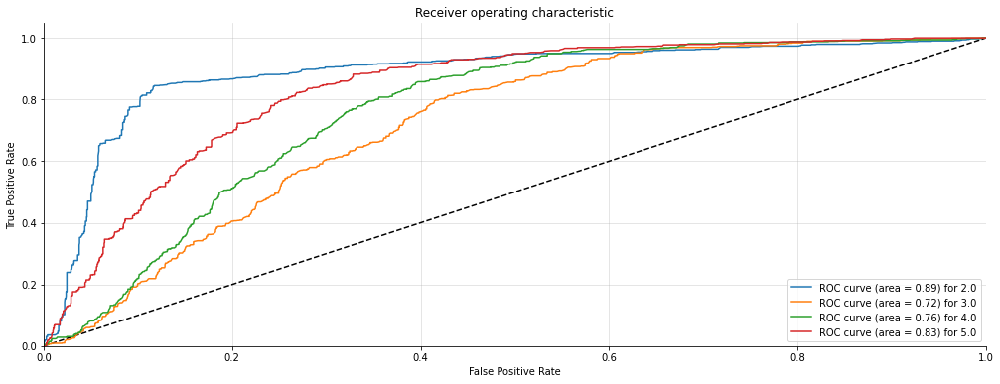

For column: usual<==>leading edge
              precision    recall  f1-score   support

         2.0       0.79      0.71      0.75       675
         3.0       0.43      0.47      0.45       677
         4.0       0.52      0.44      0.47       726
         5.0       0.43      0.42      0.42       637
         6.0       0.42      0.51      0.46       645

    accuracy                           0.51      3360
   macro avg       0.52      0.51      0.51      3360
weighted avg       0.52      0.51      0.51      3360

Confusion Matrix: 
 [[482  95  23  33  42]
 [ 50 316  89  98 124]
 [ 27 133 318 126 122]
 [ 31  96  81 266 163]
 [ 24  93 106  94 328]]
Accuracy Score : 0.5089285714285714
Precision Score : 0.5184891983565588
Recall Score : 0.5089285714285714
F1 Score : 0.5117399444203103
(3360, 5) (3360, 5)


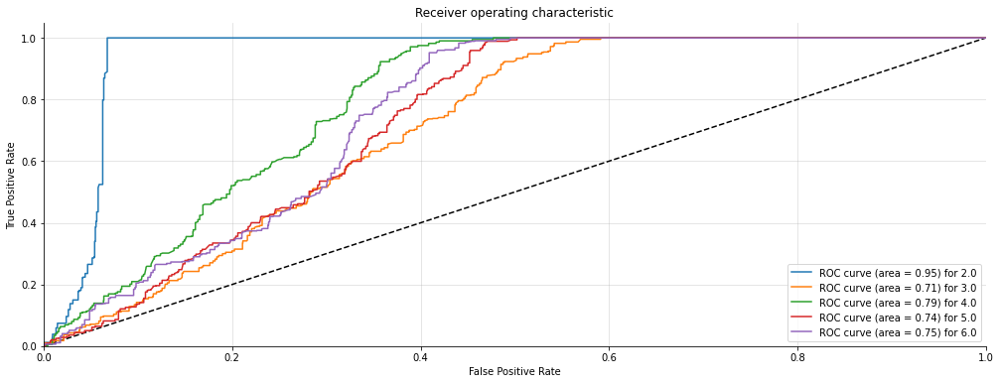

(3360, 5) (3360, 5)


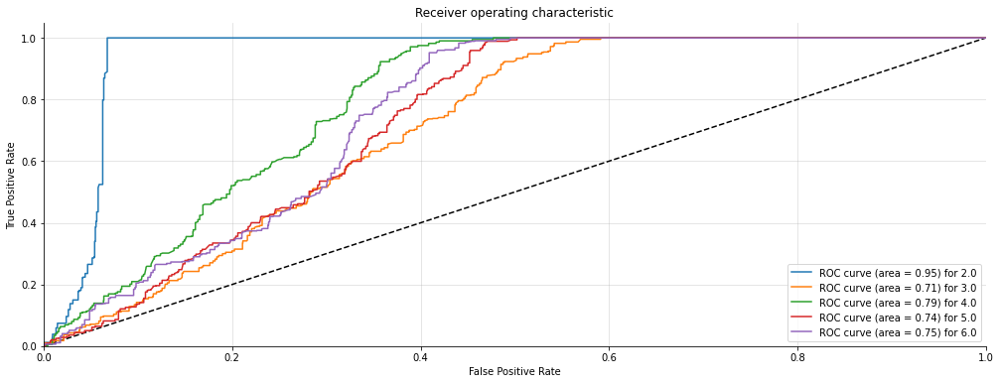

In [103]:
from sklearn.metrics import confusion_matrix,f1_score, precision_score, recall_score, classification_report
from sklearn.metrics import plot_confusion_matrix, accuracy_score
acc=[]
pre=[]
recal=[]
f1=[]
rms=[]
aucscore=[]
fpo=dict()
tpo=dict()
ffpo=[]
ttpo=[]
def ADB(X_train, X_test, y_train, y_test, n_classes, figsize=(8, 6)):
    model = AdaBoostClassifier(n_estimators=500)   
    model.fit(X_train, y_train)

    # predictions over test set
    predictions = [round(float(x)) for x in model.predict(X_test)]
    print((classification_report(y_test, predictions)))


    # calculating Accuracy Score, Precision Score, Recall Score and F1 Score
    print('Confusion Matrix: \n' ,confusion_matrix(y_test, predictions))
    acc.append(accuracy_score(y_test, predictions))
    print(f'Accuracy Score : {accuracy_score(y_test, predictions)}')
    pre.append(precision_score(y_test,predictions,average='weighted'))
    print('Precision Score : ' + str(precision_score(y_test,predictions,average='weighted')))
    recal.append(recall_score(y_test,predictions,average='weighted'))
    print('Recall Score : ' + str(recall_score(y_test,predictions,average='weighted')))
    f1.append(f1_score(y_test,predictions,average='weighted'))
    print('F1 Score : ' + str(f1_score(y_test,predictions,average='weighted')))
    rms.append(np.sqrt(mean_squared_error(y_test,predictions)))
    aucscore.append(score_auc(y_test,predictions))
    fpo,tpo=plot_multiclass_roc(model, X_test, y_test, n_classes)
    ffpo.append(fpo)
    ttpo.append(tpo)
    plot_multiclass_roc(model, X_test, y_test, n_classes)

for i in range(8):
  print('For column:', df.columns[1:][i])
  n_classes = len(np.unique(df[df.columns[1:][i]]))
  ADB(X_train, X_test, y_train[:,i], y_test[:,i], n_classes, figsize=(8, 6))

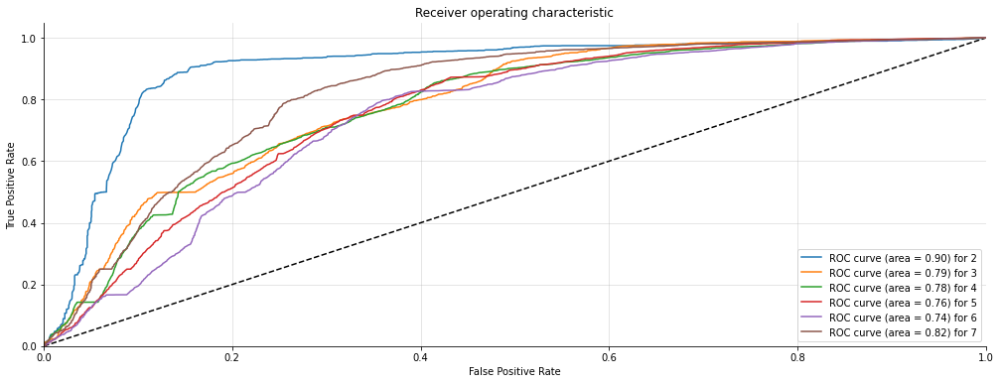

In [104]:
fsum5=list(np.array(dadd(dadd(dadd(ffpo[0][0],ffpo[1][1]),dadd(ffpo[2][1],ffpo[3][1])),dadd(dadd(ffpo[4][2],ffpo[5][2]),dadd(ffpo[6][3],ffpo[7][3]))))/8)
fsum6=list(np.array(dadd(dadd(dadd(ffpo[0][1],ffpo[1][2]),dadd(ffpo[2][2],ffpo[3][2])),dadd(dadd([0],ffpo[5][3]),dadd([0],ffpo[7][4]))))/6)
fsum7=list(np.array(dadd(dadd(dadd(ffpo[0][2],ffpo[1][3]),dadd(ffpo[2][3],ffpo[3][3])),dadd(dadd([0],[0]),dadd([0],[0]))))/4)
fsum4=list(np.array(dadd(dadd(dadd([0],ffpo[1][0]),dadd(ffpo[2][0],ffpo[3][0])),dadd(dadd(ffpo[4][1],ffpo[5][1]),dadd(ffpo[6][2],ffpo[7][2]))))/7)
fsum3=list(np.array(dadd(dadd(dadd([0],[0]),dadd([0],[0])),dadd(dadd(ffpo[4][0],ffpo[5][0]),dadd(ffpo[6][1],ffpo[7][1]))))/4)
fsum2=list(np.array(dadd(dadd(dadd([0],[0]),dadd([0],[0])),dadd(dadd([0],[0]),dadd(ffpo[6][0],ffpo[7][0]))))/2)




fpr=dict()

fsum2.sort()
fpr[0]=fsum2+[1]

fsum3.sort()
fpr[1]=fsum3+[1]

fsum4.sort()
fpr[2]=fsum4+[1]

fsum5.sort()
fpr[3]=fsum5+[1]

fsum6.sort()
fpr[4]=fsum6+[1]

fsum7.sort()
fpr[5]=fsum7+[1]











tsum5=list(np.array(dadd(dadd(dadd(ttpo[0][0],ttpo[1][1]),dadd(ttpo[2][1],ttpo[3][1])),dadd(dadd(ttpo[4][2],ttpo[5][2]),dadd(ttpo[6][3],ttpo[7][3]))))/8)
tsum6=list(np.array(dadd(dadd(dadd(ttpo[0][1],ttpo[1][2]),dadd(ttpo[2][2],ttpo[3][2])),dadd(dadd([0],ttpo[5][3]),dadd([0],ttpo[7][4]))))/6)
tsum7=list(np.array(dadd(dadd(dadd(ttpo[0][2],ttpo[1][3]),dadd(ttpo[2][3],ttpo[3][3])),dadd(dadd([0],[0]),dadd([0],[0]))))/4)
tsum4=list(np.array(dadd(dadd(dadd([0],ttpo[1][0]),dadd(ttpo[2][0],ttpo[3][0])),dadd(dadd(ttpo[4][1],ttpo[5][1]),dadd(ttpo[6][2],ttpo[7][2]))))/7)
tsum3=list(np.array(dadd(dadd(dadd([0],[0]),dadd([0],[0])),dadd(dadd(ttpo[4][0],ttpo[5][0]),dadd(ttpo[6][1],ttpo[7][1]))))/4)
tsum2=list(np.array(dadd(dadd(dadd([0],[0]),dadd([0],[0])),dadd(dadd([0],[0]),dadd(ttpo[6][0],ttpo[7][0]))))/2)


tpr=dict()

tsum2.sort()
tpr[0]=tsum2+[1]

tsum3.sort()
tpr[1]=tsum3+[1]

tsum4.sort()
tpr[2]=tsum4+[1]

tsum5.sort()
tpr[3]=tsum5+[1]

tsum6.sort()
tpr[4]=tsum6+[1]

tsum7.sort()
tpr[5]=tsum7+[1]


plot_multiclass_roc_avg(fpr,tpr,6)

In [105]:
print("average Accuracy :{}".format(np.mean(acc)))
print("average Precision :{}".format(np.mean(pre)))
print("average Recall :{}".format(np.mean(recal)))
print("average F1 -score :{}".format(np.mean(f1)))
print("average RMSE {}".format(np.mean(rms)))
print("average AUC score {}".format(np.mean(aucscore)))
metric_df['AdaBoost'] = [np.mean(acc),np.mean(pre),np.mean(recal),np.mean(f1),np.mean(rms),np.mean(aucscore)]

average Accuracy :0.6041294642857142
average Precision :0.6070400269928771
average Recall :0.6041294642857142
average F1 -score :0.6047901977936996
average RMSE 0.9123755818217706
average AUC score 0.7317435408681029


# 4.7.5 Gradient boosting 

For column: obstructive<==>supportive
              precision    recall  f1-score   support

         5.0       0.69      0.75      0.72      1112
         6.0       0.66      0.61      0.63      1171
         7.0       0.66      0.65      0.65      1077

    accuracy                           0.67      3360
   macro avg       0.67      0.67      0.67      3360
weighted avg       0.67      0.67      0.67      3360

Confusion Matrix: 
 [[831 153 128]
 [216 714 241]
 [155 218 704]]
Accuracy Score : 0.669345238095238
Precision Score : 0.6684513893068833
Recall Score : 0.669345238095238
F1 Score : 0.6682164272848289
(3360, 3) (3360, 3)


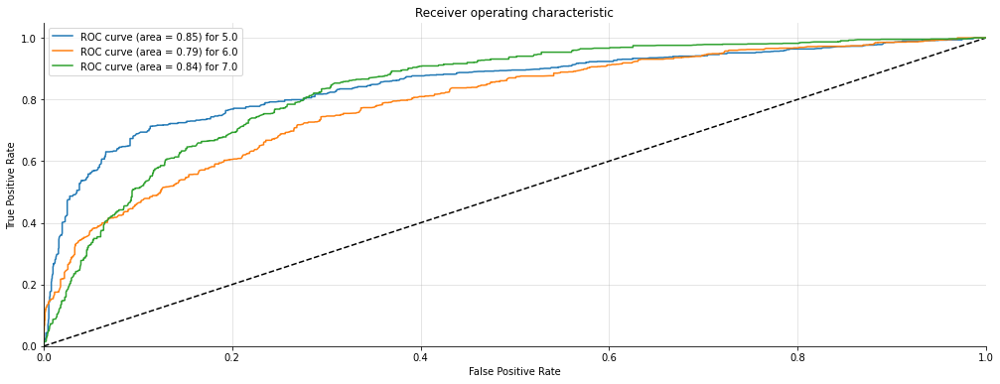

(3360, 3) (3360, 3)


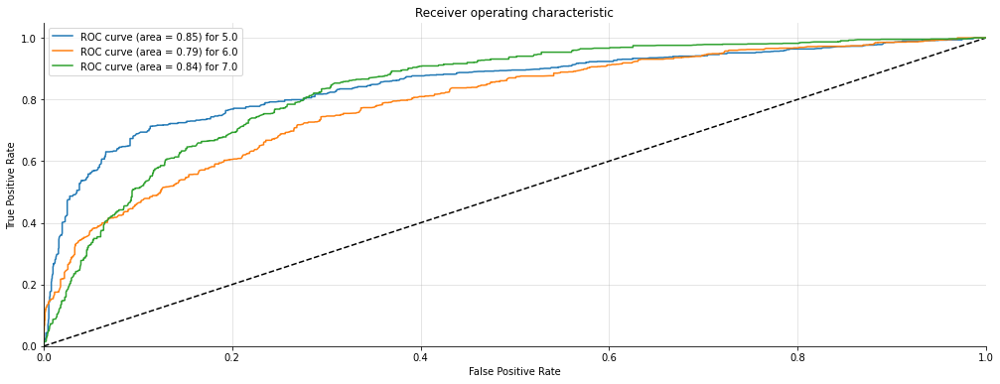

For column: complicated<==>easy
              precision    recall  f1-score   support

         4.0       0.71      0.81      0.76       834
         5.0       0.52      0.49      0.51       875
         6.0       0.51      0.48      0.50       842
         7.0       0.62      0.60      0.61       809

    accuracy                           0.60      3360
   macro avg       0.59      0.60      0.59      3360
weighted avg       0.59      0.60      0.59      3360

Confusion Matrix: 
 [[679  93  39  23]
 [135 433 196 111]
 [ 68 208 408 158]
 [ 75  96 154 484]]
Accuracy Score : 0.5964285714285714
Precision Score : 0.5904241582779636
Recall Score : 0.5964285714285714
F1 Score : 0.592284400513166
(3360, 4) (3360, 4)


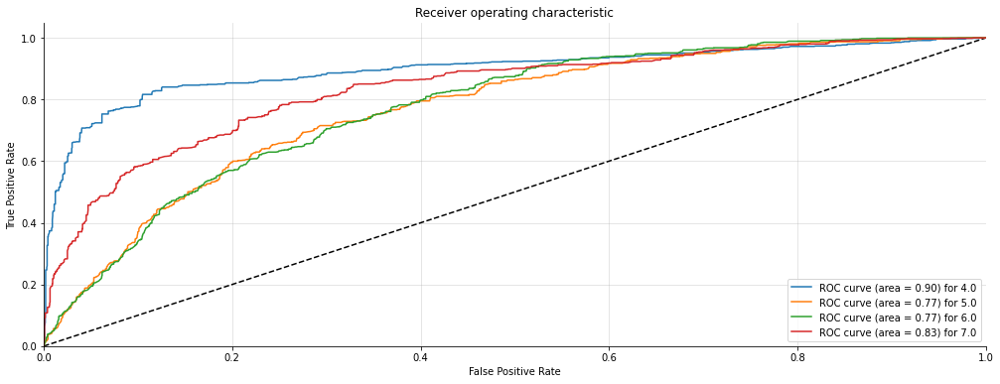

(3360, 4) (3360, 4)


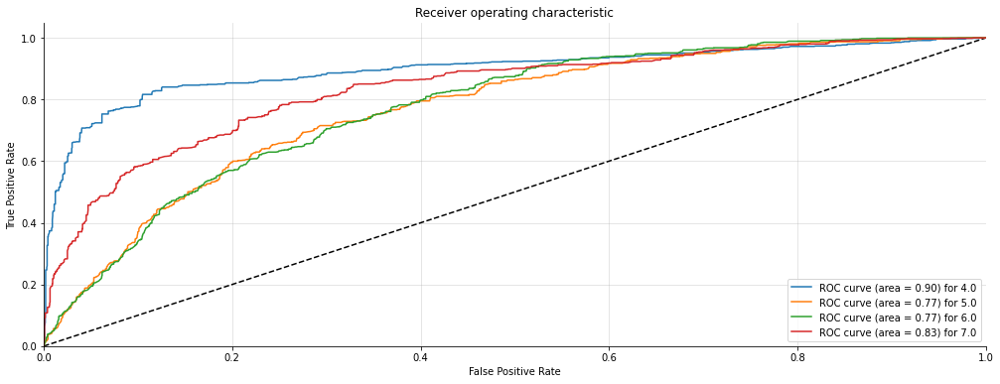

For column: inefficient<==>efficient
              precision    recall  f1-score   support

         4.0       0.74      0.82      0.78       829
         5.0       0.53      0.46      0.50       882
         6.0       0.51      0.56      0.53       847
         7.0       0.63      0.58      0.60       802

    accuracy                           0.60      3360
   macro avg       0.60      0.61      0.60      3360
weighted avg       0.60      0.60      0.60      3360

Confusion Matrix: 
 [[678  87  36  28]
 [138 410 227 107]
 [ 48 190 476 133]
 [ 55  85 200 462]]
Accuracy Score : 0.6029761904761904
Precision Score : 0.6002832457498104
Recall Score : 0.6029761904761904
F1 Score : 0.5998666550610767
(3360, 4) (3360, 4)


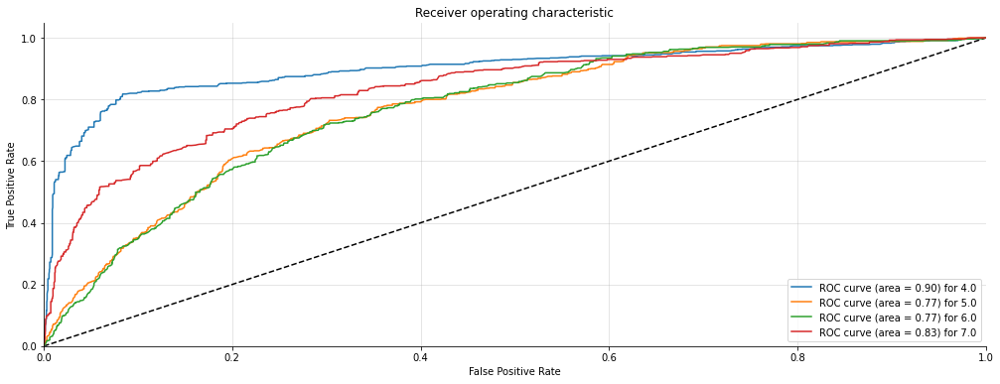

(3360, 4) (3360, 4)


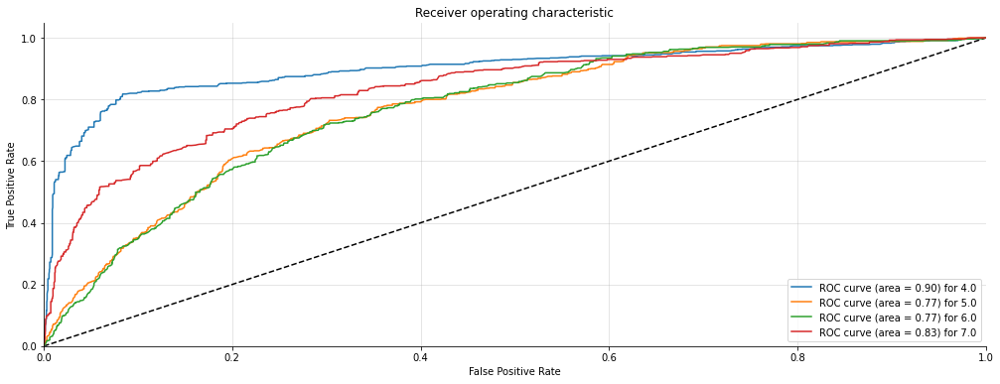

For column:  confusing<==>clear
              precision    recall  f1-score   support

         4.0       0.71      0.80      0.75       839
         5.0       0.50      0.49      0.49       863
         6.0       0.52      0.49      0.50       838
         7.0       0.63      0.58      0.60       820

    accuracy                           0.59      3360
   macro avg       0.59      0.59      0.59      3360
weighted avg       0.59      0.59      0.59      3360

Confusion Matrix: 
 [[670 102  24  43]
 [147 425 188 103]
 [ 66 222 411 139]
 [ 67 106 169 478]]
Accuracy Score : 0.5904761904761905
Precision Score : 0.5860930514977257
Recall Score : 0.5904761904761905
F1 Score : 0.5872674797659684
(3360, 4) (3360, 4)


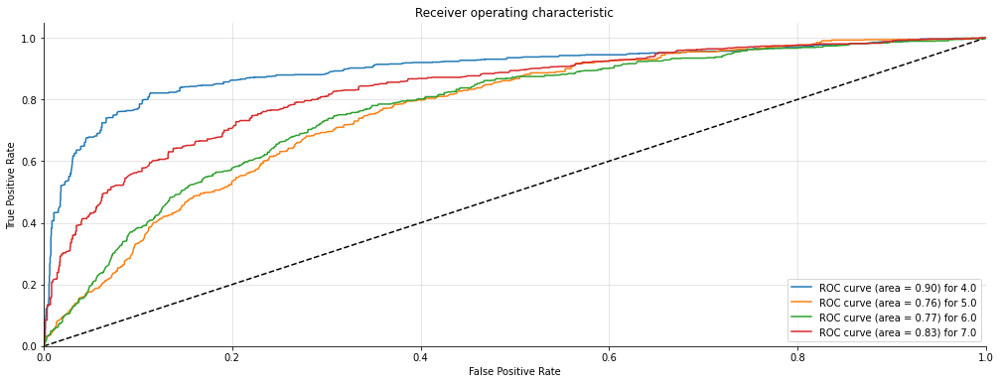

(3360, 4) (3360, 4)


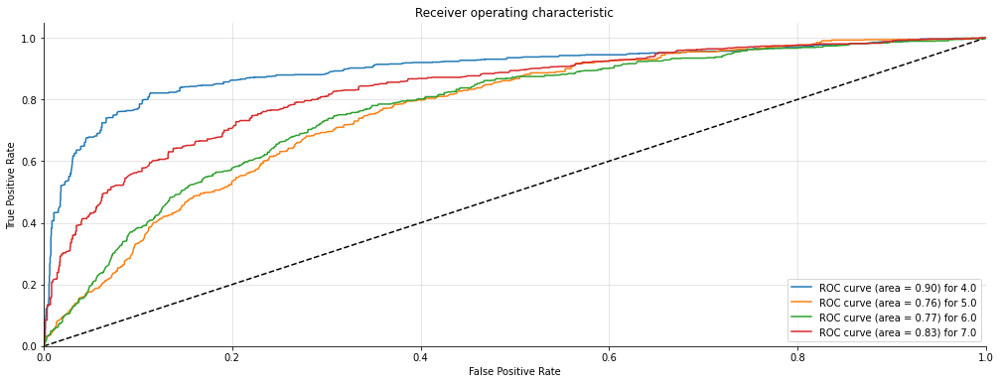

For column: boring<==>exciting
              precision    recall  f1-score   support

         3.0       0.69      0.74      0.71      1121
         4.0       0.64      0.58      0.61      1174
         5.0       0.62      0.63      0.62      1065

    accuracy                           0.65      3360
   macro avg       0.65      0.65      0.65      3360
weighted avg       0.65      0.65      0.65      3360

Confusion Matrix: 
 [[833 142 146]
 [227 679 268]
 [156 243 666]]
Accuracy Score : 0.6482142857142857
Precision Score : 0.6469848938753132
Recall Score : 0.6482142857142857
F1 Score : 0.6466828620640823
(3360, 3) (3360, 3)


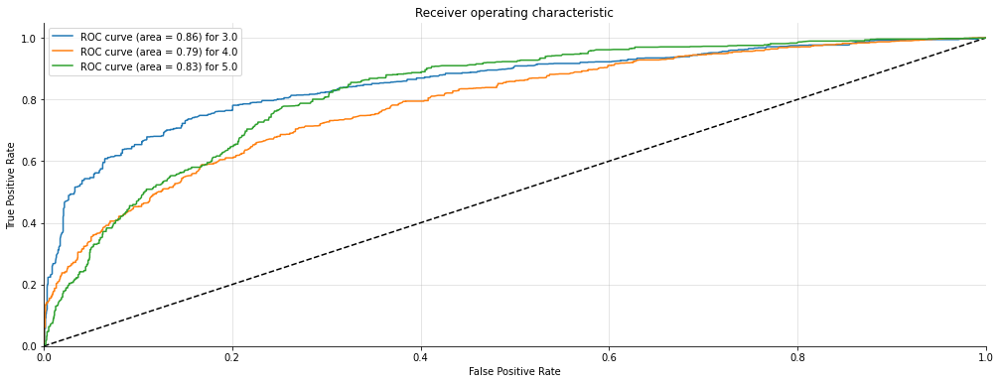

(3360, 3) (3360, 3)


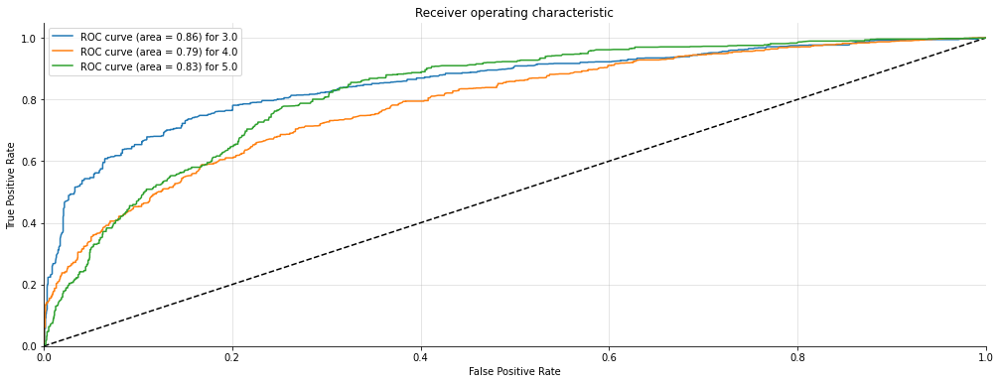

For column: not interesting<==>interesting
              precision    recall  f1-score   support

         3.0       0.69      0.81      0.75       840
         4.0       0.50      0.46      0.48       863
         5.0       0.54      0.50      0.52       838
         6.0       0.63      0.62      0.62       819

    accuracy                           0.60      3360
   macro avg       0.59      0.60      0.59      3360
weighted avg       0.59      0.60      0.59      3360

Confusion Matrix: 
 [[679 107  31  23]
 [151 397 180 135]
 [ 77 198 423 140]
 [ 71  90 151 507]]
Accuracy Score : 0.5970238095238095
Precision Score : 0.5902251361568047
Recall Score : 0.5970238095238095
F1 Score : 0.5921649298086167
(3360, 4) (3360, 4)


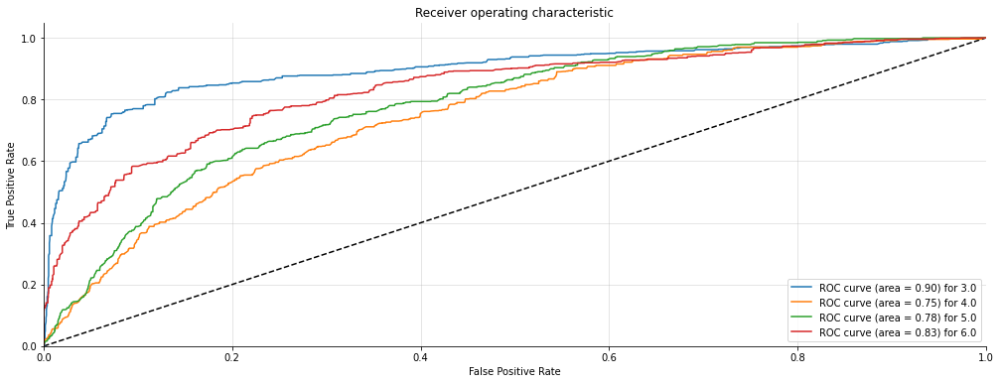

(3360, 4) (3360, 4)


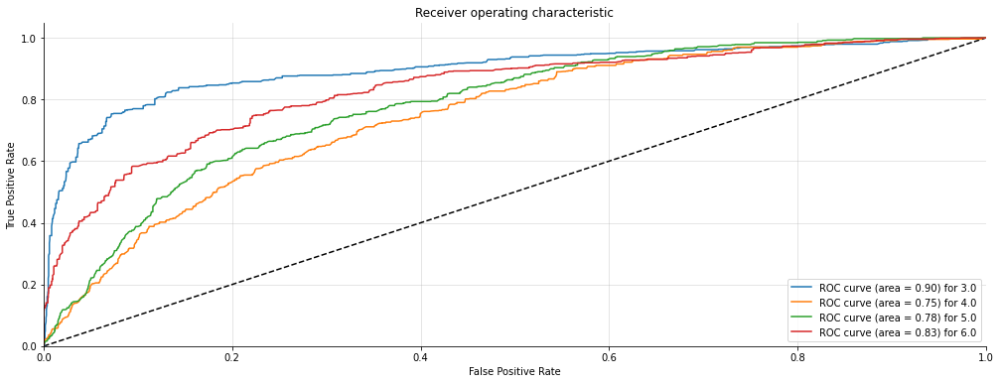

For column: conventional<==>inventive
              precision    recall  f1-score   support

         2.0       0.72      0.84      0.78       832
         3.0       0.53      0.50      0.51       881
         4.0       0.50      0.51      0.51       842
         5.0       0.66      0.58      0.62       805

    accuracy                           0.60      3360
   macro avg       0.60      0.61      0.60      3360
weighted avg       0.60      0.60      0.60      3360

Confusion Matrix: 
 [[695  83  34  20]
 [145 442 202  92]
 [ 62 219 426 135]
 [ 57  96 183 469]]
Accuracy Score : 0.6047619047619047
Precision Score : 0.6006905618052756
Recall Score : 0.6047619047619047
F1 Score : 0.6011705275172359
(3360, 4) (3360, 4)


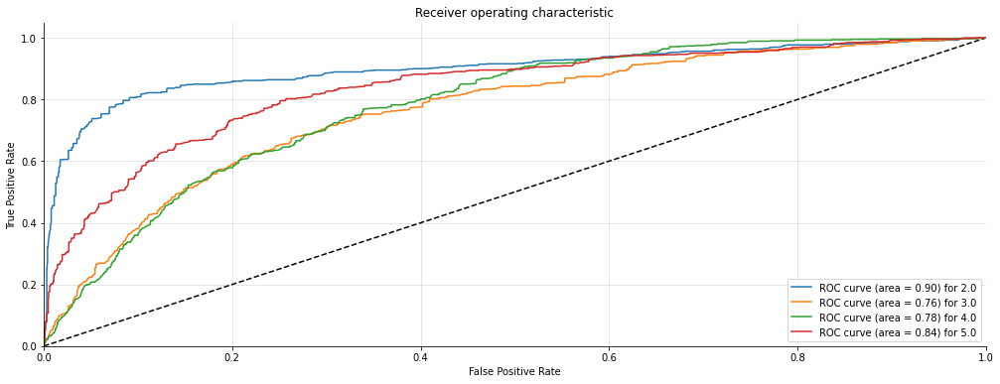

(3360, 4) (3360, 4)


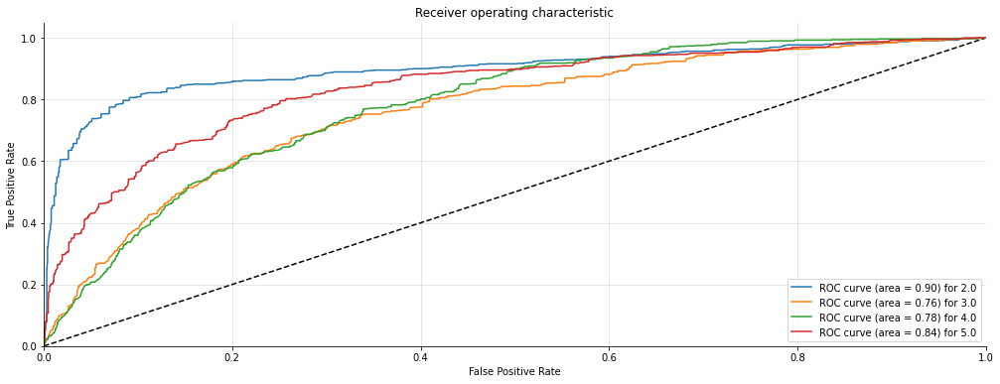

For column: usual<==>leading edge
              precision    recall  f1-score   support

         2.0       0.82      0.94      0.88       675
         3.0       0.70      0.64      0.67       677
         4.0       0.72      0.73      0.73       726
         5.0       0.69      0.69      0.69       637
         6.0       0.71      0.64      0.67       645

    accuracy                           0.73      3360
   macro avg       0.73      0.73      0.73      3360
weighted avg       0.73      0.73      0.73      3360

Confusion Matrix: 
 [[636  11   8   4  16]
 [ 48 436  69  72  52]
 [ 47  46 531  50  52]
 [ 22  64  59 442  50]
 [ 22  65  71  73 414]]
Accuracy Score : 0.731845238095238
Precision Score : 0.7283748073063102
Recall Score : 0.731845238095238
F1 Score : 0.7286936987798303
(3360, 5) (3360, 5)


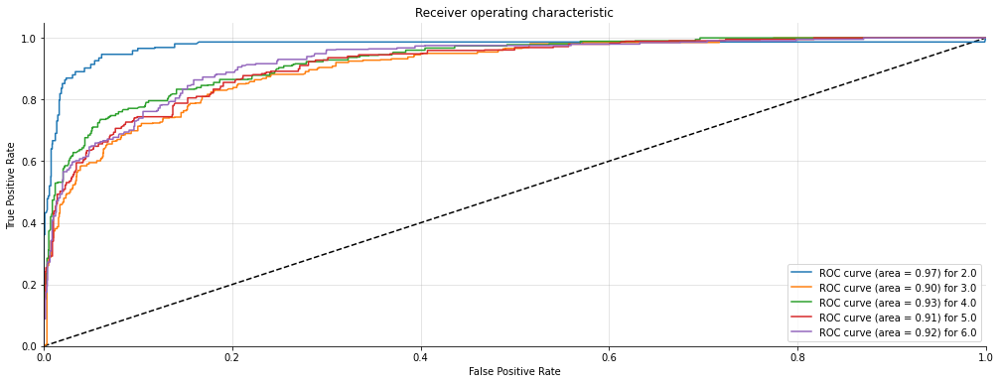

(3360, 5) (3360, 5)


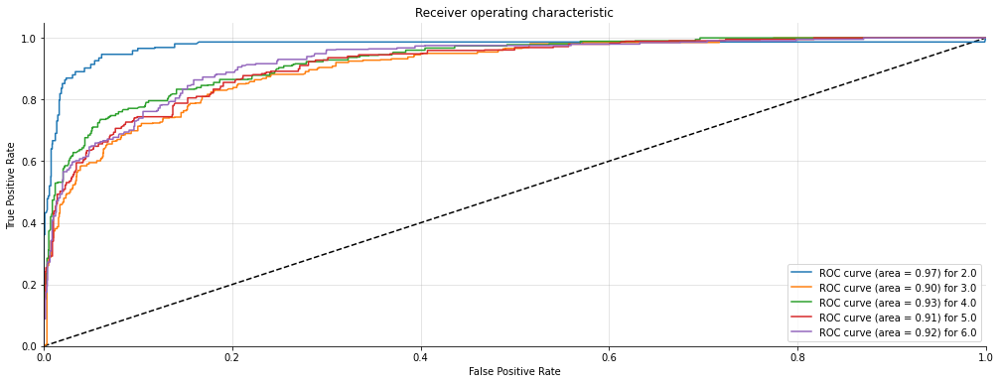

In [106]:
from sklearn.metrics import confusion_matrix,f1_score, precision_score, recall_score, classification_report
from sklearn.metrics import plot_confusion_matrix, accuracy_score
acc=[]
pre=[]
recal=[]
f1=[]
rms=[]
aucscore=[]
fpo=dict()
tpo=dict()
ffpo=[]
ttpo=[]
def GBC(X_train, X_test, y_train, y_test, n_classes, figsize=(8, 6)):
    model = GradientBoostingClassifier(n_estimators=100, learning_rate=1.0,
     max_depth=1, random_state=0)   
    model.fit(X_train, y_train)

    # predictions over test set
    predictions = [round(float(x)) for x in model.predict(X_test)]
    print((classification_report(y_test, predictions)))


    # calculating Accuracy Score, Precision Score, Recall Score and F1 Score
    print('Confusion Matrix: \n' ,confusion_matrix(y_test, predictions))
    acc.append(accuracy_score(y_test, predictions))
    print(f'Accuracy Score : {accuracy_score(y_test, predictions)}')
    pre.append(precision_score(y_test,predictions,average='weighted'))
    print('Precision Score : ' + str(precision_score(y_test,predictions,average='weighted')))
    recal.append(recall_score(y_test,predictions,average='weighted'))
    print('Recall Score : ' + str(recall_score(y_test,predictions,average='weighted')))
    f1.append(f1_score(y_test,predictions,average='weighted'))
    print('F1 Score : ' + str(f1_score(y_test,predictions,average='weighted')))
    rms.append(np.sqrt(mean_squared_error(y_test,predictions)))
    aucscore.append(score_auc(y_test,predictions))
    fpo,tpo=plot_multiclass_roc(model, X_test, y_test, n_classes)
    ffpo.append(fpo)
    ttpo.append(tpo)
    plot_multiclass_roc(model, X_test, y_test, n_classes)

for i in range(8):
  print('For column:', df.columns[1:][i])
  n_classes = len(np.unique(df[df.columns[1:][i]]))
  GBC(X_train, X_test, y_train[:,i], y_test[:,i], n_classes, figsize=(8, 6))

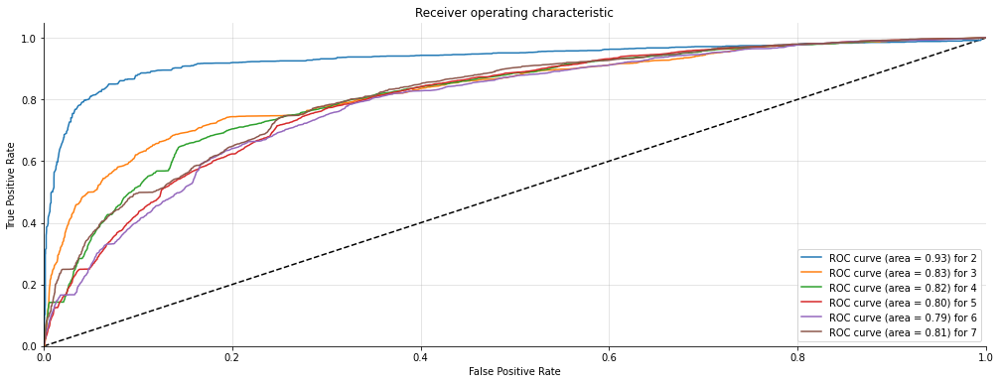

In [107]:
fsum5=list(np.array(dadd(dadd(dadd(ffpo[0][0],ffpo[1][1]),dadd(ffpo[2][1],ffpo[3][1])),dadd(dadd(ffpo[4][2],ffpo[5][2]),dadd(ffpo[6][3],ffpo[7][3]))))/8)
fsum6=list(np.array(dadd(dadd(dadd(ffpo[0][1],ffpo[1][2]),dadd(ffpo[2][2],ffpo[3][2])),dadd(dadd([0],ffpo[5][3]),dadd([0],ffpo[7][4]))))/6)
fsum7=list(np.array(dadd(dadd(dadd(ffpo[0][2],ffpo[1][3]),dadd(ffpo[2][3],ffpo[3][3])),dadd(dadd([0],[0]),dadd([0],[0]))))/4)
fsum4=list(np.array(dadd(dadd(dadd([0],ffpo[1][0]),dadd(ffpo[2][0],ffpo[3][0])),dadd(dadd(ffpo[4][1],ffpo[5][1]),dadd(ffpo[6][2],ffpo[7][2]))))/7)
fsum3=list(np.array(dadd(dadd(dadd([0],[0]),dadd([0],[0])),dadd(dadd(ffpo[4][0],ffpo[5][0]),dadd(ffpo[6][1],ffpo[7][1]))))/4)
fsum2=list(np.array(dadd(dadd(dadd([0],[0]),dadd([0],[0])),dadd(dadd([0],[0]),dadd(ffpo[6][0],ffpo[7][0]))))/2)




fpr=dict()

fsum2.sort()
fpr[0]=fsum2+[1]

fsum3.sort()
fpr[1]=fsum3+[1]

fsum4.sort()
fpr[2]=fsum4+[1]

fsum5.sort()
fpr[3]=fsum5+[1]

fsum6.sort()
fpr[4]=fsum6+[1]

fsum7.sort()
fpr[5]=fsum7+[1]











tsum5=list(np.array(dadd(dadd(dadd(ttpo[0][0],ttpo[1][1]),dadd(ttpo[2][1],ttpo[3][1])),dadd(dadd(ttpo[4][2],ttpo[5][2]),dadd(ttpo[6][3],ttpo[7][3]))))/8)
tsum6=list(np.array(dadd(dadd(dadd(ttpo[0][1],ttpo[1][2]),dadd(ttpo[2][2],ttpo[3][2])),dadd(dadd([0],ttpo[5][3]),dadd([0],ttpo[7][4]))))/6)
tsum7=list(np.array(dadd(dadd(dadd(ttpo[0][2],ttpo[1][3]),dadd(ttpo[2][3],ttpo[3][3])),dadd(dadd([0],[0]),dadd([0],[0]))))/4)
tsum4=list(np.array(dadd(dadd(dadd([0],ttpo[1][0]),dadd(ttpo[2][0],ttpo[3][0])),dadd(dadd(ttpo[4][1],ttpo[5][1]),dadd(ttpo[6][2],ttpo[7][2]))))/7)
tsum3=list(np.array(dadd(dadd(dadd([0],[0]),dadd([0],[0])),dadd(dadd(ttpo[4][0],ttpo[5][0]),dadd(ttpo[6][1],ttpo[7][1]))))/4)
tsum2=list(np.array(dadd(dadd(dadd([0],[0]),dadd([0],[0])),dadd(dadd([0],[0]),dadd(ttpo[6][0],ttpo[7][0]))))/2)


tpr=dict()

tsum2.sort()
tpr[0]=tsum2+[1]

tsum3.sort()
tpr[1]=tsum3+[1]

tsum4.sort()
tpr[2]=tsum4+[1]

tsum5.sort()
tpr[3]=tsum5+[1]

tsum6.sort()
tpr[4]=tsum6+[1]

tsum7.sort()
tpr[5]=tsum7+[1]


plot_multiclass_roc_avg(fpr,tpr,6)

In [108]:
print("average Accuracy :{}".format(np.mean(acc)))
print("average Precision :{}".format(np.mean(pre)))
print("average Recall :{}".format(np.mean(recal)))
print("average F1 -score :{}".format(np.mean(f1)))
print("average RMSE {}".format(np.mean(rms)))
print("average AUC score {}".format(np.mean(aucscore)))
metric_df['GradientBoost'] = [np.mean(acc),np.mean(pre),np.mean(recal),np.mean(f1),np.mean(rms),np.mean(aucscore)]

average Accuracy :0.6301339285714286
average Precision :0.6264409054970108
average Recall :0.6301339285714286
average F1 -score :0.6270433725993506
average RMSE 0.9122544612069989
average AUC score 0.7474725870621841


# 4.7.6 Bagging classfier

In [109]:
from sklearn.ensemble import BaggingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold

For column: obstructive<==>supportive
              precision    recall  f1-score   support

         5.0       0.82      0.85      0.84      1112
         6.0       0.79      0.69      0.74      1171
         7.0       0.81      0.89      0.85      1077

    accuracy                           0.81      3360
   macro avg       0.81      0.81      0.81      3360
weighted avg       0.81      0.81      0.80      3360

Confusion Matrix: 
 [[944 130  38]
 [175 809 187]
 [ 30  89 958]]
Accuracy Score : 0.8068452380952381
Precision Score : 0.8057434504033563
Recall Score : 0.8068452380952381
F1 Score : 0.8045321839092824
Accuracy: 0.796 (0.007)
(3360, 3) (3360, 3)


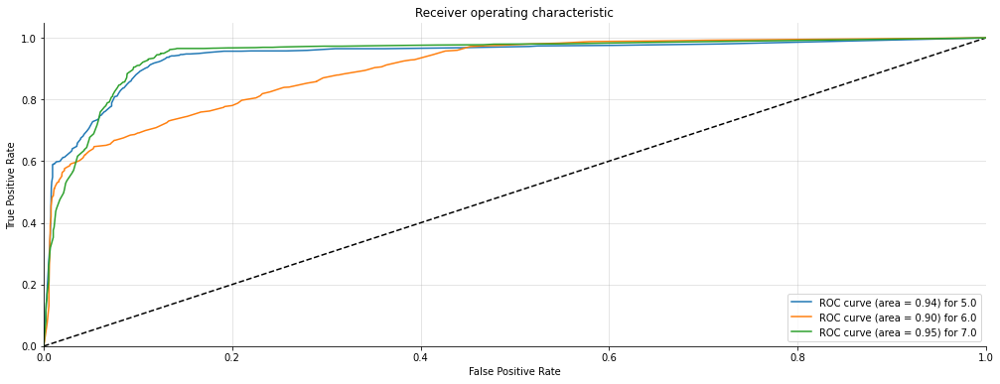

(3360, 3) (3360, 3)


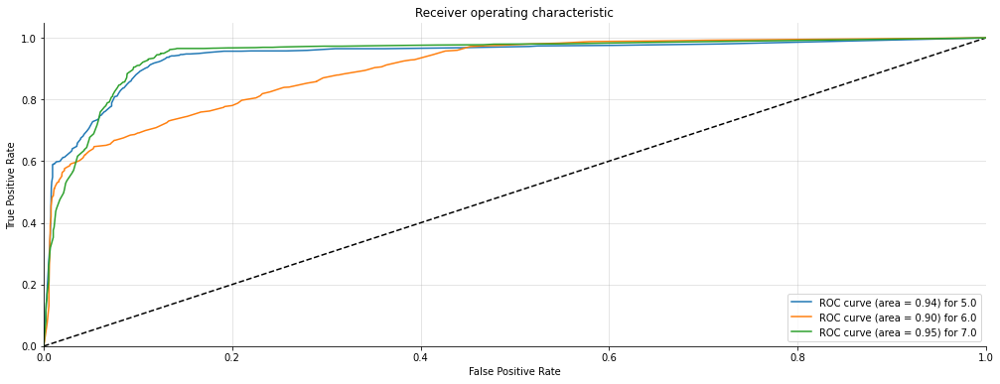

For column: complicated<==>easy
              precision    recall  f1-score   support

         4.0       0.93      0.81      0.86       834
         5.0       0.65      0.72      0.69       875
         6.0       0.62      0.71      0.67       842
         7.0       0.88      0.78      0.82       809

    accuracy                           0.75      3360
   macro avg       0.77      0.75      0.76      3360
weighted avg       0.77      0.75      0.76      3360

Confusion Matrix: 
 [[672 136  18   8]
 [ 37 629 192  17]
 [  4 174 600  64]
 [  8  22 150 629]]
Accuracy Score : 0.7529761904761905
Precision Score : 0.7693455839469947
Recall Score : 0.7529761904761905
F1 Score : 0.7582039910009486
Accuracy: 0.752 (0.012)
(3360, 4) (3360, 4)


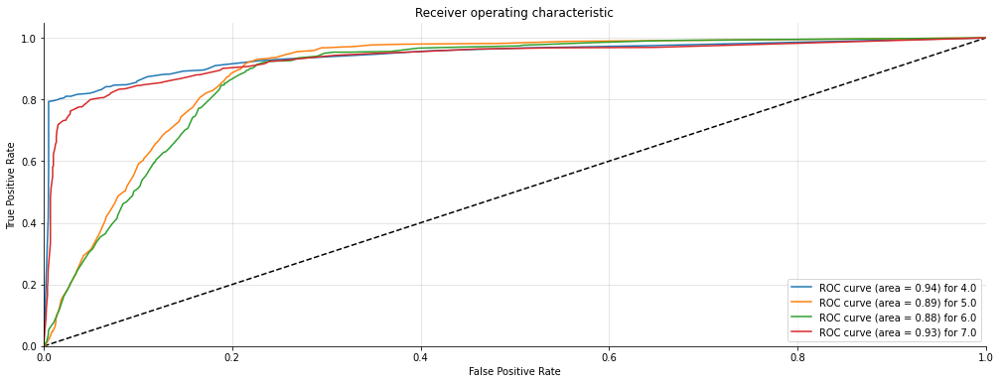

(3360, 4) (3360, 4)


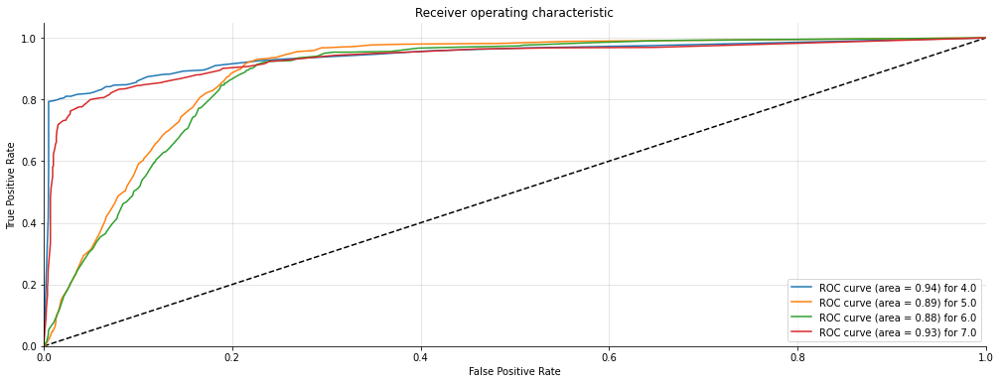

For column: inefficient<==>efficient
              precision    recall  f1-score   support

         4.0       0.92      0.80      0.86       829
         5.0       0.64      0.68      0.66       882
         6.0       0.62      0.69      0.65       847
         7.0       0.83      0.78      0.80       802

    accuracy                           0.74      3360
   macro avg       0.75      0.74      0.74      3360
weighted avg       0.75      0.74      0.74      3360

Confusion Matrix: 
 [[665 138  13  13]
 [ 39 604 200  39]
 [  9 179 585  74]
 [ 10  18 151 623]]
Accuracy Score : 0.737202380952381
Precision Score : 0.7497141087097888
Recall Score : 0.737202380952381
F1 Score : 0.7415409922773797
Accuracy: 0.748 (0.011)
(3360, 4) (3360, 4)


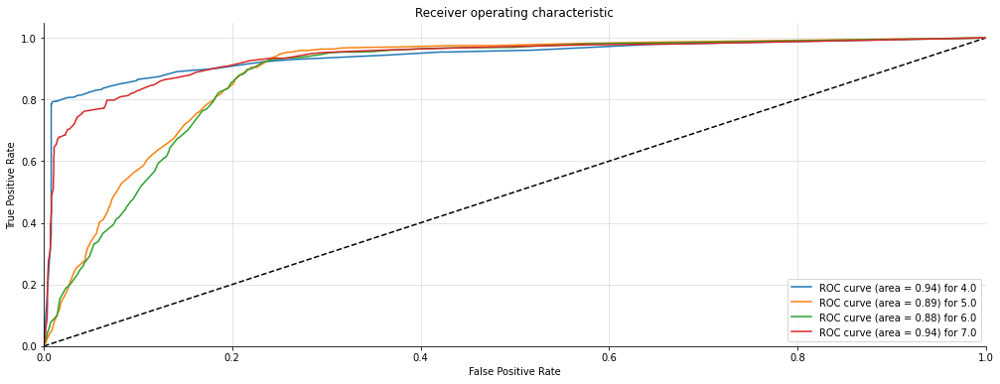

(3360, 4) (3360, 4)


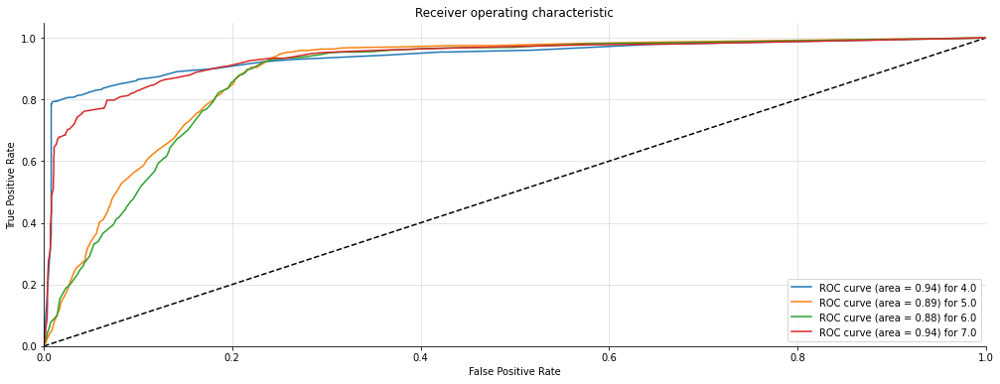

For column:  confusing<==>clear
              precision    recall  f1-score   support

         4.0       0.88      0.80      0.84       839
         5.0       0.59      0.68      0.63       863
         6.0       0.63      0.69      0.66       838
         7.0       0.90      0.76      0.82       820

    accuracy                           0.73      3360
   macro avg       0.75      0.73      0.74      3360
weighted avg       0.75      0.73      0.74      3360

Confusion Matrix: 
 [[670 165   3   1]
 [ 69 588 182  24]
 [ 15 207 575  41]
 [ 10  33 157 620]]
Accuracy Score : 0.7300595238095238
Precision Score : 0.7480252199092711
Recall Score : 0.7300595238095238
F1 Score : 0.7358467084620466
Accuracy: 0.744 (0.010)
(3360, 4) (3360, 4)


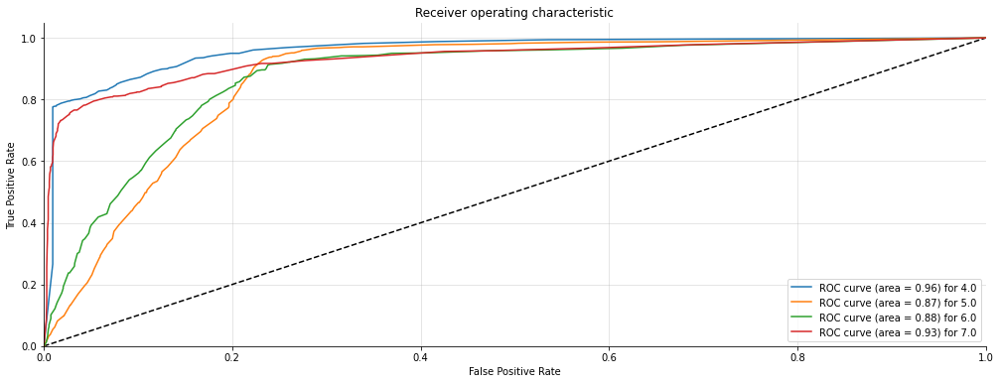

(3360, 4) (3360, 4)


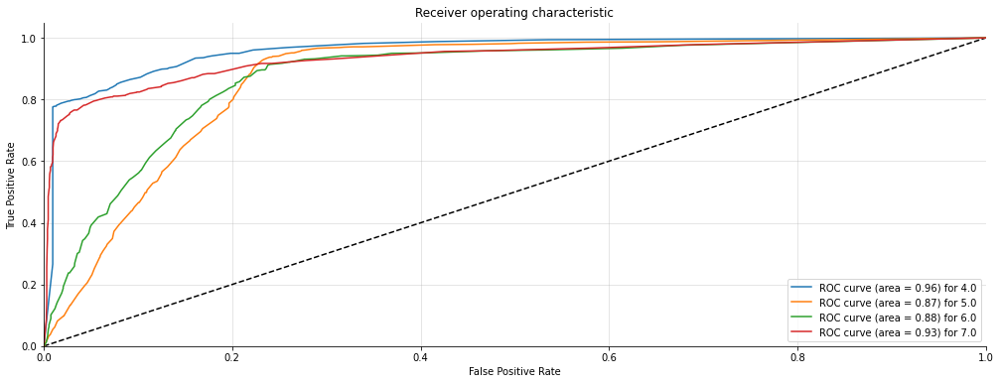

For column: boring<==>exciting
              precision    recall  f1-score   support

         3.0       0.83      0.85      0.84      1121
         4.0       0.79      0.68      0.73      1174
         5.0       0.78      0.88      0.83      1065

    accuracy                           0.80      3360
   macro avg       0.80      0.80      0.80      3360
weighted avg       0.80      0.80      0.80      3360

Confusion Matrix: 
 [[954 125  42]
 [161 794 219]
 [ 32  91 942]]
Accuracy Score : 0.8005952380952381
Precision Score : 0.8003695753926353
Recall Score : 0.8005952380952381
F1 Score : 0.7980264114192686
Accuracy: 0.796 (0.010)
(3360, 3) (3360, 3)


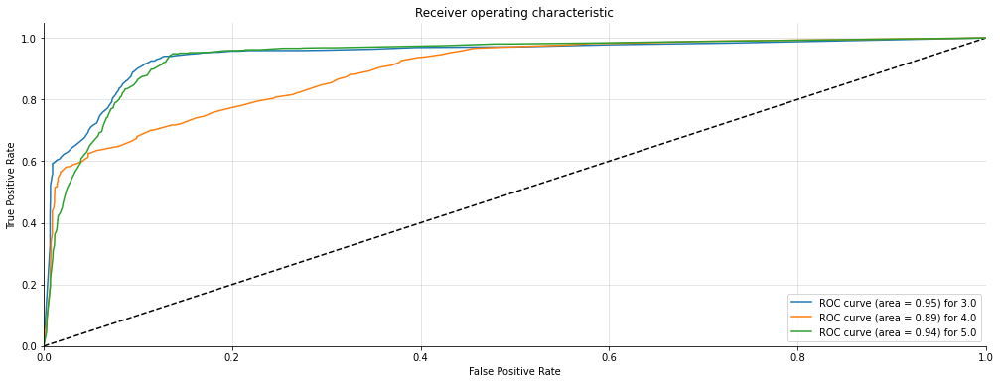

(3360, 3) (3360, 3)


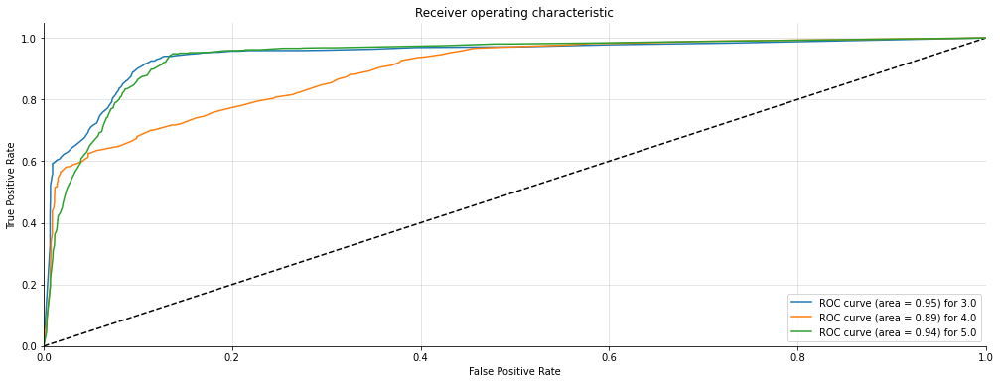

For column: not interesting<==>interesting
              precision    recall  f1-score   support

         3.0       0.90      0.80      0.85       840
         4.0       0.61      0.68      0.64       863
         5.0       0.63      0.70      0.66       838
         6.0       0.89      0.76      0.82       819

    accuracy                           0.74      3360
   macro avg       0.75      0.74      0.74      3360
weighted avg       0.75      0.74      0.74      3360

Confusion Matrix: 
 [[670 164   2   4]
 [ 52 590 192  29]
 [ 12 192 586  48]
 [  9  29 156 625]]
Accuracy Score : 0.7354166666666667
Precision Score : 0.7527904965172197
Recall Score : 0.7354166666666667
F1 Score : 0.7410840094912842
Accuracy: 0.740 (0.011)
(3360, 4) (3360, 4)


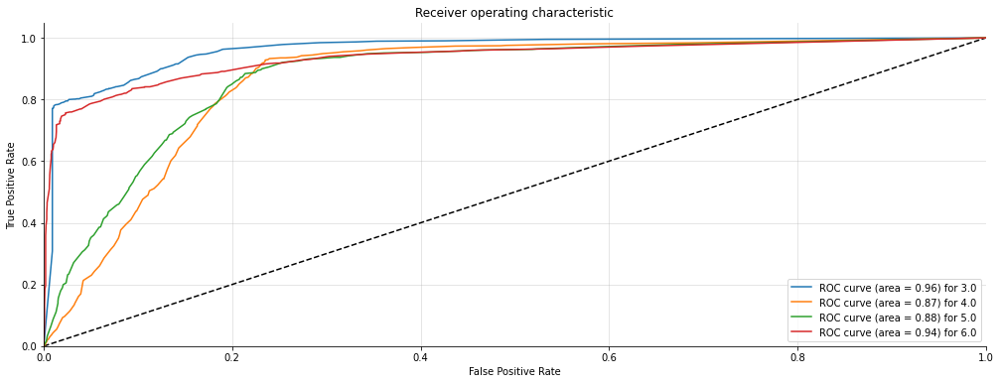

(3360, 4) (3360, 4)


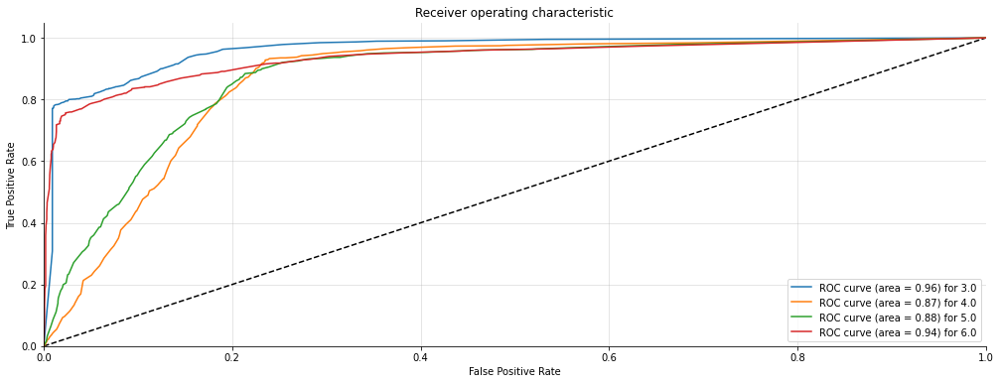

For column: conventional<==>inventive
              precision    recall  f1-score   support

         2.0       0.93      0.81      0.86       832
         3.0       0.65      0.71      0.68       881
         4.0       0.61      0.70      0.65       842
         5.0       0.88      0.78      0.82       805

    accuracy                           0.75      3360
   macro avg       0.77      0.75      0.75      3360
weighted avg       0.76      0.75      0.75      3360

Confusion Matrix: 
 [[671 135  20   6]
 [ 37 622 204  18]
 [  6 179 592  65]
 [  7  18 155 625]]
Accuracy Score : 0.7470238095238095
Precision Score : 0.7639032788948811
Recall Score : 0.7470238095238095
F1 Score : 0.7525401686070334
Accuracy: 0.748 (0.011)
(3360, 4) (3360, 4)


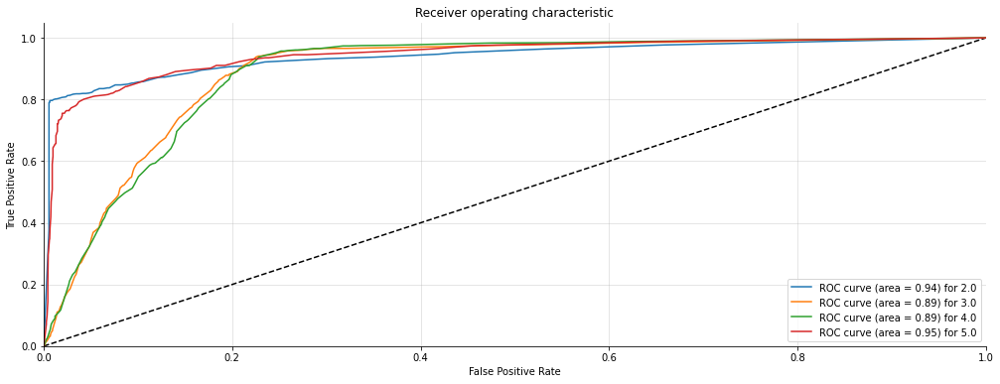

(3360, 4) (3360, 4)


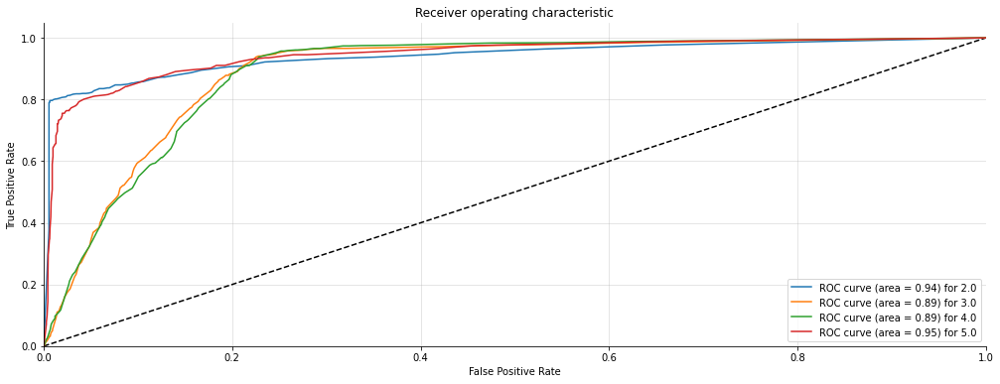

For column: usual<==>leading edge
              precision    recall  f1-score   support

         2.0       0.99      1.00      1.00       675
         3.0       1.00      0.98      0.99       677
         4.0       0.99      1.00      1.00       726
         5.0       0.99      1.00      0.99       637
         6.0       1.00      0.99      0.99       645

    accuracy                           0.99      3360
   macro avg       0.99      0.99      0.99      3360
weighted avg       0.99      0.99      0.99      3360

Confusion Matrix: 
 [[675   0   0   0   0]
 [  5 666   0   6   0]
 [  0   0 726   0   0]
 [  0   0   0 636   1]
 [  0   2   7   0 636]]
Accuracy Score : 0.99375
Precision Score : 0.9937829872821099
Recall Score : 0.99375
F1 Score : 0.9937395846156019
Accuracy: 0.979 (0.008)
(3360, 5) (3360, 5)


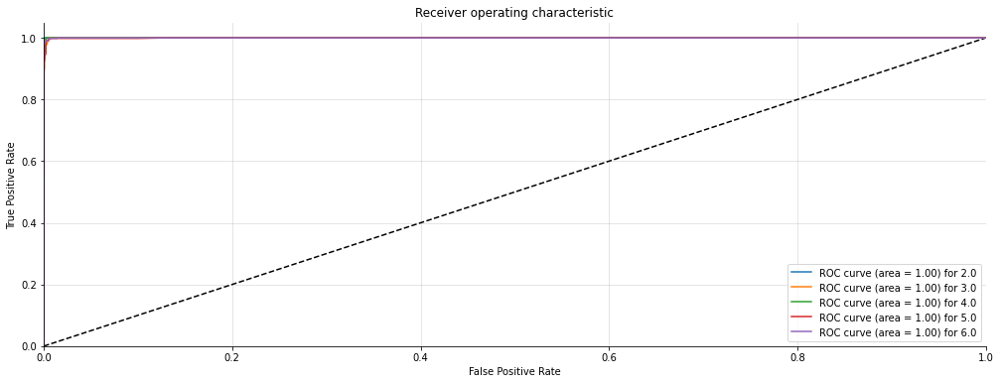

(3360, 5) (3360, 5)


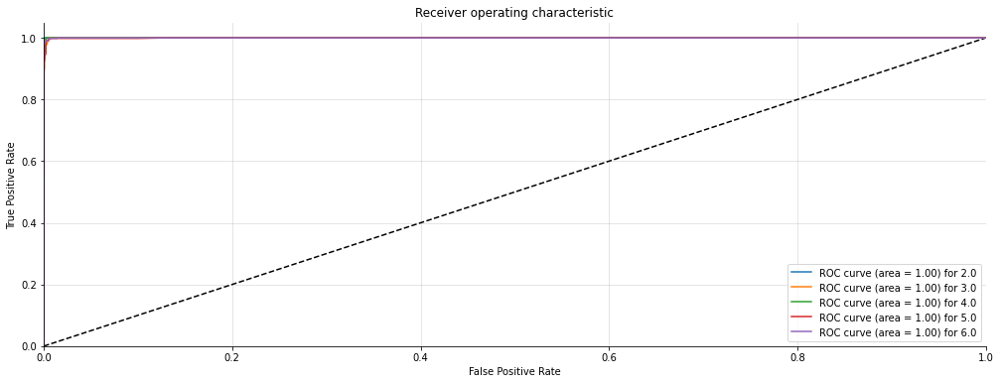

In [110]:
from sklearn.metrics import confusion_matrix,f1_score, precision_score, recall_score, classification_report
from sklearn.metrics import plot_confusion_matrix, accuracy_score
acc=[]
pre=[]
recal=[]
f1=[]
rms=[]
aucscore=[]
fpo=dict()
tpo=dict()
ffpo=[]
ttpo=[]
def BAG(X_train, X_test, y_train, y_test, n_classes, figsize=(8, 6)):
    model = BaggingClassifier(KNeighborsClassifier(), max_samples=0.5, max_features=0.5)   
    model.fit(X_train, y_train)

    # predictions over test set
    predictions = [round(float(x)) for x in model.predict(X_test)]
    print((classification_report(y_test, predictions)))


    # calculating Accuracy Score, Precision Score, Recall Score and F1 Score
    print('Confusion Matrix: \n' ,confusion_matrix(y_test, predictions))
    acc.append(accuracy_score(y_test, predictions))
    print(f'Accuracy Score : {accuracy_score(y_test, predictions)}')
    pre.append(precision_score(y_test,predictions,average='weighted'))
    print('Precision Score : ' + str(precision_score(y_test,predictions,average='weighted')))
    recal.append(recall_score(y_test,predictions,average='weighted'))
    print('Recall Score : ' + str(recall_score(y_test,predictions,average='weighted')))
    f1.append(f1_score(y_test,predictions,average='weighted'))
    print('F1 Score : ' + str(f1_score(y_test,predictions,average='weighted')))
    cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
    n_scores = cross_val_score(model, X_train, y_train, scoring='accuracy', cv=cv, n_jobs=-1, error_score='raise')
    # report performance
    print('Accuracy: %.3f (%.3f)' % (np.mean(n_scores), np.std(n_scores)))
    rms.append(np.sqrt(mean_squared_error(y_test,predictions)))
    aucscore.append(score_auc(y_test,predictions))
    fpo,tpo=plot_multiclass_roc(model, X_test, y_test, n_classes)
    ffpo.append(fpo)
    ttpo.append(tpo)
    plot_multiclass_roc(model, X_test, y_test, n_classes)

for i in range(8):
  print('For column:', df.columns[1:][i])
  n_classes = len(np.unique(df[df.columns[1:][i]]))
  BAG(X_train, X_test, y_train[:,i], y_test[:,i], n_classes, figsize=(8, 6))

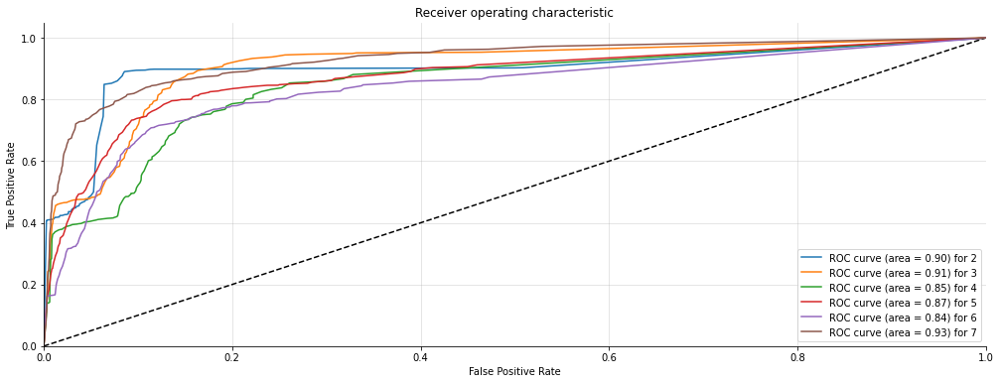

In [111]:
fsum5=list(np.array(dadd(dadd(dadd(ffpo[0][0],ffpo[1][1]),dadd(ffpo[2][1],ffpo[3][1])),dadd(dadd(ffpo[4][2],ffpo[5][2]),dadd(ffpo[6][3],ffpo[7][3]))))/8)
fsum6=list(np.array(dadd(dadd(dadd(ffpo[0][1],ffpo[1][2]),dadd(ffpo[2][2],ffpo[3][2])),dadd(dadd([0],ffpo[5][3]),dadd([0],ffpo[7][4]))))/6)
fsum7=list(np.array(dadd(dadd(dadd(ffpo[0][2],ffpo[1][3]),dadd(ffpo[2][3],ffpo[3][3])),dadd(dadd([0],[0]),dadd([0],[0]))))/4)
fsum4=list(np.array(dadd(dadd(dadd([0],ffpo[1][0]),dadd(ffpo[2][0],ffpo[3][0])),dadd(dadd(ffpo[4][1],ffpo[5][1]),dadd(ffpo[6][2],ffpo[7][2]))))/7)
fsum3=list(np.array(dadd(dadd(dadd([0],[0]),dadd([0],[0])),dadd(dadd(ffpo[4][0],ffpo[5][0]),dadd(ffpo[6][1],ffpo[7][1]))))/4)
fsum2=list(np.array(dadd(dadd(dadd([0],[0]),dadd([0],[0])),dadd(dadd([0],[0]),dadd(ffpo[6][0],ffpo[7][0]))))/2)




fpr=dict()

fsum2.sort()
fpr[0]=fsum2+[1]

fsum3.sort()
fpr[1]=fsum3+[1]

fsum4.sort()
fpr[2]=fsum4+[1]

fsum5.sort()
fpr[3]=fsum5+[1]

fsum6.sort()
fpr[4]=fsum6+[1]

fsum7.sort()
fpr[5]=fsum7+[1]











tsum5=list(np.array(dadd(dadd(dadd(ttpo[0][0],ttpo[1][1]),dadd(ttpo[2][1],ttpo[3][1])),dadd(dadd(ttpo[4][2],ttpo[5][2]),dadd(ttpo[6][3],ttpo[7][3]))))/8)
tsum6=list(np.array(dadd(dadd(dadd(ttpo[0][1],ttpo[1][2]),dadd(ttpo[2][2],ttpo[3][2])),dadd(dadd([0],ttpo[5][3]),dadd([0],ttpo[7][4]))))/6)
tsum7=list(np.array(dadd(dadd(dadd(ttpo[0][2],ttpo[1][3]),dadd(ttpo[2][3],ttpo[3][3])),dadd(dadd([0],[0]),dadd([0],[0]))))/4)
tsum4=list(np.array(dadd(dadd(dadd([0],ttpo[1][0]),dadd(ttpo[2][0],ttpo[3][0])),dadd(dadd(ttpo[4][1],ttpo[5][1]),dadd(ttpo[6][2],ttpo[7][2]))))/7)
tsum3=list(np.array(dadd(dadd(dadd([0],[0]),dadd([0],[0])),dadd(dadd(ttpo[4][0],ttpo[5][0]),dadd(ttpo[6][1],ttpo[7][1]))))/4)
tsum2=list(np.array(dadd(dadd(dadd([0],[0]),dadd([0],[0])),dadd(dadd([0],[0]),dadd(ttpo[6][0],ttpo[7][0]))))/2)


tpr=dict()

tsum2.sort()
tpr[0]=tsum2+[1]

tsum3.sort()
tpr[1]=tsum3+[1]

tsum4.sort()
tpr[2]=tsum4+[1]

tsum5.sort()
tpr[3]=tsum5+[1]

tsum6.sort()
tpr[4]=tsum6+[1]

tsum7.sort()
tpr[5]=tsum7+[1]


plot_multiclass_roc_avg(fpr,tpr,6)

In [112]:
print("average Accuracy :{}".format(np.mean(acc)))
print("average Precision :{}".format(np.mean(pre)))
print("average Recall :{}".format(np.mean(recal)))
print("average F1 -score :{}".format(np.mean(f1)))
print("average RMSE {}".format(np.mean(rms)))
print("average AUC score {}".format(np.mean(aucscore)))
metric_df['BaggingClassifier'] = [np.mean(acc),np.mean(pre),np.mean(recal),np.mean(f1),np.mean(rms),np.mean(aucscore)]

average Accuracy :0.7879836309523809
average Precision :0.7979593376320322
average Recall :0.7879836309523809
average F1 -score :0.7906892562228556
average RMSE 0.5200140493361287
average AUC score 0.8541645051892653


In [113]:
metric_df

,metric,Neural network classifier,XGB,SVM,OrdinalModel,Bidirectional LSTM,RBFN,LogisticModel,Neural Network classifier 2,Bidirectional LSTM 2,DecisionTreeclasssifier,RandomForestClassifier,ExtraTreesClassifier,AdaBoost,GradientBoost,BaggingClassifier
0,Accuracy,0.740774,0.799740,0.727827,0.799702,0.785305,0.285677,0.334747,0.761868,0.776190,0.798921,0.801972,0.798921,0.604129,0.630134,0.787984
1,Precision,0.780941,0.812366,0.741033,0.812487,0.805969,0.703848,0.331069,0.789358,0.799515,0.813137,0.816517,0.813137,0.607040,0.626441,0.797959
2,Recall,0.740774,0.799740,0.727827,0.799702,0.785305,0.285677,0.334747,0.761868,0.776190,0.798921,0.801972,0.798921,0.604129,0.630134,0.787984
3,F1 Score,0.745291,0.802416,0.731003,0.802450,0.789904,0.148130,0.330067,0.766486,0.779755,0.801849,0.804965,0.801849,0.604790,0.627043,0.790689
4,RMSE,0.571515,0.490967,0.681726,0.487045,0.511858,1.124380,1.484205,0.551057,0.529641,0.486471,0.483569,0.486471,0.912376,0.912254,0.520014
5,AUC score,0.822676,0.862210,0.813826,0.862205,0.851550,0.510304,0.547843,0.837099,0.845057,0.861637,0.863716,0.861637,0.731744,0.747473,0.854165


# CNN 1

In [114]:
filters=250
lstm_units=200
kernel_size=4

In [27]:
import nltk
import spacy

In [28]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, labels_processed, test_size=0.2, random_state=42)

# Sanity check again and again
print("Training examples:", X_train.shape)
print("Training labels:", y_train.shape)
print("Test examples:", X_test.shape)
print("Test labels:", y_test.shape)

Training examples: (13440, 40)
Training labels: (13440, 8)
Test examples: (3360, 40)
Test labels: (3360, 8)


In [29]:
word_index = tokenizer.word_index
nlp = spacy.load("en_core_web_lg")

In [30]:
text_embedding = np.zeros((len(word_index) + 1, 300))
for word, i in word_index.items():
   text_embedding[i] = nlp(word).vector

In [119]:
from tensorflow.keras.models import Sequential,Model
from tensorflow.keras.layers import Dense, LSTM, Embedding,Dropout,SpatialDropout1D,Conv1D,MaxPooling1D,GRU,BatchNormalization
from tensorflow.keras.layers import Input,Bidirectional,GlobalAveragePooling1D,GlobalMaxPooling1D,concatenate,LeakyReLU
from tensorflow.keras import regularizers
from tensorflow.keras import backend as K
model = Sequential()
model.add(
Embedding(input_dim=text_embedding.shape[0],
output_dim=text_embedding.shape[1],
weights=[text_embedding],
input_length=20,
trainable=False))
# model.add(SpatialDropout1D(0.2))
model.add(Conv1D(filters, kernel_size=kernel_size,kernel_regularizer=regularizers.l2(0.001), padding='same'))
model.add(LeakyReLU(alpha=0.2))
model.add(MaxPooling1D(pool_size=2))
# model.add(Bidirectional(LSTM(lstm_units,dropout=0.5, recurrent_dropout=0.5,return_sequences=True)))
# model.add(SpatialDropout1D(0.2))
# model.add(Conv1D(filters, kernel_size=kernel_size,kernel_regularizer=regularizers.l2(0.01), padding='same'))
# model.add(LeakyReLU(alpha=0.2))
# model.add(MaxPooling1D(pool_size=2))
# model.add(Bidirectional(LSTM(lstm_units,dropout=0.5, recurrent_dropout=0.5,return_sequences=True)))
# model.add(SpatialDropout1D(0.2))
model.add(Conv1D(filters, kernel_size=kernel_size,kernel_regularizer=regularizers.l2(0.001), padding='same'))
model.add(LeakyReLU(alpha=0.2))
model.add(MaxPooling1D(pool_size=2))
model.add(Bidirectional(LSTM(lstm_units,dropout=0.5, recurrent_dropout=0.5)))
model.add(Dense(8,activation='softmax'))
model.compile(optimizer='adam',loss=tf.keras.losses.MeanSquaredError(), metrics=['mae'])

In [120]:
model = Sequential()
 
model.add(
Embedding(input_dim=text_embedding.shape[0],
output_dim=text_embedding.shape[1],
weights=[text_embedding],
input_length=20,
trainable=False))
model.add(Conv1D(filters,
kernel_size,
padding='valid',
activation='relu',
strides=1))
# we use max pooling:
model.add(GlobalMaxPooling1D())
# We add a hidden layer:
model.add(Dense(lstm_units))
#dropout layer woth 20% dropout rate
model.add(Dropout(0.2))
model.add(Activation('relu'))
#output layer
model.add(Dense(8))
model.add(Activation('softmax'))
model.compile(optimizer='adam',loss=tf.keras.losses.MeanSquaredError(), metrics=['mae'])
              

In [121]:
model.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_3 (Embedding)      (None, 20, 300)           793800    
_________________________________________________________________
conv1d_2 (Conv1D)            (None, 17, 250)           300250    
_________________________________________________________________
global_max_pooling1d (Global (None, 250)               0         
_________________________________________________________________
dense_21 (Dense)             (None, 200)               50200     
_________________________________________________________________
dropout_11 (Dropout)         (None, 200)               0         
_________________________________________________________________
module_wrapper (ModuleWrappe (None, 200)               0         
_________________________________________________________________
dense_22 (Dense)             (None, 8)                

In [122]:
history = model.fit(X_train, y_train, epochs=100, batch_size = 512, validation_split=0.2, 
                    callbacks = [es], # Call checkpoint variable if neccessary
                    verbose=1)

Epoch 1/100
21/21 [==============================] - 3s 127ms/step - loss: 23.7879 - mae: 4.6907 - val_loss: 23.7819 - val_mae: 4.6957
Epoch 2/100
21/21 [==============================] - 3s 119ms/step - loss: 23.7562 - mae: 4.6907 - val_loss: 23.7618 - val_mae: 4.6957
Epoch 3/100
21/21 [==============================] - 3s 121ms/step - loss: 23.7461 - mae: 4.6907 - val_loss: 23.7575 - val_mae: 4.6957
Epoch 4/100
21/21 [==============================] - 3s 121ms/step - loss: 23.7423 - mae: 4.6907 - val_loss: 23.7558 - val_mae: 4.6957
Epoch 5/100
21/21 [==============================] - 3s 124ms/step - loss: 23.7405 - mae: 4.6907 - val_loss: 23.7555 - val_mae: 4.6957
Epoch 6/100
21/21 [==============================] - 3s 128ms/step - loss: 23.7390 - mae: 4.6907 - val_loss: 23.7554 - val_mae: 4.6957
Epoch 7/100
21/21 [==============================] - 3s 136ms/step - loss: 23.7385 - mae: 4.6907 - val_loss: 23.7550 - val_mae: 4.6957
Epoch 8/100
21/21 [==============================] - 3s

In [123]:
scores = model.evaluate(
    X_test, y_test, batch_size=1, verbose=1, sample_weight=None, steps=None,
    callbacks=None, max_queue_size=10, workers=4, use_multiprocessing=False,
    return_dict=False
)
print("------------------ EVALUATION FINISHED! ------------------".center(115))
for i in range(len(scores)):
    print("%s: %.2f%%" % (model.metrics_names[i], scores[i]*100))

3360/3360 [==============================] - ETA: 0s - loss: 23.5247 - mae: 4.67 - 3s 986us/step - loss: 23.5260 - mae: 4.6708
                             ------------------ EVALUATION FINISHED! ------------------                            
loss: 2352.60%
mae: 467.08%


In [124]:
from sklearn.metrics import confusion_matrix,f1_score, precision_score, recall_score, classification_report
from sklearn.metrics import plot_confusion_matrix, accuracy_score
from sklearn.metrics import mean_squared_error
acc=[]
pre=[]
recal=[]
f1=[]
rms=[]
aucscore=[]

In [125]:
from sklearn.metrics import classification_report, f1_score
y_pred = model.predict(X_test)
for i in range(8):
    print("Column", df.columns[1:][i])
    estimates = [round(float(x)) for x in y_pred[:,i]]
    estimates = transform_results(estimates)
    print(np.unique(estimates))
    acc.append(accuracy_score(y_test[:,i], estimates))
    pre.append(precision_score(y_test[:,i], estimates,average='weighted'))
    recal.append(recall_score(y_test[:,i], estimates,average='weighted'))
    f1.append(f1_score(y_test[:,i], estimates,average='weighted'))
    rms.append(np.sqrt(mean_squared_error(y_test[:,i], estimates)))
    aucscore.append(score_auc(y_test[:,i], estimates))
    print(classification_report(y_test[:,i], estimates), "\n------")

Column obstructive<==>supportive
[0 1]
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00       0.0
         1.0       0.00      0.00      0.00       0.0
         5.0       0.00      0.00      0.00    1112.0
         6.0       0.00      0.00      0.00    1171.0
         7.0       0.00      0.00      0.00    1077.0

    accuracy                           0.00    3360.0
   macro avg       0.00      0.00      0.00    3360.0
weighted avg       0.00      0.00      0.00    3360.0
 
------
Column complicated<==>easy
[0]
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00       0.0
         4.0       0.00      0.00      0.00     834.0
         5.0       0.00      0.00      0.00     875.0
         6.0       0.00      0.00      0.00     842.0
         7.0       0.00      0.00      0.00     809.0

    accuracy                           0.00    3360.0
   macro avg       0.00      0.00      0.00    3360.0

In [126]:
print("average Accuracy :{}".format(np.mean(acc)))
print("average Precision :{}".format(np.mean(pre)))
print("average Recall :{}".format(np.mean(recal)))
print("average F1 -score :{}".format(np.mean(f1)))
print("average RMSE -score :{}".format(np.mean(rms)))
print("average AUC -score :{}".format(np.mean(aucscore)))
metric_df['CNN classifier'] = [np.mean(acc),np.mean(pre),np.mean(recal),np.mean(f1),np.mean(rms),np.mean(aucscore)]

average Accuracy :0.0
average Precision :0.0
average Recall :0.0
average F1 -score :0.0
average RMSE -score :4.846633397238809
average AUC -score :0.5


# Metric Display

In [127]:
metric_df

,metric,Neural network classifier,XGB,SVM,OrdinalModel,Bidirectional LSTM,RBFN,LogisticModel,Neural Network classifier 2,Bidirectional LSTM 2,DecisionTreeclasssifier,RandomForestClassifier,ExtraTreesClassifier,AdaBoost,GradientBoost,BaggingClassifier,CNN classifier
0,Accuracy,0.740774,0.799740,0.727827,0.799702,0.785305,0.285677,0.334747,0.761868,0.776190,0.798921,0.801972,0.798921,0.604129,0.630134,0.787984,0.000000
1,Precision,0.780941,0.812366,0.741033,0.812487,0.805969,0.703848,0.331069,0.789358,0.799515,0.813137,0.816517,0.813137,0.607040,0.626441,0.797959,0.000000
2,Recall,0.740774,0.799740,0.727827,0.799702,0.785305,0.285677,0.334747,0.761868,0.776190,0.798921,0.801972,0.798921,0.604129,0.630134,0.787984,0.000000
3,F1 Score,0.745291,0.802416,0.731003,0.802450,0.789904,0.148130,0.330067,0.766486,0.779755,0.801849,0.804965,0.801849,0.604790,0.627043,0.790689,0.000000
4,RMSE,0.571515,0.490967,0.681726,0.487045,0.511858,1.124380,1.484205,0.551057,0.529641,0.486471,0.483569,0.486471,0.912376,0.912254,0.520014,4.846633
5,AUC score,0.822676,0.862210,0.813826,0.862205,0.851550,0.510304,0.547843,0.837099,0.845057,0.861637,0.863716,0.861637,0.731744,0.747473,0.854165,0.500000


In [31]:
import tensorflow as tf

from tensorflow.keras import layers
from tensorflow.keras import losses
from tensorflow.keras import preprocessing
from tensorflow.keras.layers.experimental.preprocessing import TextVectorization

(2646, 300)

In [69]:
model.compile(optimizer='adam',loss=tf.keras.losses.MeanSquaredError(), metrics=['mae'])
es = tf.keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=7)


In [70]:
history = model.fit(X_train, y_train, epochs=10, batch_size = 256, validation_split=0.2, 
                    callbacks = [es], # Call checkpoint variable if neccessary
                    verbose=1)

Epoch 1/10
42/42 [==============================] - 11s 225ms/step - loss: 24.0364 - mae: 4.6907 - val_loss: 23.8802 - val_mae: 4.6957
Epoch 2/10
42/42 [==============================] - 9s 214ms/step - loss: 23.8173 - mae: 4.6907 - val_loss: 23.7950 - val_mae: 4.6957
Epoch 3/10
42/42 [==============================] - 9s 215ms/step - loss: 23.7689 - mae: 4.6907 - val_loss: 23.7724 - val_mae: 4.6957
Epoch 4/10
42/42 [==============================] - 10s 230ms/step - loss: 23.7556 - mae: 4.6907 - val_loss: 23.7658 - val_mae: 4.6957
Epoch 5/10
42/42 [==============================] - 10s 237ms/step - loss: 23.7509 - mae: 4.6907 - val_loss: 23.7635 - val_mae: 4.6957
Epoch 6/10
42/42 [==============================] - 12s 291ms/step - loss: 23.7489 - mae: 4.6907 - val_loss: 23.7626 - val_mae: 4.6957
Epoch 7/10
42/42 [==============================] - 11s 263ms/step - loss: 23.7475 - mae: 4.6907 - val_loss: 23.7616 - val_mae: 4.6957
Epoch 8/10
42/42 [==============================] - 11s 2

0       As a administrator I can refund sponsorship mo...
1       As a administrator I can create and maintain v...
2       As a administrator I can assign sponsors to ev...
3       As a administrator I can tag my blog posts for...
4       As a administrator I can create blog posts so ...
                              ...                        
1023    As a Developer I can have automated workflows ...
1024    As a Developer I can build a framework for cal...
1025    As a User I can integrate my accounts from oth...
1026    As a Developer I can build SDK so that I can a...
1027    As a Business Owner I can see the performance ...
Name: Requirements, Length: 1028, dtype: object